<h5><center> Facylté des sciences - Université de Montpellier - Master Informatique</center> </h5>

# <h1><center> PROJET SCIENCES DES  DONNÉES </center> </h1>

<h3><center> Classification d'assertions selon leur valeurs de véracité (fact-checking)</center> </h3>

<p><center>
    Réalisé par :<br/><br/>
    <em>
        Elbachir REHHALI  : 21812980 <br/>
        Mohamed HASSAN IBRAHIM  : 21914461 <br/>
        Karim DAHDOUH  :  21914506 <br/>
        Thierno BARRY : 21914683 <br/>
    </em> 
</center></p>

<br/><br/><br/>
<p><center>
    Année anniversaire 2019-2020
</center></p>

<br/><br/>

<h2><center> Importation des Modules utils pour faire de l'apprentissage supervisé </center></h2> 

Roles de quelques modules :
* Pandas : Pandas est une bibliothèque python permettant la manipulation et l'analyse des données. Elle propose en particulier des structures de données et des opérations de manipulation de tableaux numériques et de séries temporelles.
* Numpy : destinée à manipuler des matrices ou tableaux multidimensionnels ainsi que des fonctions mathématiques opérant sur ces tableaux.
* NLTK: aussi appelé Natural language Toolkit est une bibliothèque python pour le traitement automatique des langues.
* scikit learn : c'est une bibliothèque libre Python destinée à l'apprentissage automatique.C'est donc elle nous ferons l'apprentissage.
* etc.

In [125]:

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

import pickle
import pandas as pd
pd.options.mode.chained_assignment = None # pour désactiver warning
import numpy as np
from nltk.tokenize import word_tokenize
import nltk
from nltk.stem import WordNetLemmatizer
stemmer = WordNetLemmatizer()
#nltk.download()
import unicodedata
import re
import inflect
from collections import Counter
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import StandardScaler
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.svm import LinearSVC
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier

from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, f1_score


from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from time import time

import matplotlib.pyplot as plot
import seaborn as sns
import altair as alt


from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler

from sklearn.preprocessing import FunctionTransformer
from sklearn.pipeline import FeatureUnion, Pipeline


<h2><center> Importation du dataset avec les colonnes qui nous interessent. </center></h2> 


In [126]:
url="claimskg_result.csv"
df = pd.read_csv(url, usecols=["text", "headline", "truthRating", "source", "keywords", "author"], nrows=2000)
df_part2 = df  # utiliser dans deuxieme partie de notebook
# Dimension de notre dataFrame 
print("shape: ", df.shape)
display(df.head())


shape:  (2000, 6)


,text,author,headline,keywords,source,truthRating
0,Malia Obama cashed a $1.2 million tax refund c...,Unknown,Did Malia Obama Cash a $1.2 Million Check?,NaN,truthorfiction,-1
1,High diver is saved from jumping into a draine...,Unknown,High Diver Saved By Cross,ASP Article,snopes,-1
2,'And the revenue generated by drilling off Vir...,Jim Moran,Moran says drilling off Virginia's coast will ...,"Energy,State Finances",politifact,2
3,Health insurance companies pay CEOs $24 millio...,Health Care for America Now,Health care advocacy group blasts insurers for...,"Corporations,Health Care",politifact,2
4,Ted Cruz said that veterans should start selli...,Unknown,Ted Cruz: Vets Should Sell Cookies for Funding...,"ASP Article, Not Necessarily The News",snopes,1


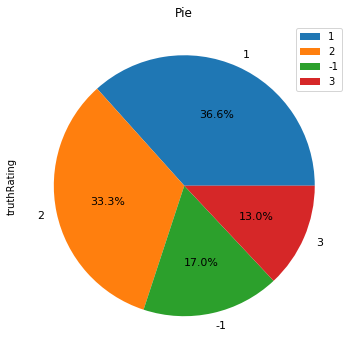

In [127]:
df['truthRating'].value_counts().plot(kind='pie',
figsize=(6,6),
title='Pie',
fontsize=11,
legend=True,
autopct='%1.1f%%')

plot.show()


<h2><center> <br/><br/><br/> Partie 1: Dataset (TRUE & FALSE)   <br/><br/> </center></h2> 


 
Comme l'indique le sujet, nous devons faire deux classifications binaires qui sont:
        -TRUE vs FALSE
        -TRUE & FALSE vs MIXTURE
    Nous avons donc commencé par TRUE vs FALSE

In [128]:
#filter dataframe pour récuperer que les TRUE & FALSE dont on a besoin.
df = df[(df['truthRating'] == 3) | (df['truthRating'] == 1)] 
df_v2 = df
# La nouvelle taille de notre DataFrame
print(df.shape)
# Affihage du nouveau dataframe obtenu après le filtrage.
display(df)

(993, 6)


,text,author,headline,keywords,source,truthRating
4,Ted Cruz said that veterans should start selli...,Unknown,Ted Cruz: Vets Should Sell Cookies for Funding...,"ASP Article, Not Necessarily The News",snopes,1
7,'The Georgia Lottery Corp. has only once in th...,Allie McCullen,Luck runs out for student on lottery claim,Education,politifact,1
9,Panda Express will be celebrating its 15th ann...,Unknown,Panda Express 15th Anniversary Offer,"ASP Article, something for nothing",snopes,1
10,'There’s no money' for Planned Parenthood in t...,Tom Cole,Is there Planned Parenthood funding in the bil...,"Abortion,Congress,Congressional Rules,Federal ...",politifact,3
11,"'In 2010 alone, 1,270 infants were reported to...",Americans United for Life,"Americans United for Life says 1,270 babies di...",Abortion,politifact,1
...,...,...,...,...,...,...
1994,Even among 'second and third generation' Musli...,Donald Trump,Donald Trump wrong that 'there's no real assim...,"Diversity,Immigration,Religion",politifact,1
1996,Astronaut Buzz Aldrin admitted the Apollo 11 m...,Unknown,Buzz Aldrin Admits Apollo 11 Moon Landings Wer...,"ASP Article, Not Necessarily The News",snopes,1
1997,McDonald's released a holiday cup that uninten...,Unknown,Did McDonald’s 2016 Holiday Cups Include a Ris...,mcdonald's,snopes,1
1998,Could Nigeria build 774 health centres with se...,Unknown,Could Nigeria build 774 health centres with se...,"corruption, government, health, nigeria",africacheck,1


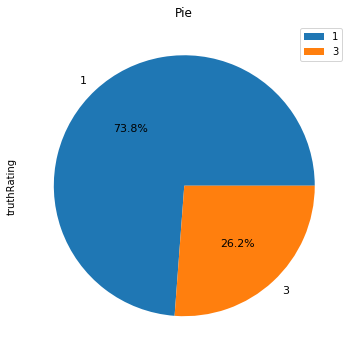

In [129]:
df['truthRating'].value_counts().plot(kind='pie',
figsize=(6,6),
title='Pie',
fontsize=11,
legend=True,
autopct='%1.1f%%')

plot.show()

le 1 represente une assertion fause marquée(FALSE) et le 3 une assertion vraie(TRUE) nous constatons donc une grande différence entre les deux classes.

<h2><center> <br/><br/><br/> Version 1: sans appliquer les prétraitements des données  <br/><br/> </center></h2> 



##  Préparation et Test de notre modèle avec la feature principale text 

In [130]:
vectorizer = TfidfVectorizer()
vectors = vectorizer.fit_transform(df.text)
#Specification des variables à prédire et de la classe X et y
X = vectors.toarray()

y = df.truthRating


### Création des datasets d'apprentissage et de test
On est en apprentissage supervisé et il est récommendé de faire de l'apprentissage sur 70% de nos données et ensuite tester notre modèle sur les 30%.

In [131]:
from sklearn.model_selection import train_test_split 

validation_size=0.7 #30% du jeu de données pour le test

testsize= 1-validation_size
seed=30
X_train,X_test,y_train,y_test=train_test_split(X, 
                                               y, 
                                               train_size=validation_size, 
                                               random_state=seed,
                                               test_size=testsize)

### Classifieur Gaussian Naive Bayes & Sa matrice de confusion

/home/karim/env/lib/python3.6/site-packages/sklearn/metrics/_classification.py:1321: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'micro'). You may use labels=[pos_label] to specify a single positive class.
  % (pos_label, average), UserWarning)


F1 score(Accuracy):  0.697986577181208

 matrice de confusion 
 [[186  46]
 [ 44  22]]

               precision    recall  f1-score   support

           1       0.81      0.80      0.81       232
           3       0.32      0.33      0.33        66

    accuracy                           0.70       298
   macro avg       0.57      0.57      0.57       298
weighted avg       0.70      0.70      0.70       298



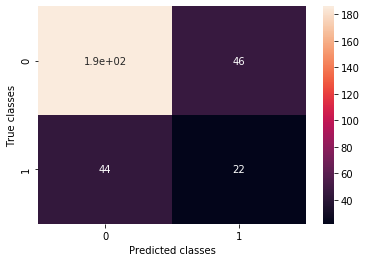

In [132]:
clf = GaussianNB()
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
print('F1 score(Accuracy): ', f1_score(y_test, y_pred, pos_label='positive', average='micro'))

## classification report
conf = confusion_matrix(y_test, y_pred)
print ('\n matrice de confusion \n',conf)

print ('\n',classification_report(y_test, 
                                  y_pred))

## classification chart
sns.heatmap(confusion_matrix(y_test, y_pred),annot=True)
plot.ylabel('True classes')
plot.xlabel('Predicted classes')
plot.show()

###  Préparation et Test de notre modèle avec la feature principale text et d'autres metadata toujours sans prétraitement

### Variables d'appprentissage et de prédiction

On définit les variables d'apprentissage et la variable à prédire. truthRating est la variable à prédire. 
et les autres à savoir le texte et les metadata sont les variables utilisées pour faire l'apprentissage en vue d'arriver à prédire la véracité d'un article.

### ***Chercher et enlever les valeurs manquantes***

Suppression des lignes pour lesquelles au moins un élément est manquant 

nombre de ligne supprimer =  68


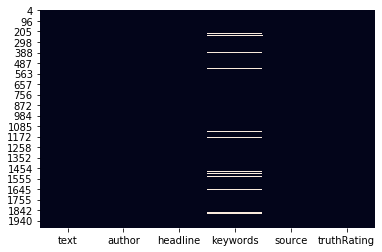

In [133]:
sns.heatmap(df.isnull(), cbar=False)
count_row_orig = df.shape[0]
print ('Suppression des lignes pour lesquelles au moins un élément est manquant \n')
df.dropna(inplace=True)

print("nombre de ligne supprimer = ", count_row_orig - df.shape[0])
plot.show()

### Choix des variables pour l'apprentissage ainsi que la variable à prédire

In [134]:
print(df.shape)
array = df.values

#Les variables d'apprentissage ("text", "headline", "source", "keywords", "author")
X = array[:,  [0,1,2,3,4]] 
# La variable à prédire("truthRating").
y = array[:, 5]
y=y.astype('int')


(925, 6)


### Visualisation sur les variables à prédire (True et False) :

C'est avec la visualisation, nous pouvons avoir une meilleure compréhension de nos données et ceci nous permettra de faire le choix pour les prochaines étapes.

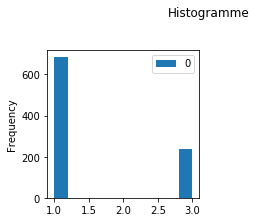

In [135]:
pd.DataFrame(data=y).plot(kind='hist', subplots=True,
 layout=(2,2), figsize=(6,6),
 sharex=False, title='Histogramme')
plot.show()



### Mise en place du pipline Et Application de la vectorisation.


In [93]:
df2 = pd.DataFrame(data=X, columns=["text", "headline", "source", "keywords", "author"])

#print(df2.shape)
# Mise en place d'un pipeline des données et appliquer TfidfVectorizer (pour transformer données textuelles en une séquence de mots)

transformer = FeatureUnion([
                ('text_tfidf', 
                  Pipeline([('extract_field',
                              FunctionTransformer(lambda x: x['text'], 
                                                  validate=False)),
                            ('tfidf', 
                              TfidfVectorizer(ngram_range=(1, 2)))])),
                ('headline_tfidf', 
                  Pipeline([('extract_field', 
                              FunctionTransformer(lambda x:  x["headline"], 
                                                  validate=False)),
                            ('tfidf', 
                              TfidfVectorizer(ngram_range=(1, 2)))])),
                ('keywords_tfidf', 
                  Pipeline([('extract_field', 
                              FunctionTransformer(lambda x:  x["keywords"], 
                                                  validate=False)),
                            ('tfidf', 
                              TfidfVectorizer(ngram_range=(1, 2)))])),
                ('author_tfidf', 
                  Pipeline([('extract_field', 
                              FunctionTransformer(lambda x:  x["author"], 
                                                  validate=False)),
                            ('tfidf', 
                              TfidfVectorizer(ngram_range=(1, 2)))])),
                ('source_tfidf', 
                  Pipeline([('extract_field', 
                              FunctionTransformer(lambda x:  x["source"], 
                                                  validate=False)),
                            ('tfidf', 
                              TfidfVectorizer())]))
                ])

transformer.fit(df2)


text_vocab = transformer.transformer_list[0][1].steps[1][1].get_feature_names() 
headline_vocab = transformer.transformer_list[1][1].steps[1][1].get_feature_names() 
keywords_vocab = transformer.transformer_list[2][1].steps[1][1].get_feature_names() 
author_vocab = transformer.transformer_list[3][1].steps[1][1].get_feature_names()
source_vocab = transformer.transformer_list[4][1].steps[1][1].get_feature_names() 

#print(source_vocab)


vocab = text_vocab + headline_vocab + keywords_vocab + author_vocab  + source_vocab


X = pd.DataFrame(
    data=transformer.transform(df2).toarray(),
    columns=vocab
)
#Cinq premières lines
display(X.head())


,000,000 000,000 abortions,000 americans,000 and,000 babies,000 during,000 feet,000 for,000 from,...,yousef,zealand,zelenik,zero,zilker,zimmer,zimmerman,zippered,zombie,zuma
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### Création des datasets d'apprentissage et de test
On est en apprentissage supervisé et il est récommendé de faire de l'apprentissage sur 70% de nos données et ensuite tester notre modèle sur les 30%.

In [94]:
from sklearn.model_selection import train_test_split 
#30% du jeu de données pour le test
validation_size=0.7 
#70% du jeu de données pour l'apprentissage
testsize= 1-validation_size
seed=30
X_train,X_test,y_train,y_test=train_test_split(X, 
                                               y, 
                                               train_size=validation_size, 
                                               random_state=seed,
                                               test_size=testsize)

### Classifieur Gaussian Naive Bayes & Sa matrice de confusion

F1 score(Accuracy):  0.7086330935251799

 matrice de confusion 
 [[182  21]
 [ 60  15]]

               precision    recall  f1-score   support

           1       0.75      0.90      0.82       203
           3       0.42      0.20      0.27        75

    accuracy                           0.71       278
   macro avg       0.58      0.55      0.54       278
weighted avg       0.66      0.71      0.67       278



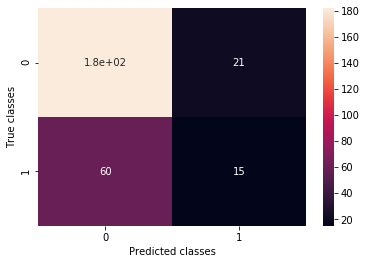

In [95]:
clf = GaussianNB()
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
print('F1 score(Accuracy): ', f1_score(y_test, y_pred, average='micro'))

## classification report
conf = confusion_matrix(y_test, y_pred)
print ('\n matrice de confusion \n',conf)

print ('\n',classification_report(y_test, 
                                  y_pred))

## classification chart
sns.heatmap(confusion_matrix(y_test, y_pred),annot=True)
plot.ylabel('True classes')
plot.xlabel('Predicted classes')
plot.show()

### Classifieur RandomForest & Sa matrice de confusion

F1 score(Accuracy):  0.737410071942446

 matrice de confusion 
 [[203   0]
 [ 73   2]]

               precision    recall  f1-score   support

           1       0.74      1.00      0.85       203
           3       1.00      0.03      0.05        75

    accuracy                           0.74       278
   macro avg       0.87      0.51      0.45       278
weighted avg       0.81      0.74      0.63       278



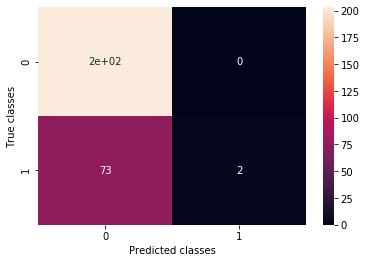

In [96]:
clf = RandomForestClassifier()
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
print('F1 score(Accuracy): ', f1_score(y_test, y_pred, average='micro'))

## classification report
conf = confusion_matrix(y_test, y_pred)
print ('\n matrice de confusion \n',conf)

print ('\n',classification_report(y_test, 
                                  y_pred))

## classification chart
sns.heatmap(confusion_matrix(y_test, y_pred),annot=True)
plot.ylabel('True classes')
plot.xlabel('Predicted classes')
plot.show()


<h2><center> <br/><br/><br/>  Version 2: appliquer les prétraitements des données  <br/><br/> </center></h2> 



## Ingénierie des données : Opération de prétraitement de nos données##

* supprimer les caractères non Ascii
* uniformiser le texte en mettant tous les mots en minuscule
* Supprimer les ponctuations
* remplacer les nombres par des mots
* enlever les stopwords.
* supprimer les caractères spéciaux
* lemmatisation

In [97]:
from sklearn.feature_extraction.text import CountVectorizer

print(df.shape)
array = df.values

#Les variables d'apprentissage
X = array[:,  [0,1,2,3,4]]
# La variable à prédire.
y = array[:, 5]
y=y.astype('int')



(925, 6)


### UnderSampling & OverSampling
Le Oversampling(Suréchantillonage) et le UnderSampling(sous-échantillonage) sont utilisées pour ajuster la distribution des classes d'un ensemble de données.
Dans notre cas, nous voyons bien à partir de la visualisation qu'il y a une grande différence entre les classses TRUE & FALSE.
### OverSampling  (la meilleure solution dans notre cas)

#### Avant d'appliquer l'Oversampling

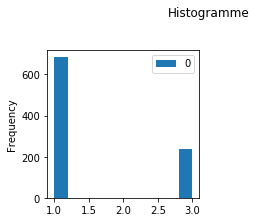

In [152]:
pd.DataFrame(data=y).plot(kind='hist', subplots=True,
 layout=(2,2), figsize=(6,6),
 sharex=False, title='Histogramme')
plot.show()


#### Après avoir appliquer l'Oversampling

y ==> Original dataset shape Counter({1: 687, 3: 238})
y ==> over sampling dataset shape Counter({1: 687, 3: 687})


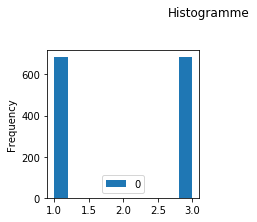

In [155]:

print('y ==> Original dataset shape %s' % Counter(y))
ros = RandomOverSampler(random_state=42)
X_res, y_res = ros.fit_resample(X, y)
print('y ==> over sampling dataset shape %s' % Counter(y_res))

X = X_res
y = y_res

pd.DataFrame(data=y).plot(kind='hist', subplots=True,
 layout=(2,2), figsize=(6,6),
 sharex=False, title='Histogramme')
plot.show()



<h5 <br/><br/><br/>  Liste des fonctions de prétraitements  <br/><br/> </h5> 



In [99]:
#Fonction de suppression des caractères non ASCII
def remove_non_ascii(words):
    new_words = []
    for word in words:
        new_word = unicodedata.normalize('NFKD', word).encode('ascii', 'ignore').decode('utf-8', 'ignore')
        new_words.append(new_word)
    return new_words

#uniformiser le texte en mettant tous les mots en minuscule
def to_lowercase(words):
    new_words = []
    for word in words:
        new_word = word.lower()
        new_words.append(new_word) 
    return new_words

#Supprimer les ponctuations
def remove_punctuation(words):
    new_words = []
    for word in words:
        new_word = re.sub(r'[^\w\s]', '', word)
        if new_word != '':
            new_words.append(new_word)
    return new_words

#remplacer les nombres par des mots
def replace_numbers(words):
    p = inflect.engine()
    new_words = []
    for word in words:
        if word.isdigit():
            new_word = p.number_to_words(word)
            new_words.append(new_word)
        else:
            new_words.append(word)
    return new_words
#enlever les stopwords.
def remove_stopwords(words):
    new_words = []
    for word in words:
        if word not in stopwords.words('english'):
            new_words.append(word)
    return new_words



# Supprimer les caractères spéciaux
def remove_special_caracters(words):
    new_words = []
    for word in words:
        #new_word = re.sub(r'\W', ' ', word)
        new_word = re.sub("[^A-Za-z0-9]", " ", word)
        if new_word != '':
            new_words.append(new_word)
    return new_words

# Substituting multiple spaces with single space
def substitute_multiplecaracters_bysingle(words):
    new_words = []
    for word in words:
        new_word = re.sub(r'\s+', ' ', word, flags=re.I)
        if new_word != '':
            new_words.append(new_word)
    return new_words

# lemmatisation
def word_lemmatization(words):
    new_words = []
    for word in words:       
        new_word = stemmer.lemmatize(word)
        new_words.append(new_word)
    return new_words



# regroupement de toutes les fonctions dans une seule.
def normalize(words):
    print("===========ASCI pré-traitements===========")
    words = remove_non_ascii(words)
    print(words)
    print("=======================================================================================")
    print("==================== pré-traitements : mettre MINUSCULES pré-traitements===============")
    words = to_lowercase(words)
    print(words)
    print("=======================================================================================")
    print("=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============")
    words = remove_punctuation(words)
    print(words)
    print("=======================================================================================")
    print("================ pré-traitements : supprimer STOPWORDS pré-traitements ================")
    words = remove_stopwords(words)
    print(words)
    print("=======================================================================================")
    print("=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========")
    words = remove_special_caracters(words)
    print(words)
    print("=======================================================================================")
    print("============  pré-traitements : substituer plusieurs espaces par un seul  ============")
    words = substitute_multiplecaracters_bysingle(words)
    print(words)
    print("=======================================================================================")
    print("=================  pré-traitements : replacer les nombres par des mots  ===============")
    words = replace_numbers(words)
    print(words)
    print("=======================================================================================")
    #words = word_lemmatization(words)
    return words

def clean_text(text):
    tokens = word_tokenize(text)
    tokens=normalize(tokens)
    text="".join([" "+i for i in tokens]).strip()
    return text

### Notoyage des assertions
Nous allons maintenant appliquer nos fonctions de prétraiement à notre texte.

In [100]:
def clean_assertions (data):
    for i in range(len(data)):
        #print (i)
        data[i]=clean_text(data[i])
    return data 

In [101]:
# On parcours les assertions et on les nettoie
for i in range(X.shape[0]):
    X[i] = clean_assertions(X[i])
    

===========ASCI pré-traitements===========
['Ted', 'Cruz', 'said', 'that', 'veterans', 'should', 'start', 'selling', 'cookies', 'in', 'order', 'to', 'raise', 'funds', '.']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['ted', 'cruz', 'said', 'that', 'veterans', 'should', 'start', 'selling', 'cookies', 'in', 'order', 'to', 'raise', 'funds', '.']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['ted', 'cruz', 'said', 'that', 'veterans', 'should', 'start', 'selling', 'cookies', 'in', 'order', 'to', 'raise', 'funds']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['ted', 'cruz', 'said', 'veterans', 'start', 'selling', 'cookies', 'order', 'raise', 'funds']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['ted', 'cruz', 'said', 'veterans', 'start', 'selling', 'cookies', 'order', 'raise', 'funds']
============  pré-traitements : sub

==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['abortion', ',', 'congress', ',', 'congressional', 'rules', ',', 'federal', 'budget']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['abortion', 'congress', 'congressional', 'rules', 'federal', 'budget']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['abortion', 'congress', 'congressional', 'rules', 'federal', 'budget']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['abortion', 'congress', 'congressional', 'rules', 'federal', 'budget']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['abortion', 'congress', 'congressional', 'rules', 'federal', 'budget']
=================  pré-traitements : replacer les nombres par des mots  ===============
['abortion', 'congress', 'congressional', 'rules', 'federal', 'budget']
===========ASCI pré-traite

['cameron', 'diaz', 'cast', 'portray', 'maya', 'angelou', 'new', 'biographical', 'film']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['cameron', 'diaz', 'cast', 'portray', 'maya', 'angelou', 'new', 'biographical', 'film']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['cameron', 'diaz', 'cast', 'portray', 'maya', 'angelou', 'new', 'biographical', 'film']
=================  pré-traitements : replacer les nombres par des mots  ===============
['cameron', 'diaz', 'cast', 'portray', 'maya', 'angelou', 'new', 'biographical', 'film']
===========ASCI pré-traitements===========
['Unknown']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['unknown']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['unknown']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['unknown']
=========== pré-traitement

['dozens', 'artists', 'including', 'justin', 'timberlake', 'jay', 'z', 'rihanna', 'canceling', 'florida', 'shows', 'like', 'stevie', 'wonder', 'protest', 'stand', 'ground']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['dozens', 'artists', 'including', 'justin', 'timberlake', 'jay', 'z', 'rihanna', 'canceling', 'florida', 'shows', 'like', 'stevie', 'wonder', 'protest', 'stand', 'ground']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['dozens', 'artists', 'including', 'justin', 'timberlake', 'jay', 'z', 'rihanna', 'canceling', 'florida', 'shows', 'like', 'stevie', 'wonder', 'protest', 'stand', 'ground']
=================  pré-traitements : replacer les nombres par des mots  ===============
['dozens', 'artists', 'including', 'justin', 'timberlake', 'jay', 'z', 'rihanna', 'canceling', 'florida', 'shows', 'like', 'stevie', 'wonder', 'protest', 'stand', 'ground']
===========ASCI pré-traitements===========
['

['say', 'socialist', 'candidate', 'norman', 'thomas', 'said', '1944', 'democratic', 'party', 'adopted', 'socialist', 'platform']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['say', 'socialist', 'candidate', 'norman', 'thomas', 'said', '1944', 'democratic', 'party', 'adopted', 'socialist', 'platform']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['say', 'socialist', 'candidate', 'norman', 'thomas', 'said', '1944', 'democratic', 'party', 'adopted', 'socialist', 'platform']
=================  pré-traitements : replacer les nombres par des mots  ===============
['say', 'socialist', 'candidate', 'norman', 'thomas', 'said', 'one thousand, nine hundred and forty-four', 'democratic', 'party', 'adopted', 'socialist', 'platform']
===========ASCI pré-traitements===========
['Bloggers']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['bloggers']
=============== pré-traitem

================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['kim', 'simac']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['kim', 'simac']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['kim', 'simac']
=================  pré-traitements : replacer les nombres par des mots  ===============
['kim', 'simac']
===========ASCI pré-traitements===========
['Wisconsin', 'tea', 'party', 'leader', 'says', 'Democrat-hired', 'telemarketer', 'called', 'recall', 'petition', 'signers']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['wisconsin', 'tea', 'party', 'leader', 'says', 'democrat-hired', 'telemarketer', 'called', 'recall', 'petition', 'signers']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['wisconsin', 'tea', 'party', 'leader', 'says', 'democrathired', 'telemarketer', 'called', 'recall', 'petition',

['says', '600', 'reports', 'texas', 'votes', 'donald', 'trump', 'state', '2016', 'republican', 'primary', 'virtually', 'getting', 'tallied', 'marco', 'rubio']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['says', '600', 'reports', 'texas', 'votes', 'donald', 'trump', 'state', '2016', 'republican', 'primary', 'virtually', 'getting', 'tallied', 'marco', 'rubio']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['says', '600', 'reports', 'texas', 'votes', 'donald', 'trump', 'state', '2016', 'republican', 'primary', 'virtually', 'getting', 'tallied', 'marco', 'rubio']
=================  pré-traitements : replacer les nombres par des mots  ===============
['says', 'six hundred', 'reports', 'texas', 'votes', 'donald', 'trump', 'state', 'two thousand and sixteen', 'republican', 'primary', 'virtually', 'getting', 'tallied', 'marco', 'rubio']
===========ASCI pré-traitements===========
['Committee', 'to', 'Restore',

['darkest', 'lightest', 'people', 'skin', 'color']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['darkest', 'lightest', 'people', 'skin', 'color']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['darkest', 'lightest', 'people', 'skin', 'color']
=================  pré-traitements : replacer les nombres par des mots  ===============
['darkest', 'lightest', 'people', 'skin', 'color']
===========ASCI pré-traitements===========
['snopes']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['snopes']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['snopes']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['snopes']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['snopes']
============  pré-traitements : substituer plusieurs espaces par un seul  =========

['fake', 'news', 'american', 'killed', 'north', 'korea', 'leader', 'kim', 'jong', 'un']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['fake', 'news', 'american', 'killed', 'north', 'korea', 'leader', 'kim', 'jong', 'un']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['fake', 'news', 'american', 'killed', 'north', 'korea', 'leader', 'kim', 'jong', 'un']
=================  pré-traitements : replacer les nombres par des mots  ===============
['fake', 'news', 'american', 'killed', 'north', 'korea', 'leader', 'kim', 'jong', 'un']
===========ASCI pré-traitements===========
['Fake', 'news', ',', 'Foreign', 'Policy']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['fake', 'news', ',', 'foreign', 'policy']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['fake', 'news', 'foreign', 'policy']
================ pré-traitements : supprim

['chain', 'email']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['chain', 'email']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['chain', 'email']
=================  pré-traitements : replacer les nombres par des mots  ===============
['chain', 'email']
===========ASCI pré-traitements===========
['Chain', 'e-mail', 'claims', 'Obama', 'has', 'visited', 'more', 'countries', 'in', 'first', 'six', 'months', 'of', 'presidency', 'than', 'predecessors']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['chain', 'e-mail', 'claims', 'obama', 'has', 'visited', 'more', 'countries', 'in', 'first', 'six', 'months', 'of', 'presidency', 'than', 'predecessors']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['chain', 'email', 'claims', 'obama', 'has', 'visited', 'more', 'countries', 'in', 'first', 'six', 'months', 'of', 'presidency', 'than

['brendan', 'doherty', 'wants', 'raise', 'eligibility', 'age', 'social', 'security', 'benefits', 'anyone', 'born', '1960', 'regard', 'challenges', 'would', 'cause', 'people', 'working', 'physically', 'demanding', 'occupations']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['brendan', 'doherty', 'wants', 'raise', 'eligibility', 'age', 'social', 'security', 'benefits', 'anyone', 'born', '1960', 'regard', 'challenges', 'would', 'cause', 'people', 'working', 'physically', 'demanding', 'occupations']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['brendan', 'doherty', 'wants', 'raise', 'eligibility', 'age', 'social', 'security', 'benefits', 'anyone', 'born', '1960', 'regard', 'challenges', 'would', 'cause', 'people', 'working', 'physically', 'demanding', 'occupations']
=================  pré-traitements : replacer les nombres par des mots  ===============
['brendan', 'doherty', 'wants', 'raise', 'eligibility

================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['sports']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['sports']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['sports']
=================  pré-traitements : replacer les nombres par des mots  ===============
['sports']
===========ASCI pré-traitements===========
['politifact']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['politifact']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['politifact']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['politifact']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['politifact']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['politifact']
=================  pré-traitement

===========ASCI pré-traitements===========
['A', 'photograph', 'shows', 'Norwegian', 'police', 'officers', 'in', 'their', 'skintight', 'Summer', 'uniforms', '.']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['a', 'photograph', 'shows', 'norwegian', 'police', 'officers', 'in', 'their', 'skintight', 'summer', 'uniforms', '.']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['a', 'photograph', 'shows', 'norwegian', 'police', 'officers', 'in', 'their', 'skintight', 'summer', 'uniforms']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['photograph', 'shows', 'norwegian', 'police', 'officers', 'skintight', 'summer', 'uniforms']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['photograph', 'shows', 'norwegian', 'police', 'officers', 'skintight', 'summer', 'uniforms']
============  pré-traitements : substituer plusieurs espaces par 

['snopes']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['snopes']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['snopes']
=================  pré-traitements : replacer les nombres par des mots  ===============
['snopes']
===========ASCI pré-traitements===========
['About', '106,000', 'soldiers', 'had', "'", 'a', 'prescription', 'of', 'three', 'weeks', 'or', 'more', "'", 'for', 'pain', ',', 'depression', 'or', 'anxiety', 'medication', '.']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['about', '106,000', 'soldiers', 'had', "'", 'a', 'prescription', 'of', 'three', 'weeks', 'or', 'more', "'", 'for', 'pain', ',', 'depression', 'or', 'anxiety', 'medication', '.']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['about', '106000', 'soldiers', 'had', 'a', 'prescription', 'of', 'three', 'weeks', 'or', 'more', 'for', 'pain', 'de

["'", 'I', "'m", 'the', 'only', 'candidate', 'on', 'this', 'stage', 'who', 'has', 'actually', 'cut', 'taxes', '.', "'"]
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
["'", 'i', "'m", 'the', 'only', 'candidate', 'on', 'this', 'stage', 'who', 'has', 'actually', 'cut', 'taxes', '.', "'"]
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['i', 'm', 'the', 'only', 'candidate', 'on', 'this', 'stage', 'who', 'has', 'actually', 'cut', 'taxes']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['candidate', 'stage', 'actually', 'cut', 'taxes']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['candidate', 'stage', 'actually', 'cut', 'taxes']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['candidate', 'stage', 'actually', 'cut', 'taxes']
=================  pré-traitements : replacer les nombres par de

['bloggers', 'say', 'us', 'reps', 'corrine', 'brown', 'alcee', 'hastings', 'frederica', 'wilson', 'openly', 'serving', 'socialists']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['bloggers', 'say', 'us', 'reps', 'corrine', 'brown', 'alcee', 'hastings', 'frederica', 'wilson', 'openly', 'serving', 'socialists']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['bloggers', 'say', 'us', 'reps', 'corrine', 'brown', 'alcee', 'hastings', 'frederica', 'wilson', 'openly', 'serving', 'socialists']
=================  pré-traitements : replacer les nombres par des mots  ===============
['bloggers', 'say', 'us', 'reps', 'corrine', 'brown', 'alcee', 'hastings', 'frederica', 'wilson', 'openly', 'serving', 'socialists']
===========ASCI pré-traitements===========
['Patriotism']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['patriotism']
=============== pré-traitements : supprimer 

['snopes']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['snopes']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['snopes']
=================  pré-traitements : replacer les nombres par des mots  ===============
['snopes']
===========ASCI pré-traitements===========
['The', 'church', 'Barack', 'Obama', 'belongs', 'to', 'only', 'admits', 'black', 'people', '.']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['the', 'church', 'barack', 'obama', 'belongs', 'to', 'only', 'admits', 'black', 'people', '.']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['the', 'church', 'barack', 'obama', 'belongs', 'to', 'only', 'admits', 'black', 'people']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['church', 'barack', 'obama', 'belongs', 'admits', 'black', 'people']
=========== pré-traitements : sup

['unknown']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['unknown']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['unknown']
=================  pré-traitements : replacer les nombres par des mots  ===============
['unknown']
===========ASCI pré-traitements===========
['A', 'Canadian', '', 's', 'View', 'of', 'U.S', '.', 'Elections']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['a', 'canadian', '', 's', 'view', 'of', 'u.s', '.', 'elections']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['a', 'canadian', 's', 'view', 'of', 'us', 'elections']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['canadian', 'view', 'us', 'elections']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['canadian', 'view', 'us', 'elections']
============  pré-traiteme

['says', '94', 'percent', 'marco', 'rubio', 'constituents', 'support', 'universal', 'background', 'check']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['says', '94', 'percent', 'marco', 'rubio', 'constituents', 'support', 'universal', 'background', 'check']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['says', '94', 'percent', 'marco', 'rubio', 'constituents', 'support', 'universal', 'background', 'check']
=================  pré-traitements : replacer les nombres par des mots  ===============
['says', 'ninety-four', 'percent', 'marco', 'rubio', 'constituents', 'support', 'universal', 'background', 'check']
===========ASCI pré-traitements===========
['Mark', 'Kelly']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['mark', 'kelly']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['mark', 'kelly']
================ pré-traite

===========ASCI pré-traitements===========
['Donald', 'Trump']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['donald', 'trump']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['donald', 'trump']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['donald', 'trump']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['donald', 'trump']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['donald', 'trump']
=================  pré-traitements : replacer les nombres par des mots  ===============
['donald', 'trump']
===========ASCI pré-traitements===========
['Fact-checking', 'Donald', 'Trump', "'s", 'claim', 'Hillary', 'Clinton', 'started', 'Obama', 'birther', 'movement']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['fact-checking', 'donald', 'trump', "'s",

================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['asp', 'article', 'barack', 'obama']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['asp', 'article', 'barack', 'obama']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['asp', 'article', 'barack', 'obama']
=================  pré-traitements : replacer les nombres par des mots  ===============
['asp', 'article', 'barack', 'obama']
===========ASCI pré-traitements===========
['snopes']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['snopes']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['snopes']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['snopes']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['snopes']
============  pré-traitements : substituer plus

['says', 'ron', 'johnson', 'likes', 'say', 'many', 'lawyers', 'senate', '57', '70th', 'millionaire']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['says', 'ron', 'johnson', 'likes', 'say', 'many', 'lawyers', 'senate', '57', '70th', 'millionaire']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['says', 'ron', 'johnson', 'likes', 'say', 'many', 'lawyers', 'senate', '57', '70th', 'millionaire']
=================  pré-traitements : replacer les nombres par des mots  ===============
['says', 'ron', 'johnson', 'likes', 'say', 'many', 'lawyers', 'senate', 'fifty-seven', '70th', 'millionaire']
===========ASCI pré-traitements===========
['Russ', 'Feingold']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['russ', 'feingold']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['russ', 'feingold']
================ pré-traitements : supprim

['unknown']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['unknown']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['unknown']
=================  pré-traitements : replacer les nombres par des mots  ===============
['unknown']
===========ASCI pré-traitements===========
['Scientists', 'Say', 'Giant', 'Asteroid', 'Could', 'Hit', 'Earth', 'Next', 'Week', ',', 'Causing', 'Mass', 'Devastation']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['scientists', 'say', 'giant', 'asteroid', 'could', 'hit', 'earth', 'next', 'week', ',', 'causing', 'mass', 'devastation']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['scientists', 'say', 'giant', 'asteroid', 'could', 'hit', 'earth', 'next', 'week', 'causing', 'mass', 'devastation']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['scientists', 'sa

============  pré-traitements : substituer plusieurs espaces par un seul  ============
['politifact']
=================  pré-traitements : replacer les nombres par des mots  ===============
['politifact']
===========ASCI pré-traitements===========
['', 'You', 'might', 'also', 'recall', 'the', 'expansion', 'of', 'Last-Mile', 'Connectivity', ',', 'which', 'has', 'brought', 'electricity', 'to', '71', '%', 'of', 'households', ',', 'up', 'from', '27', '%', 'in', '2013', '.', '']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['', 'you', 'might', 'also', 'recall', 'the', 'expansion', 'of', 'last-mile', 'connectivity', ',', 'which', 'has', 'brought', 'electricity', 'to', '71', '%', 'of', 'households', ',', 'up', 'from', '27', '%', 'in', '2013', '.', '']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['you', 'might', 'also', 'recall', 'the', 'expansion', 'of', 'lastmile', 'connectivity', 'which', 'has', 'brought'

['asp', 'article', 'stephanie', 'cegielski']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['asp', 'article', 'stephanie', 'cegielski']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['asp', 'article', 'stephanie', 'cegielski']
=================  pré-traitements : replacer les nombres par des mots  ===============
['asp', 'article', 'stephanie', 'cegielski']
===========ASCI pré-traitements===========
['snopes']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['snopes']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['snopes']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['snopes']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['snopes']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['snopes']
=========

['politifact']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['politifact']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['politifact']
=================  pré-traitements : replacer les nombres par des mots  ===============
['politifact']
===========ASCI pré-traitements===========
['Dropped', 'food', 'remains', 'germ-free', 'if', 'picked', 'up', 'within', 'five', 'seconds', '.']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['dropped', 'food', 'remains', 'germ-free', 'if', 'picked', 'up', 'within', 'five', 'seconds', '.']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['dropped', 'food', 'remains', 'germfree', 'if', 'picked', 'up', 'within', 'five', 'seconds']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['dropped', 'food', 'remains', 'germfree', 'picked', 'within', 'five', 'seco

['jason', 'kenney', 'mediterranean', 'migration', 'related', 'political', 'problems', 'libya', 'factscanada']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['jason', 'kenney', 'mediterranean', 'migration', 'related', 'political', 'problems', 'libya', 'factscanada']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['jason', 'kenney', 'mediterranean', 'migration', 'related', 'political', 'problems', 'libya', 'factscanada']
=================  pré-traitements : replacer les nombres par des mots  ===============
['jason', 'kenney', 'mediterranean', 'migration', 'related', 'political', 'problems', 'libya', 'factscanada']
===========ASCI pré-traitements===========
['CPC', ',', 'Defence', ',', 'Immigration', ',', 'Jason', 'Kenney']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['cpc', ',', 'defence', ',', 'immigration', ',', 'jason', 'kenney']
=============== pré-traitement

['81yearold', 'man', 'named', 'arthur', 'hickenlooper', 'competed', 'show', 'american', 'ninja', 'warrior']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['81yearold', 'man', 'named', 'arthur', 'hickenlooper', 'competed', 'show', 'american', 'ninja', 'warrior']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['81yearold', 'man', 'named', 'arthur', 'hickenlooper', 'competed', 'show', 'american', 'ninja', 'warrior']
=================  pré-traitements : replacer les nombres par des mots  ===============
['81yearold', 'man', 'named', 'arthur', 'hickenlooper', 'competed', 'show', 'american', 'ninja', 'warrior']
===========ASCI pré-traitements===========
['Unknown']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['unknown']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['unknown']
================ pré-traitements : supprimer STOPW

['vern', 'buchanan', 'estimates', 'debt', 'growth', 'marathon', 'wimbledon', 'match']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['vern', 'buchanan', 'estimates', 'debt', 'growth', 'marathon', 'wimbledon', 'match']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['vern', 'buchanan', 'estimates', 'debt', 'growth', 'marathon', 'wimbledon', 'match']
=================  pré-traitements : replacer les nombres par des mots  ===============
['vern', 'buchanan', 'estimates', 'debt', 'growth', 'marathon', 'wimbledon', 'match']
===========ASCI pré-traitements===========
['Federal', 'Budget']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['federal', 'budget']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['federal', 'budget']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['federal', 'budget'

===========ASCI pré-traitements===========
['Seven', 'days', 'before', 'John', 'F.', 'Kennedy', 'was', 'assassinated', 'he', 'said', ',', "'There", '', 's', 'a', 'plot', 'in', 'this', 'country', 'to', 'enslave', 'every', 'man', ',', 'woman', 'and', 'child', '.', 'Before', 'I', 'leave', 'this', 'high', 'and', 'noble', 'office', ',', 'I', 'intend', 'to', 'expose', 'this', 'plot', '.', "'"]
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['seven', 'days', 'before', 'john', 'f.', 'kennedy', 'was', 'assassinated', 'he', 'said', ',', "'there", '', 's', 'a', 'plot', 'in', 'this', 'country', 'to', 'enslave', 'every', 'man', ',', 'woman', 'and', 'child', '.', 'before', 'i', 'leave', 'this', 'high', 'and', 'noble', 'office', ',', 'i', 'intend', 'to', 'expose', 'this', 'plot', '.', "'"]
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['seven', 'days', 'before', 'john', 'f', 'kennedy', 'was', 'assassinated', 'he', 'sai

['cash', 'cow']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['cash', 'cow']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['cash', 'cow']
=================  pré-traitements : replacer les nombres par des mots  ===============
['cash', 'cow']
===========ASCI pré-traitements===========
['ASP', 'Article', ',', 'Bank', 'On', 'It', ',', 'music']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['asp', 'article', ',', 'bank', 'on', 'it', ',', 'music']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['asp', 'article', 'bank', 'on', 'it', 'music']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['asp', 'article', 'bank', 'music']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['asp', 'article', 'bank', 'music']
============  pré-traitements : substituer

================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['politifact']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['politifact']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['politifact']
=================  pré-traitements : replacer les nombres par des mots  ===============
['politifact']
===========ASCI pré-traitements===========
['Nevada', 'is', "'still", 'a', 'state', 'that', 'is', '80', 'percent', 'white', 'voters', '.', "'"]
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['nevada', 'is', "'still", 'a', 'state', 'that', 'is', '80', 'percent', 'white', 'voters', '.', "'"]
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['nevada', 'is', 'still', 'a', 'state', 'that', 'is', '80', 'percent', 'white', 'voters']
================ pré-traitements : supprimer STOPWORDS pré-traitements =======

['eve', 'schatelowitz', 'alcantar']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['eve', 'schatelowitz', 'alcantar']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['eve', 'schatelowitz', 'alcantar']
=================  pré-traitements : replacer les nombres par des mots  ===============
['eve', 'schatelowitz', 'alcantar']
===========ASCI pré-traitements===========
['Judicial', 'aspirant', 'Eve', 'Schatelowitz', 'Alcantar', 'says', 'Democratic', 'special', 'interests', 'demanded', 'money', 'for', 'support']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['judicial', 'aspirant', 'eve', 'schatelowitz', 'alcantar', 'says', 'democratic', 'special', 'interests', 'demanded', 'money', 'for', 'support']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['judicial', 'aspirant', 'eve', 'schatelowitz', 'alcantar', 'says', 'democratic', 's

['email', 'claims', 'iowa', 'policy', 'seeks', 'round', 'iowans', 'might', 'exposed', 'swine', 'flu']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['email', 'claims', 'iowa', 'policy', 'seeks', 'round', 'iowans', 'might', 'exposed', 'swine', 'flu']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['email', 'claims', 'iowa', 'policy', 'seeks', 'round', 'iowans', 'might', 'exposed', 'swine', 'flu']
=================  pré-traitements : replacer les nombres par des mots  ===============
['email', 'claims', 'iowa', 'policy', 'seeks', 'round', 'iowans', 'might', 'exposed', 'swine', 'flu']
===========ASCI pré-traitements===========
['Health', 'Care']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['health', 'care']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['health', 'care']
================ pré-traitements : supprimer STOPWORD

===========ASCI pré-traitements===========
['Were', 'Illegal', 'Immigrants', 'Arrested', 'for', 'Starting', 'California', 'Wildfires', '?']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['were', 'illegal', 'immigrants', 'arrested', 'for', 'starting', 'california', 'wildfires', '?']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['were', 'illegal', 'immigrants', 'arrested', 'for', 'starting', 'california', 'wildfires']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['illegal', 'immigrants', 'arrested', 'starting', 'california', 'wildfires']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['illegal', 'immigrants', 'arrested', 'starting', 'california', 'wildfires']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['illegal', 'immigrants', 'arrested', 'starting', 'california', 'wildfires']
=

['amber', 'alert', 'issued', 'threeyearold', 'girl', 'taken', 'man', 'grey', 'car']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['amber', 'alert', 'issued', 'threeyearold', 'girl', 'taken', 'man', 'grey', 'car']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['amber', 'alert', 'issued', 'threeyearold', 'girl', 'taken', 'man', 'grey', 'car']
=================  pré-traitements : replacer les nombres par des mots  ===============
['amber', 'alert', 'issued', 'threeyearold', 'girl', 'taken', 'man', 'grey', 'car']
===========ASCI pré-traitements===========
['Unknown']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['unknown']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['unknown']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['unknown']
=========== pré-traitements : supprimer CARACT

['viral', 'screenshot', 'shows', 'fox', 'news', 'contributor', 'debating', 'war', 'christmas', 'news', 'networks', 'reported', 'michael', 'cohen', 'guilty', 'pleas']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['viral', 'screenshot', 'shows', 'fox', 'news', 'contributor', 'debating', 'war', 'christmas', 'news', 'networks', 'reported', 'michael', 'cohen', 'guilty', 'pleas']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['viral', 'screenshot', 'shows', 'fox', 'news', 'contributor', 'debating', 'war', 'christmas', 'news', 'networks', 'reported', 'michael', 'cohen', 'guilty', 'pleas']
=================  pré-traitements : replacer les nombres par des mots  ===============
['viral', 'screenshot', 'shows', 'fox', 'news', 'contributor', 'debating', 'war', 'christmas', 'news', 'networks', 'reported', 'michael', 'cohen', 'guilty', 'pleas']
===========ASCI pré-traitements===========
['Unknown']
==================

['asp', 'article']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['asp', 'article']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['asp', 'article']
=================  pré-traitements : replacer les nombres par des mots  ===============
['asp', 'article']
===========ASCI pré-traitements===========
['snopes']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['snopes']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['snopes']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['snopes']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['snopes']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['snopes']
=================  pré-traitements : replacer les nombres par des mots  ===============
['snopes']
===========ASC

['children', 'radio', 'show', 'host', 'thinking', 'microphone', 'turned', 'wrapped', 'broadcast', 'one', 'evening', 'inadvertently', 'blurting', 'air', 'oughta', 'hold', 'little', 'bastards']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['children', 'radio', 'show', 'host', 'thinking', 'microphone', 'turned', 'wrapped', 'broadcast', 'one', 'evening', 'inadvertently', 'blurting', 'air', 'oughta', 'hold', 'little', 'bastards']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['children', 'radio', 'show', 'host', 'thinking', 'microphone', 'turned', 'wrapped', 'broadcast', 'one', 'evening', 'inadvertently', 'blurting', 'air', 'oughta', 'hold', 'little', 'bastards']
=================  pré-traitements : replacer les nombres par des mots  ===============
['children', 'radio', 'show', 'host', 'thinking', 'microphone', 'turned', 'wrapped', 'broadcast', 'one', 'evening', 'inadvertently', 'blurting', 'air', 'oughta',

['ted', 'nugent', 'killed', 'hunting', 'accident']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['ted', 'nugent', 'killed', 'hunting', 'accident']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['ted', 'nugent', 'killed', 'hunting', 'accident']
=================  pré-traitements : replacer les nombres par des mots  ===============
['ted', 'nugent', 'killed', 'hunting', 'accident']
===========ASCI pré-traitements===========
['Bloggers']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['bloggers']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['bloggers']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['bloggers']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['bloggers']
============  pré-traitements : substituer plusieurs espaces par un seul 

===========ASCI pré-traitements===========
['geyser', ',', 'togo', ',', 'viral', 'videos']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['geyser', ',', 'togo', ',', 'viral', 'videos']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['geyser', 'togo', 'viral', 'videos']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['geyser', 'togo', 'viral', 'videos']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['geyser', 'togo', 'viral', 'videos']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['geyser', 'togo', 'viral', 'videos']
=================  pré-traitements : replacer les nombres par des mots  ===============
['geyser', 'togo', 'viral', 'videos']
===========ASCI pré-traitements===========
['snopes']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['

['snopes']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['snopes']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['snopes']
=================  pré-traitements : replacer les nombres par des mots  ===============
['snopes']
===========ASCI pré-traitements===========
['The', 'producers', 'of', 'the', 'Broadway', 'musical', "'Hamilton", "'", 'issued', 'a', 'casting', 'call', 'specifying', "'non-white", "'", 'actors', 'for', 'auditions', '.']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['the', 'producers', 'of', 'the', 'broadway', 'musical', "'hamilton", "'", 'issued', 'a', 'casting', 'call', 'specifying', "'non-white", "'", 'actors', 'for', 'auditions', '.']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['the', 'producers', 'of', 'the', 'broadway', 'musical', 'hamilton', 'issued', 'a', 'casting', 'call', 'specifying', 'no

['obama', 'tax', 'plan', 'cuts', 'taxes', '95', 'percent', 'working', 'families']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['obama', 'tax', 'plan', 'cuts', 'taxes', '95', 'percent', 'working', 'families']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['obama', 'tax', 'plan', 'cuts', 'taxes', '95', 'percent', 'working', 'families']
=================  pré-traitements : replacer les nombres par des mots  ===============
['obama', 'tax', 'plan', 'cuts', 'taxes', 'ninety-five', 'percent', 'working', 'families']
===========ASCI pré-traitements===========
['Barack', 'Obama']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['barack', 'obama']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['barack', 'obama']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['barack', 'obama']
=========== p

['massive', 'recall', 'chicken', 'nuggets', 'underway', 'authorities', 'iowa', 'found', 'human', 'remains', 'meat', 'processing', 'facility']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['massive', 'recall', 'chicken', 'nuggets', 'underway', 'authorities', 'iowa', 'found', 'human', 'remains', 'meat', 'processing', 'facility']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['massive', 'recall', 'chicken', 'nuggets', 'underway', 'authorities', 'iowa', 'found', 'human', 'remains', 'meat', 'processing', 'facility']
=================  pré-traitements : replacer les nombres par des mots  ===============
['massive', 'recall', 'chicken', 'nuggets', 'underway', 'authorities', 'iowa', 'found', 'human', 'remains', 'meat', 'processing', 'facility']
===========ASCI pré-traitements===========
['Unknown']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['unknown']
==============

['democrats', 'state', 'republicans', 'blame', 'unemployment', 'benefit', 'gap']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['democrats', 'state', 'republicans', 'blame', 'unemployment', 'benefit', 'gap']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['democrats', 'state', 'republicans', 'blame', 'unemployment', 'benefit', 'gap']
=================  pré-traitements : replacer les nombres par des mots  ===============
['democrats', 'state', 'republicans', 'blame', 'unemployment', 'benefit', 'gap']
===========ASCI pré-traitements===========
['Jobs']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['jobs']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['jobs']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['jobs']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traite

['donald', 'trump', 'supporters', 'chanted', 'hate', 'muslims', 'hate', 'blacks', 'want', 'great', 'country', 'back', 'rally', 'election', 'night']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['donald', 'trump', 'supporters', 'chanted', 'hate', 'muslims', 'hate', 'blacks', 'want', 'great', 'country', 'back', 'rally', 'election', 'night']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['donald', 'trump', 'supporters', 'chanted', 'hate', 'muslims', 'hate', 'blacks', 'want', 'great', 'country', 'back', 'rally', 'election', 'night']
=================  pré-traitements : replacer les nombres par des mots  ===============
['donald', 'trump', 'supporters', 'chanted', 'hate', 'muslims', 'hate', 'blacks', 'want', 'great', 'country', 'back', 'rally', 'election', 'night']
===========ASCI pré-traitements===========
['Unknown']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['

=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['a', 'connecticut', 'man', 'faked', 'being', 'deaf', 'and', 'dumb', 'for', '62', 'years', 'to', 'avoid', 'listening', 'to', 'his', 'annoyingly', 'chatty', 'wife']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['connecticut', 'man', 'faked', 'deaf', 'dumb', '62', 'years', 'avoid', 'listening', 'annoyingly', 'chatty', 'wife']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['connecticut', 'man', 'faked', 'deaf', 'dumb', '62', 'years', 'avoid', 'listening', 'annoyingly', 'chatty', 'wife']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['connecticut', 'man', 'faked', 'deaf', 'dumb', '62', 'years', 'avoid', 'listening', 'annoyingly', 'chatty', 'wife']
=================  pré-traitements : replacer les nombres par des mots  ===============
['connecticut', 'man', 'faked', 'deaf', 'dumb'

['us', 'department', 'interior', 'sent', 'official', 'news', 'release', 'stating', 'president', 'obama', 'reducing', 'size', 'navajo', 'reservation']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['us', 'department', 'interior', 'sent', 'official', 'news', 'release', 'stating', 'president', 'obama', 'reducing', 'size', 'navajo', 'reservation']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['us', 'department', 'interior', 'sent', 'official', 'news', 'release', 'stating', 'president', 'obama', 'reducing', 'size', 'navajo', 'reservation']
=================  pré-traitements : replacer les nombres par des mots  ===============
['us', 'department', 'interior', 'sent', 'official', 'news', 'release', 'stating', 'president', 'obama', 'reducing', 'size', 'navajo', 'reservation']
===========ASCI pré-traitements===========
['Unknown']
==================== pré-traitements : mettre MINUSCULES pré-traitements==========

['portman', 'incorrect', 'fisher', 'said', 'never', 'met', 'gun', 'control', 'bill', 'nt', 'like']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['portman', 'incorrect', 'fisher', 'said', 'never', 'met', 'gun', 'control', 'bill', 'nt', 'like']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['portman', 'incorrect', 'fisher', 'said', 'never', 'met', 'gun', 'control', 'bill', 'nt', 'like']
=================  pré-traitements : replacer les nombres par des mots  ===============
['portman', 'incorrect', 'fisher', 'said', 'never', 'met', 'gun', 'control', 'bill', 'nt', 'like']
===========ASCI pré-traitements===========
['Crime', ',', 'Guns']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['crime', ',', 'guns']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['crime', 'guns']
================ pré-traitements : supprimer STOPWORDS pré

['charles', 'manson', 'endorses', 'trump']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['charles', 'manson', 'endorses', 'trump']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['charles', 'manson', 'endorses', 'trump']
=================  pré-traitements : replacer les nombres par des mots  ===============
['charles', 'manson', 'endorses', 'trump']
===========ASCI pré-traitements===========
['charles', 'manson', ',', 'donald', 'trump', ',', 'news', 'generator', 'sites', ',', 'shareonfb']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['charles', 'manson', ',', 'donald', 'trump', ',', 'news', 'generator', 'sites', ',', 'shareonfb']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['charles', 'manson', 'donald', 'trump', 'news', 'generator', 'sites', 'shareonfb']
================ pré-traitements : supprimer STOPWORDS pré-trait

================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['economy', 'gays', 'lesbians', 'sexuality', 'states']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['economy', 'gays', 'lesbians', 'sexuality', 'states']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['economy', 'gays', 'lesbians', 'sexuality', 'states']
=================  pré-traitements : replacer les nombres par des mots  ===============
['economy', 'gays', 'lesbians', 'sexuality', 'states']
===========ASCI pré-traitements===========
['politifact']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['politifact']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['politifact']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['politifact']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pr

================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['barack', 'obama', 'cmurder', 'corey', 'miller']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['barack', 'obama', 'cmurder', 'corey', 'miller']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['barack', 'obama', 'cmurder', 'corey', 'miller']
=================  pré-traitements : replacer les nombres par des mots  ===============
['barack', 'obama', 'cmurder', 'corey', 'miller']
===========ASCI pré-traitements===========
['snopes']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['snopes']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['snopes']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['snopes']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['snopes']

['assertions', 'makes', 'difference', 'whether', 'children', 'raised', 'heterosexual', 'homosexual', 'parents', 'shattered', 'latest', 'best', 'social', 'science', 'research']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['assertions', 'makes', 'difference', 'whether', 'children', 'raised', 'heterosexual', 'homosexual', 'parents', 'shattered', 'latest', 'best', 'social', 'science', 'research']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['assertions', 'makes', 'difference', 'whether', 'children', 'raised', 'heterosexual', 'homosexual', 'parents', 'shattered', 'latest', 'best', 'social', 'science', 'research']
=================  pré-traitements : replacer les nombres par des mots  ===============
['assertions', 'makes', 'difference', 'whether', 'children', 'raised', 'heterosexual', 'homosexual', 'parents', 'shattered', 'latest', 'best', 'social', 'science', 'research']
===========ASCI pré-traitements==

['illegal', 'wear', 'anonymous', 'ie', 'guy', 'fawkes', 'masks', 'public', 'united', 'states']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['illegal', 'wear', 'anonymous', 'ie', 'guy', 'fawkes', 'masks', 'public', 'united', 'states']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['illegal', 'wear', 'anonymous', 'ie', 'guy', 'fawkes', 'masks', 'public', 'united', 'states']
=================  pré-traitements : replacer les nombres par des mots  ===============
['illegal', 'wear', 'anonymous', 'ie', 'guy', 'fawkes', 'masks', 'public', 'united', 'states']
===========ASCI pré-traitements===========
['Unknown']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['unknown']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['unknown']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['unknown']
==

['white', 'house', 'branded', 'memorial', 'service', 'tucson', 'shootings', 'together', 'thrive', 'logo', 'slogan']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['white', 'house', 'branded', 'memorial', 'service', 'tucson', 'shootings', 'together', 'thrive', 'logo', 'slogan']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['white', 'house', 'branded', 'memorial', 'service', 'tucson', 'shootings', 'together', 'thrive', 'logo', 'slogan']
=================  pré-traitements : replacer les nombres par des mots  ===============
['white', 'house', 'branded', 'memorial', 'service', 'tucson', 'shootings', 'together', 'thrive', 'logo', 'slogan']
===========ASCI pré-traitements===========
['Michelle', 'Malkin']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['michelle', 'malkin']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['michel

['andrew', 'cuomo']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['andrew', 'cuomo']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['andrew', 'cuomo']
=================  pré-traitements : replacer les nombres par des mots  ===============
['andrew', 'cuomo']
===========ASCI pré-traitements===========
['Unions', 'would', 'suffer', 'but', 'not', 'end', 'because', 'of', 'Supreme', 'Court', 'decision']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['unions', 'would', 'suffer', 'but', 'not', 'end', 'because', 'of', 'supreme', 'court', 'decision']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['unions', 'would', 'suffer', 'but', 'not', 'end', 'because', 'of', 'supreme', 'court', 'decision']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['unions', 'would', 'suffer', 'end', 'supreme', 'c

['unknown']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['unknown']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['unknown']
=================  pré-traitements : replacer les nombres par des mots  ===============
['unknown']
===========ASCI pré-traitements===========
['AMC', '', 's', '', 'The', 'Walking', 'Dead', '', 'Agrees', 'to', 'Bring', 'Beth', 'Greene', 'Back', 'to', 'Life', '.']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['amc', '', 's', '', 'the', 'walking', 'dead', '', 'agrees', 'to', 'bring', 'beth', 'greene', 'back', 'to', 'life', '.']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['amc', 's', 'the', 'walking', 'dead', 'agrees', 'to', 'bring', 'beth', 'greene', 'back', 'to', 'life']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['amc', 'walking', 'dead', 'agrees',

=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['alexandria', 'ocasiocortez']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['alexandria', 'ocasiocortez']
=================  pré-traitements : replacer les nombres par des mots  ===============
['alexandria', 'ocasiocortez']
===========ASCI pré-traitements===========
['Alexandria', 'Ocasio-Cortez', 'wrong', 'on', 'scale', 'of', 'Pentagon', 'accounting', 'errors']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['alexandria', 'ocasio-cortez', 'wrong', 'on', 'scale', 'of', 'pentagon', 'accounting', 'errors']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['alexandria', 'ocasiocortez', 'wrong', 'on', 'scale', 'of', 'pentagon', 'accounting', 'errors']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['alexandria', 'ocasiocortez', 'wrong', 'sca

['ASP', 'Article', ',', 'I', 'Fought', 'The', 'Law']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['asp', 'article', ',', 'i', 'fought', 'the', 'law']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['asp', 'article', 'i', 'fought', 'the', 'law']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['asp', 'article', 'fought', 'law']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['asp', 'article', 'fought', 'law']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['asp', 'article', 'fought', 'law']
=================  pré-traitements : replacer les nombres par des mots  ===============
['asp', 'article', 'fought', 'law']
===========ASCI pré-traitements===========
['snopes']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['snopes']
=============== pré-tr

['paula', 'deen', 'supported', 'campaigned', 'barack', 'obama']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['paula', 'deen', 'supported', 'campaigned', 'barack', 'obama']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['paula', 'deen', 'supported', 'campaigned', 'barack', 'obama']
=================  pré-traitements : replacer les nombres par des mots  ===============
['paula', 'deen', 'supported', 'campaigned', 'barack', 'obama']
===========ASCI pré-traitements===========
['Larry', 'Elder']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['larry', 'elder']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['larry', 'elder']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['larry', 'elder']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['larry', 

['maciver', 'institute', 'says', 'wisconsin', 'gov', 'scott', 'walker', 'halfway', 'goal', 'creating', '250000', 'private', 'sector', 'jobs']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['maciver', 'institute', 'says', 'wisconsin', 'gov', 'scott', 'walker', 'halfway', 'goal', 'creating', '250000', 'private', 'sector', 'jobs']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['maciver', 'institute', 'says', 'wisconsin', 'gov', 'scott', 'walker', 'halfway', 'goal', 'creating', '250000', 'private', 'sector', 'jobs']
=================  pré-traitements : replacer les nombres par des mots  ===============
['maciver', 'institute', 'says', 'wisconsin', 'gov', 'scott', 'walker', 'halfway', 'goal', 'creating', 'two hundred and fifty thousand', 'private', 'sector', 'jobs']
===========ASCI pré-traitements===========
['Jobs']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['job

['says', 'parents', 'came', 'america', 'following', 'fidel', 'castro', 'takeover', 'cuba']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['says', 'parents', 'came', 'america', 'following', 'fidel', 'castro', 'takeover', 'cuba']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['says', 'parents', 'came', 'america', 'following', 'fidel', 'castro', 'takeover', 'cuba']
=================  pré-traitements : replacer les nombres par des mots  ===============
['says', 'parents', 'came', 'america', 'following', 'fidel', 'castro', 'takeover', 'cuba']
===========ASCI pré-traitements===========
['Marco', 'Rubio']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['marco', 'rubio']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['marco', 'rubio']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['marco',

['bashar', 'alassad', 'crisis', 'actor', 'disinformation', 'revolution', 'man', 'syria', 'white', 'helmets']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['bashar', 'alassad', 'crisis', 'actor', 'disinformation', 'revolution', 'man', 'syria', 'white', 'helmets']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['bashar', 'alassad', 'crisis', 'actor', 'disinformation', 'revolution', 'man', 'syria', 'white', 'helmets']
=================  pré-traitements : replacer les nombres par des mots  ===============
['bashar', 'alassad', 'crisis', 'actor', 'disinformation', 'revolution', 'man', 'syria', 'white', 'helmets']
===========ASCI pré-traitements===========
['snopes']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['snopes']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['snopes']
================ pré-traitements : supprimer STOP

['photographs', 'show', 'wild', 'bears', 'posing', 'humans', 'grounds', 'around', 'alaska', 'cottage']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['photographs', 'show', 'wild', 'bears', 'posing', 'humans', 'grounds', 'around', 'alaska', 'cottage']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['photographs', 'show', 'wild', 'bears', 'posing', 'humans', 'grounds', 'around', 'alaska', 'cottage']
=================  pré-traitements : replacer les nombres par des mots  ===============
['photographs', 'show', 'wild', 'bears', 'posing', 'humans', 'grounds', 'around', 'alaska', 'cottage']
===========ASCI pré-traitements===========
['Unknown']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['unknown']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['unknown']
================ pré-traitements : supprimer STOPWORDS pré-traitements

['police', 'chief', 'edward', 'flynn', 'says', 'milwaukee', 'seized', 'nearly', 'many', 'firearms', 'new', 'york', 'city']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['police', 'chief', 'edward', 'flynn', 'says', 'milwaukee', 'seized', 'nearly', 'many', 'firearms', 'new', 'york', 'city']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['police', 'chief', 'edward', 'flynn', 'says', 'milwaukee', 'seized', 'nearly', 'many', 'firearms', 'new', 'york', 'city']
=================  pré-traitements : replacer les nombres par des mots  ===============
['police', 'chief', 'edward', 'flynn', 'says', 'milwaukee', 'seized', 'nearly', 'many', 'firearms', 'new', 'york', 'city']
===========ASCI pré-traitements===========
['Guns']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['guns']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['guns']

['jill', 'stein', 'arrested', 'charged', 'embezzling', 'money', 'raised', '2016', 'recount', 'efforts', 'order', 'throw', 'marijuana', 'dinner', 'party']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['jill', 'stein', 'arrested', 'charged', 'embezzling', 'money', 'raised', '2016', 'recount', 'efforts', 'order', 'throw', 'marijuana', 'dinner', 'party']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['jill', 'stein', 'arrested', 'charged', 'embezzling', 'money', 'raised', '2016', 'recount', 'efforts', 'order', 'throw', 'marijuana', 'dinner', 'party']
=================  pré-traitements : replacer les nombres par des mots  ===============
['jill', 'stein', 'arrested', 'charged', 'embezzling', 'money', 'raised', 'two thousand and sixteen', 'recount', 'efforts', 'order', 'throw', 'marijuana', 'dinner', 'party']
===========ASCI pré-traitements===========
['Unknown']
==================== pré-traitements : mettre 

['penny', 'marshall', 'donate', 'estate', 'trump', '2020', 'election', 'campaign']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['penny', 'marshall', 'donate', 'estate', 'trump', '2020', 'election', 'campaign']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['penny', 'marshall', 'donate', 'estate', 'trump', '2020', 'election', 'campaign']
=================  pré-traitements : replacer les nombres par des mots  ===============
['penny', 'marshall', 'donate', 'estate', 'trump', 'two thousand and twenty', 'election', 'campaign']
===========ASCI pré-traitements===========
['last', 'line', 'of', 'defense']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['last', 'line', 'of', 'defense']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['last', 'line', 'of', 'defense']
================ pré-traitements : supprimer STOPWORDS pré-traite

['health', 'care']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['health', 'care']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['health', 'care']
=================  pré-traitements : replacer les nombres par des mots  ===============
['health', 'care']
===========ASCI pré-traitements===========
['politifact']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['politifact']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['politifact']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['politifact']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['politifact']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['politifact']
=================  pré-traitements : replacer les nombres par des mots  ===============
[

=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['politifact']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['politifact']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['politifact']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['politifact']
=================  pré-traitements : replacer les nombres par des mots  ===============
['politifact']
===========ASCI pré-traitements===========
["'", 'I', "'m", 'the', 'only', 'Republican', 'who', 'has', 'gotten', 'endorsements', 'in', 'this', 'presidential', 'race', 'from', 'major', 'labor', 'unions', '...', "'"]
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
["'", 'i', "'m", 'the', 'only', 'republican', 'who', 'has', 'gotten', 'endorsements', 'in', 'this', 'presidential', 'race', 'from', 'major', 'labor', 'unions', '...', "'"]
===========

['Medicaid']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['medicaid']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['medicaid']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['medicaid']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['medicaid']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['medicaid']
=================  pré-traitements : replacer les nombres par des mots  ===============
['medicaid']
===========ASCI pré-traitements===========
['politifact']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['politifact']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['politifact']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['politifact']
=========== pré

['joe', 'biden', 'grope', 'stephanie', 'carter', 'government', 'ceremony']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['joe', 'biden', 'grope', 'stephanie', 'carter', 'government', 'ceremony']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['joe', 'biden', 'grope', 'stephanie', 'carter', 'government', 'ceremony']
=================  pré-traitements : replacer les nombres par des mots  ===============
['joe', 'biden', 'grope', 'stephanie', 'carter', 'government', 'ceremony']
===========ASCI pré-traitements===========
['ash', 'carter', ',', 'joe', 'biden', ',', 'sexual', 'harassment', ',', 'stephanie', 'carter']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['ash', 'carter', ',', 'joe', 'biden', ',', 'sexual', 'harassment', ',', 'stephanie', 'carter']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['ash', 'carter', 'joe', '

===========ASCI pré-traitements===========
['ASP', 'Article', ',', 'Odd', 'Ingredients']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['asp', 'article', ',', 'odd', 'ingredients']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['asp', 'article', 'odd', 'ingredients']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['asp', 'article', 'odd', 'ingredients']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['asp', 'article', 'odd', 'ingredients']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['asp', 'article', 'odd', 'ingredients']
=================  pré-traitements : replacer les nombres par des mots  ===============
['asp', 'article', 'odd', 'ingredients']
===========ASCI pré-traitements===========
['snopes']
==================== pré-traitements : mettre MINUSCULES pré-traitements=======

['michael', 'williams']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['michael', 'williams']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['michael', 'williams']
=================  pré-traitements : replacer les nombres par des mots  ===============
['michael', 'williams']
===========ASCI pré-traitements===========
['Georgia', 'senator', "'s", 'False', 'claim', 'about', 'Delta', 'discount', 'for', 'Planned', 'Parenthood']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['georgia', 'senator', "'s", 'false', 'claim', 'about', 'delta', 'discount', 'for', 'planned', 'parenthood']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['georgia', 'senator', 's', 'false', 'claim', 'about', 'delta', 'discount', 'for', 'planned', 'parenthood']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['georgi

================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['says', 'second', 'debate', 'hillary', 'clinton', 'landslide', 'every', 'poll']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['says', 'second', 'debate', 'hillary', 'clinton', 'landslide', 'every', 'poll']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['says', 'second', 'debate', 'hillary', 'clinton', 'landslide', 'every', 'poll']
=================  pré-traitements : replacer les nombres par des mots  ===============
['says', 'second', 'debate', 'hillary', 'clinton', 'landslide', 'every', 'poll']
===========ASCI pré-traitements===========
['Donald', 'Trump']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['donald', 'trump']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['donald', 'trump']
================ pré-traitements : supprimer S

['vermont', 'pastor', 'get', 'sentenced', 'prison', 'refusing', 'marry', 'gay', 'couple']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['vermont', 'pastor', 'get', 'sentenced', 'prison', 'refusing', 'marry', 'gay', 'couple']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['vermont', 'pastor', 'get', 'sentenced', 'prison', 'refusing', 'marry', 'gay', 'couple']
=================  pré-traitements : replacer les nombres par des mots  ===============
['vermont', 'pastor', 'get', 'sentenced', 'prison', 'refusing', 'marry', 'gay', 'couple']
===========ASCI pré-traitements===========
['Diversity', ',', 'Legal', 'Issues', ',', 'Marriage']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['diversity', ',', 'legal', 'issues', ',', 'marriage']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['diversity', 'legal', 'issues', 'marriage']
===

['snopes']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['snopes']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['snopes']
=================  pré-traitements : replacer les nombres par des mots  ===============
['snopes']
===========ASCI pré-traitements===========
['An', 'Oklahoma', 'teacher', 'was', 'fired', 'for', 'praying', 'when', 'a', 'tornado', 'hit', 'her', 'school', '.']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['an', 'oklahoma', 'teacher', 'was', 'fired', 'for', 'praying', 'when', 'a', 'tornado', 'hit', 'her', 'school', '.']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['an', 'oklahoma', 'teacher', 'was', 'fired', 'for', 'praying', 'when', 'a', 'tornado', 'hit', 'her', 'school']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['oklahoma', 'teacher', 'fired', 'prayin

['says', 'would', 'first', 'cpa', 'serve', 'texas', 'comptroller']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['says', 'would', 'first', 'cpa', 'serve', 'texas', 'comptroller']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['says', 'would', 'first', 'cpa', 'serve', 'texas', 'comptroller']
=================  pré-traitements : replacer les nombres par des mots  ===============
['says', 'would', 'first', 'cpa', 'serve', 'texas', 'comptroller']
===========ASCI pré-traitements===========
['Raul', 'Torres']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['raul', 'torres']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['raul', 'torres']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['raul', 'torres']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ==========

['president', 'trump', 'send', 'feds', 'raid', 'islamberg', 'new', 'york']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['president', 'trump', 'send', 'feds', 'raid', 'islamberg', 'new', 'york']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['president', 'trump', 'send', 'feds', 'raid', 'islamberg', 'new', 'york']
=================  pré-traitements : replacer les nombres par des mots  ===============
['president', 'trump', 'send', 'feds', 'raid', 'islamberg', 'new', 'york']
===========ASCI pré-traitements===========
['freedom', 'daily', ',', 'islamberg', ',', 'muslims']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['freedom', 'daily', ',', 'islamberg', ',', 'muslims']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['freedom', 'daily', 'islamberg', 'muslims']
================ pré-traitements : supprimer STOPWORDS pré-trai

['bill', 'mccollum', 'voted', 'four', 'times', 'raise', 'pay', 'total', '51000', 'earns', 'congressional', 'pension', 'worth', '75000', 'year']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['bill', 'mccollum', 'voted', 'four', 'times', 'raise', 'pay', 'total', '51000', 'earns', 'congressional', 'pension', 'worth', '75000', 'year']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['bill', 'mccollum', 'voted', 'four', 'times', 'raise', 'pay', 'total', '51000', 'earns', 'congressional', 'pension', 'worth', '75000', 'year']
=================  pré-traitements : replacer les nombres par des mots  ===============
['bill', 'mccollum', 'voted', 'four', 'times', 'raise', 'pay', 'total', 'fifty-one thousand', 'earns', 'congressional', 'pension', 'worth', 'seventy-five thousand', 'year']
===========ASCI pré-traitements===========
['Florida', 'Democratic', 'Party']
==================== pré-traitements : mettre MINUSCUL

['legalization', 'marijuana', 'force', 'police', 'departments', 'euthanize', 'drug', 'sniffing', 'dogs']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['legalization', 'marijuana', 'force', 'police', 'departments', 'euthanize', 'drug', 'sniffing', 'dogs']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['legalization', 'marijuana', 'force', 'police', 'departments', 'euthanize', 'drug', 'sniffing', 'dogs']
=================  pré-traitements : replacer les nombres par des mots  ===============
['legalization', 'marijuana', 'force', 'police', 'departments', 'euthanize', 'drug', 'sniffing', 'dogs']
===========ASCI pré-traitements===========
['Unknown']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['unknown']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['unknown']
================ pré-traitements : supprimer STOPWORDS pré-tra

['politifact']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['politifact']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['politifact']
=================  pré-traitements : replacer les nombres par des mots  ===============
['politifact']
===========ASCI pré-traitements===========
['Says', 'he', '', 's', "'never", 'voted', '', 'present', '', 'in', 'the', 'House', 'instead', 'of', 'taking', 'a', 'yes', 'or', 'no', 'position', '.']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['says', 'he', '', 's', "'never", 'voted', '', 'present', '', 'in', 'the', 'house', 'instead', 'of', 'taking', 'a', 'yes', 'or', 'no', 'position', '.']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['says', 'he', 's', 'never', 'voted', 'present', 'in', 'the', 'house', 'instead', 'of', 'taking', 'a', 'yes', 'or', 'no', 'position']
================ pré

['michelle', 'obama', 'demanding', 'kids', 'daycare', 'get', 'weighed']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['michelle', 'obama', 'demanding', 'kids', 'daycare', 'get', 'weighed']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['michelle', 'obama', 'demanding', 'kids', 'daycare', 'get', 'weighed']
=================  pré-traitements : replacer les nombres par des mots  ===============
['michelle', 'obama', 'demanding', 'kids', 'daycare', 'get', 'weighed']
===========ASCI pré-traitements===========
['ASP', 'Article', ',', 'barack', 'obama']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['asp', 'article', ',', 'barack', 'obama']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['asp', 'article', 'barack', 'obama']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['asp', 'article',

['a', 'resolution', 'introduced', 'to', 'the', 'house', 'of', 'representatives', 'seeks', 'to', 'repeal', 'the', 'authorization', 'for', 'use', 'of', 'military', 'force', 'against', 'iraq', '.']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['a', 'resolution', 'introduced', 'to', 'the', 'house', 'of', 'representatives', 'seeks', 'to', 'repeal', 'the', 'authorization', 'for', 'use', 'of', 'military', 'force', 'against', 'iraq']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['resolution', 'introduced', 'house', 'representatives', 'seeks', 'repeal', 'authorization', 'use', 'military', 'force', 'iraq']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['resolution', 'introduced', 'house', 'representatives', 'seeks', 'repeal', 'authorization', 'use', 'military', 'force', 'iraq']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['reso

['education', 'nominee', 'betsy', 'devos', 'says', 'wyoming', 'school', 'might', 'need', 'guns', 'stop', 'grizzly', 'bears']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['education', 'nominee', 'betsy', 'devos', 'says', 'wyoming', 'school', 'might', 'need', 'guns', 'stop', 'grizzly', 'bears']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['education', 'nominee', 'betsy', 'devos', 'says', 'wyoming', 'school', 'might', 'need', 'guns', 'stop', 'grizzly', 'bears']
=================  pré-traitements : replacer les nombres par des mots  ===============
['education', 'nominee', 'betsy', 'devos', 'says', 'wyoming', 'school', 'might', 'need', 'guns', 'stop', 'grizzly', 'bears']
===========ASCI pré-traitements===========
['Animals', ',', 'Children', ',', 'Corrections', 'and', 'Updates', ',', 'Education', ',', 'Environment', ',', 'Guns', ',', 'Public', 'Safety']
==================== pré-traitements : mettre MINUS

['president', 'vice', 'president', 'ca', 'nt', 'state']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['president', 'vice', 'president', 'ca', 'nt', 'state']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['president', 'vice', 'president', 'ca', 'nt', 'state']
=================  pré-traitements : replacer les nombres par des mots  ===============
['president', 'vice', 'president', 'ca', 'nt', 'state']
===========ASCI pré-traitements===========
['Lawrence', "O'Donnell"]
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['lawrence', "o'donnell"]
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['lawrence', 'odonnell']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['lawrence', 'odonnell']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['lawrence', 'od

['snopes']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['snopes']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['snopes']
=================  pré-traitements : replacer les nombres par des mots  ===============
['snopes']
===========ASCI pré-traitements===========
["'No", 'doctors', 'who', 'went', 'to', 'an', 'American', 'medical', 'school', 'will', 'be', 'accepting', 'Obamacare', '.', "'"]
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
["'no", 'doctors', 'who', 'went', 'to', 'an', 'american', 'medical', 'school', 'will', 'be', 'accepting', 'obamacare', '.', "'"]
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['no', 'doctors', 'who', 'went', 'to', 'an', 'american', 'medical', 'school', 'will', 'be', 'accepting', 'obamacare']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['doctors'

['michael', 'doherty']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['michael', 'doherty']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['michael', 'doherty']
=================  pré-traitements : replacer les nombres par des mots  ===============
['michael', 'doherty']
===========ASCI pré-traitements===========
['Michael', 'Doherty', 'says', 'evidence', 'is', 'lacking', 'that', 'red-light', 'cameras', 'in', 'New', 'Jersey', 'reduce', 'accidents']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['michael', 'doherty', 'says', 'evidence', 'is', 'lacking', 'that', 'red-light', 'cameras', 'in', 'new', 'jersey', 'reduce', 'accidents']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['michael', 'doherty', 'says', 'evidence', 'is', 'lacking', 'that', 'redlight', 'cameras', 'in', 'new', 'jersey', 'reduce', 'accidents']
=============

['monty', 'python', 'trouper', 'john', 'cleese', 'penned', 'satirical', 'article', 'formation', 'axis', 'evil']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['monty', 'python', 'trouper', 'john', 'cleese', 'penned', 'satirical', 'article', 'formation', 'axis', 'evil']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['monty', 'python', 'trouper', 'john', 'cleese', 'penned', 'satirical', 'article', 'formation', 'axis', 'evil']
=================  pré-traitements : replacer les nombres par des mots  ===============
['monty', 'python', 'trouper', 'john', 'cleese', 'penned', 'satirical', 'article', 'formation', 'axis', 'evil']
===========ASCI pré-traitements===========
['Unknown']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['unknown']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['unknown']
================ pré-traitements :

['unknown']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['unknown']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['unknown']
=================  pré-traitements : replacer les nombres par des mots  ===============
['unknown']
===========ASCI pré-traitements===========
['Donald', 'Trump', 'Didn', '', 't', 'Pay', 'Sarah', 'Palin', 'for', 'Her', 'Endorsement']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['donald', 'trump', 'didn', '', 't', 'pay', 'sarah', 'palin', 'for', 'her', 'endorsement']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['donald', 'trump', 'didn', 't', 'pay', 'sarah', 'palin', 'for', 'her', 'endorsement']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['donald', 'trump', 'pay', 'sarah', 'palin', 'endorsement']
=========== pré-traitements : supprimer CARACTÈRES SP

['chain', 'email']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['chain', 'email']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['chain', 'email']
=================  pré-traitements : replacer les nombres par des mots  ===============
['chain', 'email']
===========ASCI pré-traitements===========
["'", '$', '64,000', 'question', "'", 'e-mail', 'says', 'Congress', 'is', 'exempt', 'from', 'health', 'reform', '.', 'They', "'re", 'not', '.']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
["'", '$', '64,000', 'question', "'", 'e-mail', 'says', 'congress', 'is', 'exempt', 'from', 'health', 'reform', '.', 'they', "'re", 'not', '.']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['64000', 'question', 'email', 'says', 'congress', 'is', 'exempt', 'from', 'health', 'reform', 'they', 're', 'not']
================ pré-traitements : sup

["'Some", 'of', 'these', 'members', 'of', 'the', 'House', 'of', 'Representatives', 'get', 'hundreds', 'of', 'thousands', 'of', 'dollars', 'in', 'farm', 'subsidies', "'", 'but', 'want', 'to', 'cut', 'food', 'stamps', '.']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
["'some", 'of', 'these', 'members', 'of', 'the', 'house', 'of', 'representatives', 'get', 'hundreds', 'of', 'thousands', 'of', 'dollars', 'in', 'farm', 'subsidies', "'", 'but', 'want', 'to', 'cut', 'food', 'stamps', '.']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['some', 'of', 'these', 'members', 'of', 'the', 'house', 'of', 'representatives', 'get', 'hundreds', 'of', 'thousands', 'of', 'dollars', 'in', 'farm', 'subsidies', 'but', 'want', 'to', 'cut', 'food', 'stamps']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['members', 'house', 'representatives', 'get', 'hundreds', 'thousands', 'dollars', '

['man', 'either', 'organizer', '2017', 'white', 'nationalist', 'rally', 'charlottesville', 'virginia', 'driver', 'car', 'ran', 'protesters', 'killing', 'one', 'democrat', 'photographed', 'meeting', 'president', 'obama', 'oval', 'office']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['man', 'either', 'organizer', '2017', 'white', 'nationalist', 'rally', 'charlottesville', 'virginia', 'driver', 'car', 'ran', 'protesters', 'killing', 'one', 'democrat', 'photographed', 'meeting', 'president', 'obama', 'oval', 'office']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['man', 'either', 'organizer', '2017', 'white', 'nationalist', 'rally', 'charlottesville', 'virginia', 'driver', 'car', 'ran', 'protesters', 'killing', 'one', 'democrat', 'photographed', 'meeting', 'president', 'obama', 'oval', 'office']
=================  pré-traitements : replacer les nombres par des mots  ===============
['man', 'either', 'orga

['says', 'two', 'us', 'rep', 'nancy', 'pelosi', 'daughters', 'arrested', 'smuggling', 'drugs']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['says', 'two', 'us', 'rep', 'nancy', 'pelosi', 'daughters', 'arrested', 'smuggling', 'drugs']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['says', 'two', 'us', 'rep', 'nancy', 'pelosi', 'daughters', 'arrested', 'smuggling', 'drugs']
=================  pré-traitements : replacer les nombres par des mots  ===============
['says', 'two', 'us', 'rep', 'nancy', 'pelosi', 'daughters', 'arrested', 'smuggling', 'drugs']
===========ASCI pré-traitements===========
['Bloggers']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['bloggers']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['bloggers']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['bloggers'

['snopes']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['snopes']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['snopes']
=================  pré-traitements : replacer les nombres par des mots  ===============
['snopes']
===========ASCI pré-traitements===========
["'The", 'first', 'so-called', 'second', 'hand', 'information', '', 'Whistleblower', '', 'got', 'my', 'phone', 'conversation', 'almost', 'completely', 'wrong', '.', "'"]
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
["'the", 'first', 'so-called', 'second', 'hand', 'information', '', 'whistleblower', '', 'got', 'my', 'phone', 'conversation', 'almost', 'completely', 'wrong', '.', "'"]
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['the', 'first', 'socalled', 'second', 'hand', 'information', 'whistleblower', 'got', 'my', 'phone', 'conversation', 'almost', 'comple

['donald', 'trump', 'said', 'never', 'understood', 'people', 'like', 'dogs', 'dogs', 'disgusting']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['donald', 'trump', 'said', 'never', 'understood', 'people', 'like', 'dogs', 'dogs', 'disgusting']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['donald', 'trump', 'said', 'never', 'understood', 'people', 'like', 'dogs', 'dogs', 'disgusting']
=================  pré-traitements : replacer les nombres par des mots  ===============
['donald', 'trump', 'said', 'never', 'understood', 'people', 'like', 'dogs', 'dogs', 'disgusting']
===========ASCI pré-traitements===========
['Unknown']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['unknown']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['unknown']
================ pré-traitements : supprimer STOPWORDS pré-traitements ===============

['unknown']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['unknown']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['unknown']
=================  pré-traitements : replacer les nombres par des mots  ===============
['unknown']
===========ASCI pré-traitements===========
['KISS', ':', 'Does', 'It', 'Stand', 'for', '', 'Knights', 'in', 'Satan', '', 's', 'Service', '', '?']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['kiss', ':', 'does', 'it', 'stand', 'for', '', 'knights', 'in', 'satan', '', 's', 'service', '', '?']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['kiss', 'does', 'it', 'stand', 'for', 'knights', 'in', 'satan', 's', 'service']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['kiss', 'stand', 'knights', 'satan', 'service']
=========== pré-traitements : supprimer CARACT

['gunrights', 'group', 'says', 'health', 'care', 'bill', 'could', 'harm', 'gun', 'owners']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['gunrights', 'group', 'says', 'health', 'care', 'bill', 'could', 'harm', 'gun', 'owners']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['gunrights', 'group', 'says', 'health', 'care', 'bill', 'could', 'harm', 'gun', 'owners']
=================  pré-traitements : replacer les nombres par des mots  ===============
['gunrights', 'group', 'says', 'health', 'care', 'bill', 'could', 'harm', 'gun', 'owners']
===========ASCI pré-traitements===========
['Guns', ',', 'Health', 'Care']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['guns', ',', 'health', 'care']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['guns', 'health', 'care']
================ pré-traitements : supprimer STOPWORDS pré-trai

['unknown']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['unknown']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['unknown']
=================  pré-traitements : replacer les nombres par des mots  ===============
['unknown']
===========ASCI pré-traitements===========
['Crosses', 'on', 'New', 'York']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['crosses', 'on', 'new', 'york']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['crosses', 'on', 'new', 'york']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['crosses', 'new', 'york']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['crosses', 'new', 'york']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['crosses', 'new', 'york']
=================  pré-trai

['says', 'president', 'donald', 'trump', 'said', 'asylum', 'seekers', 'nt', 'people', 'animals']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['says', 'president', 'donald', 'trump', 'said', 'asylum', 'seekers', 'nt', 'people', 'animals']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['says', 'president', 'donald', 'trump', 'said', 'asylum', 'seekers', 'nt', 'people', 'animals']
=================  pré-traitements : replacer les nombres par des mots  ===============
['says', 'president', 'donald', 'trump', 'said', 'asylum', 'seekers', 'nt', 'people', 'animals']
===========ASCI pré-traitements===========
['Tweets']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['tweets']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['tweets']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['tweets'

['snopes']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['snopes']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['snopes']
=================  pré-traitements : replacer les nombres par des mots  ===============
['snopes']
===========ASCI pré-traitements===========
["'Seattle", 'police', 'begin', 'gun', 'confiscations', ':', 'no', 'laws', 'broken', ',', 'no', 'warrant', ',', 'no', 'charges', '.', "'"]
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
["'seattle", 'police', 'begin', 'gun', 'confiscations', ':', 'no', 'laws', 'broken', ',', 'no', 'warrant', ',', 'no', 'charges', '.', "'"]
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['seattle', 'police', 'begin', 'gun', 'confiscations', 'no', 'laws', 'broken', 'no', 'warrant', 'no', 'charges']
================ pré-traitements : supprimer STOPWORDS pré-traitements ============

['asp', 'article', 'necessarily', 'news', 'nucleation']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['asp', 'article', 'necessarily', 'news', 'nucleation']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['asp', 'article', 'necessarily', 'news', 'nucleation']
=================  pré-traitements : replacer les nombres par des mots  ===============
['asp', 'article', 'necessarily', 'news', 'nucleation']
===========ASCI pré-traitements===========
['snopes']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['snopes']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['snopes']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['snopes']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['snopes']
============  pré-traitements : substituer plusieurs espaces pa

['actor', 'jaden', 'smith', 'committed', 'suicide', 'july', '2016']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['actor', 'jaden', 'smith', 'committed', 'suicide', 'july', '2016']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['actor', 'jaden', 'smith', 'committed', 'suicide', 'july', '2016']
=================  pré-traitements : replacer les nombres par des mots  ===============
['actor', 'jaden', 'smith', 'committed', 'suicide', 'july', 'two thousand and sixteen']
===========ASCI pré-traitements===========
['Unknown']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['unknown']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['unknown']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['unknown']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['

['ted', 'nugent', 'called', 'colin', 'kaepernick', 'chimp', 'discussing', 'president', 'support', 'athlete', 'protest']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['ted', 'nugent', 'called', 'colin', 'kaepernick', 'chimp', 'discussing', 'president', 'support', 'athlete', 'protest']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['ted', 'nugent', 'called', 'colin', 'kaepernick', 'chimp', 'discussing', 'president', 'support', 'athlete', 'protest']
=================  pré-traitements : replacer les nombres par des mots  ===============
['ted', 'nugent', 'called', 'colin', 'kaepernick', 'chimp', 'discussing', 'president', 'support', 'athlete', 'protest']
===========ASCI pré-traitements===========
['Unknown']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['unknown']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['unknown']
==

=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['education']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['education']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['education']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['education']
=================  pré-traitements : replacer les nombres par des mots  ===============
['education']
===========ASCI pré-traitements===========
['politifact']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['politifact']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['politifact']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['politifact']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['politifact']
============  pré-tra

================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['sean', 'connery', 'letter', 'apple']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['sean', 'connery', 'letter', 'apple']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['sean', 'connery', 'letter', 'apple']
=================  pré-traitements : replacer les nombres par des mots  ===============
['sean', 'connery', 'letter', 'apple']
===========ASCI pré-traitements===========
['ASP', 'Article', ',', 'Loony', 'Letters']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['asp', 'article', ',', 'loony', 'letters']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['asp', 'article', 'loony', 'letters']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['asp', 'article', 'loony', 'letters']
=========== pré-trai

['nairobi', 'accounts', '45', 'kenya', 'gross', 'domestic', 'product']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['nairobi', 'accounts', '45', 'kenya', 'gross', 'domestic', 'product']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['nairobi', 'accounts', '45', 'kenya', 'gross', 'domestic', 'product']
=================  pré-traitements : replacer les nombres par des mots  ===============
['nairobi', 'accounts', 'forty-five', 'kenya', 'gross', 'domestic', 'product']
===========ASCI pré-traitements===========
['Unknown']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['unknown']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['unknown']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['unknown']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['

['politifact']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['politifact']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['politifact']
=================  pré-traitements : replacer les nombres par des mots  ===============
['politifact']
===========ASCI pré-traitements===========
["'There", "'s", 'no', 'negative', 'advertising', 'in', 'my', 'campaign', 'at', 'all', '.', "'"]
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
["'there", "'s", 'no', 'negative', 'advertising', 'in', 'my', 'campaign', 'at', 'all', '.', "'"]
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['there', 's', 'no', 'negative', 'advertising', 'in', 'my', 'campaign', 'at', 'all']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['negative', 'advertising', 'campaign']
=========== pré-traitements : supprimer CARACTÈRES 

['german', 'national', 'michael', 'duerr', 'owns', '05', '575', 'south', 'africa', 'reserve', 'bank', 'africa', 'check']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['german', 'national', 'michael', 'duerr', 'owns', '05', '575', 'south', 'africa', 'reserve', 'bank', 'africa', 'check']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['german', 'national', 'michael', 'duerr', 'owns', '05', '575', 'south', 'africa', 'reserve', 'bank', 'africa', 'check']
=================  pré-traitements : replacer les nombres par des mots  ===============
['german', 'national', 'michael', 'duerr', 'owns', 'five', 'five hundred and seventy-five', 'south', 'africa', 'reserve', 'bank', 'africa', 'check']
===========ASCI pré-traitements===========
['Michael', 'Duerr', ',', 'SARB', ',', 'shares']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['michael', 'duerr', ',', 'sarb', ',', 'share

['playdoh', 'brand', 'modeling', 'compound', 'started', 'wallpaper', 'cleaner']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['playdoh', 'brand', 'modeling', 'compound', 'started', 'wallpaper', 'cleaner']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['playdoh', 'brand', 'modeling', 'compound', 'started', 'wallpaper', 'cleaner']
=================  pré-traitements : replacer les nombres par des mots  ===============
['playdoh', 'brand', 'modeling', 'compound', 'started', 'wallpaper', 'cleaner']
===========ASCI pré-traitements===========
['Unknown']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['unknown']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['unknown']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['unknown']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pr

['unknown']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['unknown']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['unknown']
=================  pré-traitements : replacer les nombres par des mots  ===============
['unknown']
===========ASCI pré-traitements===========
['Did', 'ABC', 'Fire', 'Joy', 'Behar', 'from', '', 'The', 'View', '', '?']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['did', 'abc', 'fire', 'joy', 'behar', 'from', '', 'the', 'view', '', '?']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['did', 'abc', 'fire', 'joy', 'behar', 'from', 'the', 'view']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['abc', 'fire', 'joy', 'behar', 'view']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['abc', 'fire', 'joy', 'behar', 'view']
==

['gary', 'sinise', 'tweets', 'hillary', 'clinton', 'guns']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['gary', 'sinise', 'tweets', 'hillary', 'clinton', 'guns']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['gary', 'sinise', 'tweets', 'hillary', 'clinton', 'guns']
=================  pré-traitements : replacer les nombres par des mots  ===============
['gary', 'sinise', 'tweets', 'hillary', 'clinton', 'guns']
===========ASCI pré-traitements===========
['gary', 'sinise', ',', 'gun', 'control', ',', 'hillary', 'clinton']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['gary', 'sinise', ',', 'gun', 'control', ',', 'hillary', 'clinton']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['gary', 'sinise', 'gun', 'control', 'hillary', 'clinton']
================ pré-traitements : supprimer STOPWORDS pré-traitements ==============

['would', 'trump', 's', 'own', 'son', 'be', 'affected', 'by', 'an', 'order', 'eliminating', 'birthright', 'citizenship']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['would', 'trump', 'son', 'affected', 'order', 'eliminating', 'birthright', 'citizenship']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['would', 'trump', 'son', 'affected', 'order', 'eliminating', 'birthright', 'citizenship']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['would', 'trump', 'son', 'affected', 'order', 'eliminating', 'birthright', 'citizenship']
=================  pré-traitements : replacer les nombres par des mots  ===============
['would', 'trump', 'son', 'affected', 'order', 'eliminating', 'birthright', 'citizenship']
===========ASCI pré-traitements===========
['Fake', 'news']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['fake', 'news']

['marco', 'rubio', 'says', 'us', 'admits', 'one', 'million', 'immigrants', 'year', 'far', 'nation']
===========ASCI pré-traitements===========
['Immigration']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['immigration']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['immigration']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['immigration']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['immigration']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['immigration']
=================  pré-traitements : replacer les nombres par des mots  ===============
['immigration']
===========ASCI pré-traitements===========
['politifact']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['politifact']
=============== pré-traitements : supprimer PONCTUATION p

['series', 'photographs', 'shows', 'restaurant', '6pound', 'hamburger', 'offering']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['series', 'photographs', 'shows', 'restaurant', '6pound', 'hamburger', 'offering']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['series', 'photographs', 'shows', 'restaurant', '6pound', 'hamburger', 'offering']
=================  pré-traitements : replacer les nombres par des mots  ===============
['series', 'photographs', 'shows', 'restaurant', '6pound', 'hamburger', 'offering']
===========ASCI pré-traitements===========
['Unknown']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['unknown']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['unknown']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['unknown']
=========== pré-traitements : supprimer CARACT

===========ASCI pré-traitements===========
["'The", 'State', 'of', 'Texas', 'does', 'not', 'even', 'use', 'the', 'E-Verify', 'system', 'to', 'determine', 'if', 'someone', 'is', 'legally', 'in', 'our', 'country', 'when', 'they', 'apply', 'for', 'a', 'job', '.', "'"]
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
["'the", 'state', 'of', 'texas', 'does', 'not', 'even', 'use', 'the', 'e-verify', 'system', 'to', 'determine', 'if', 'someone', 'is', 'legally', 'in', 'our', 'country', 'when', 'they', 'apply', 'for', 'a', 'job', '.', "'"]
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['the', 'state', 'of', 'texas', 'does', 'not', 'even', 'use', 'the', 'everify', 'system', 'to', 'determine', 'if', 'someone', 'is', 'legally', 'in', 'our', 'country', 'when', 'they', 'apply', 'for', 'a', 'job']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['state', 'texas', 'even', 'use', 'e

['bill', 'clinton', 'says', 'never', 'filibusterproof', 'senate']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['bill', 'clinton', 'says', 'never', 'filibusterproof', 'senate']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['bill', 'clinton', 'says', 'never', 'filibusterproof', 'senate']
=================  pré-traitements : replacer les nombres par des mots  ===============
['bill', 'clinton', 'says', 'never', 'filibusterproof', 'senate']
===========ASCI pré-traitements===========
['Bipartisanship', ',', 'Health', 'Care', ',', 'Supreme', 'Court', ',', 'This', 'Week', '-', 'ABC', 'News']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['bipartisanship', ',', 'health', 'care', ',', 'supreme', 'court', ',', 'this', 'week', '-', 'abc', 'news']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['bipartisanship', 'health', 'care', '

['unknown']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['unknown']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['unknown']
=================  pré-traitements : replacer les nombres par des mots  ===============
['unknown']
===========ASCI pré-traitements===========
['Police', 'Chief', 'Warns', 'of', 'Fentanyl', 'Overdose', 'Risk', 'from', 'Residue', 'on', 'Shopping', 'Carts', '?']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['police', 'chief', 'warns', 'of', 'fentanyl', 'overdose', 'risk', 'from', 'residue', 'on', 'shopping', 'carts', '?']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['police', 'chief', 'warns', 'of', 'fentanyl', 'overdose', 'risk', 'from', 'residue', 'on', 'shopping', 'carts']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['police', 'chief', 'warns', 'fen

['missing', 'girl', 'madeleine', 'mccann']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['missing', 'girl', 'madeleine', 'mccann']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['missing', 'girl', 'madeleine', 'mccann']
=================  pré-traitements : replacer les nombres par des mots  ===============
['missing', 'girl', 'madeleine', 'mccann']
===========ASCI pré-traitements===========
['ASP', 'Article']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['asp', 'article']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['asp', 'article']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['asp', 'article']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['asp', 'article']
============  pré-traitements : substituer plusieurs espaces par un seul  =

['state', 'nation', '2019', 'kenyatta', 'get', 'facts', 'right', 'africa', 'check']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['state', 'nation', '2019', 'kenyatta', 'get', 'facts', 'right', 'africa', 'check']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['state', 'nation', '2019', 'kenyatta', 'get', 'facts', 'right', 'africa', 'check']
=================  pré-traitements : replacer les nombres par des mots  ===============
['state', 'nation', 'two thousand and nineteen', 'kenyatta', 'get', 'facts', 'right', 'africa', 'check']
===========ASCI pré-traitements===========
['development', ',', 'economy', ',', 'State', 'of', 'the', 'Nation', ',', 'Uhuru', 'Kenyatta']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['development', ',', 'economy', ',', 'state', 'of', 'the', 'nation', ',', 'uhuru', 'kenyatta']
=============== pré-traitements : supprimer PONCTUATION pré

['Unknown']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['unknown']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['unknown']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['unknown']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['unknown']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['unknown']
=================  pré-traitements : replacer les nombres par des mots  ===============
['unknown']
===========ASCI pré-traitements===========
['Is', 'This', '', 'Apocalyptic', 'Sunset', 'Over', 'Moscow', '', 'Real', '?']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['is', 'this', '', 'apocalyptic', 'sunset', 'over', 'moscow', '', 'real', '?']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['is', 'this

['raul', 'labrador', 'claim', 'one', 'dies', 'lack', 'health', 'care', 'access', 'pants', 'fire']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['raul', 'labrador', 'claim', 'one', 'dies', 'lack', 'health', 'care', 'access', 'pants', 'fire']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['raul', 'labrador', 'claim', 'one', 'dies', 'lack', 'health', 'care', 'access', 'pants', 'fire']
=================  pré-traitements : replacer les nombres par des mots  ===============
['raul', 'labrador', 'claim', 'one', 'dies', 'lack', 'health', 'care', 'access', 'pants', 'fire']
===========ASCI pré-traitements===========
['Health', 'Care']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['health', 'care']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['health', 'care']
================ pré-traitements : supprimer STOPWORDS pré-traitement

['unknown']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['unknown']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['unknown']
=================  pré-traitements : replacer les nombres par des mots  ===============
['unknown']
===========ASCI pré-traitements===========
['Ben', 'and', 'Jerry', '', 's', '', 'Hate', 'Cops', '', '?']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['ben', 'and', 'jerry', '', 's', '', 'hate', 'cops', '', '?']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['ben', 'and', 'jerry', 's', 'hate', 'cops']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['ben', 'jerry', 'hate', 'cops']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['ben', 'jerry', 'hate', 'cops']
============  pré-traitements : substituer plusieurs espace

['snopes']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['snopes']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['snopes']
=================  pré-traitements : replacer les nombres par des mots  ===============
['snopes']
===========ASCI pré-traitements===========
["'Nobody", 'is', 'leaving', 'Memphis', '.', 'That', "'s", 'a', 'myth', '.', "'"]
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
["'nobody", 'is', 'leaving', 'memphis', '.', 'that', "'s", 'a', 'myth', '.', "'"]
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['nobody', 'is', 'leaving', 'memphis', 'that', 's', 'a', 'myth']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['nobody', 'leaving', 'memphis', 'myth']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['nobody', 'leaving', 'memph

=================  pré-traitements : replacer les nombres par des mots  ===============
['healthcaregov', 'users', 'waive', 'reasonable', 'right', 'privacy', 'rep', 'barton', 'says']
===========ASCI pré-traitements===========
['Health', 'Care', ',', 'Privacy', ',', 'Technology']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['health', 'care', ',', 'privacy', ',', 'technology']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['health', 'care', 'privacy', 'technology']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['health', 'care', 'privacy', 'technology']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['health', 'care', 'privacy', 'technology']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['health', 'care', 'privacy', 'technology']
=================  pré-traitements : replacer les n

['no', 'john', 'kerry', 'is', 'not', 'headed', 'to', 'prison']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['john', 'kerry', 'headed', 'prison']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['john', 'kerry', 'headed', 'prison']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['john', 'kerry', 'headed', 'prison']
=================  pré-traitements : replacer les nombres par des mots  ===============
['john', 'kerry', 'headed', 'prison']
===========ASCI pré-traitements===========
['Fake', 'news', ',', 'Foreign', 'Policy']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['fake', 'news', ',', 'foreign', 'policy']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['fake', 'news', 'foreign', 'policy']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['f

['sean', 'combs', 'arrested', 'murder', 'tupac', 'shakur']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['sean', 'combs', 'arrested', 'murder', 'tupac', 'shakur']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['sean', 'combs', 'arrested', 'murder', 'tupac', 'shakur']
=================  pré-traitements : replacer les nombres par des mots  ===============
['sean', 'combs', 'arrested', 'murder', 'tupac', 'shakur']
===========ASCI pré-traitements===========
['ASP', 'Article', ',', 'Not', 'Necessarily', 'The', 'News', ',', 'puff', 'daddy', ',', 'sean', 'combs', ',', 'tupac', 'shakur']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['asp', 'article', ',', 'not', 'necessarily', 'the', 'news', ',', 'puff', 'daddy', ',', 'sean', 'combs', ',', 'tupac', 'shakur']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['asp', 'article', 'not'

['snopes']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['snopes']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['snopes']
=================  pré-traitements : replacer les nombres par des mots  ===============
['snopes']
===========ASCI pré-traitements===========
['A', 'photograph', 'shows', 'Heath', 'Ledger', "'s", 'Joker', 'doing', 'a', 'skateboard', 'kickflip', 'over', 'Batman', '.']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['a', 'photograph', 'shows', 'heath', 'ledger', "'s", 'joker', 'doing', 'a', 'skateboard', 'kickflip', 'over', 'batman', '.']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['a', 'photograph', 'shows', 'heath', 'ledger', 's', 'joker', 'doing', 'a', 'skateboard', 'kickflip', 'over', 'batman']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['photograph',

['fema', 'marking', 'mailboxes', 'colored', 'dots', 'indicate', 'disposition', 'residents', 'new', 'world', 'order']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['fema', 'marking', 'mailboxes', 'colored', 'dots', 'indicate', 'disposition', 'residents', 'new', 'world', 'order']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['fema', 'marking', 'mailboxes', 'colored', 'dots', 'indicate', 'disposition', 'residents', 'new', 'world', 'order']
=================  pré-traitements : replacer les nombres par des mots  ===============
['fema', 'marking', 'mailboxes', 'colored', 'dots', 'indicate', 'disposition', 'residents', 'new', 'world', 'order']
===========ASCI pré-traitements===========
['Unknown']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['unknown']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['unknown']
==============

===========ASCI pré-traitements===========
['african', 'rumors', ',', 'donald', 'trump', ',', 'empire', 'herald', ',', 'fake', 'news', ',', 'news10live']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['african', 'rumors', ',', 'donald', 'trump', ',', 'empire', 'herald', ',', 'fake', 'news', ',', 'news10live']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['african', 'rumors', 'donald', 'trump', 'empire', 'herald', 'fake', 'news', 'news10live']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['african', 'rumors', 'donald', 'trump', 'empire', 'herald', 'fake', 'news', 'news10live']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['african', 'rumors', 'donald', 'trump', 'empire', 'herald', 'fake', 'news', 'news10live']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['african', 'rumors', '

['politifact']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['politifact']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['politifact']
=================  pré-traitements : replacer les nombres par des mots  ===============
['politifact']
===========ASCI pré-traitements===========
['Rep.', 'Paul', 'Ryan', "'s", 'budget', 'proposal', 'cuts', "'nothing", "'", 'from', 'Medicare', ',', 'Social', 'Security', 'or', 'defense', 'in', 'the', 'next', 'two', 'to', 'three', 'years', ',', 'and', "'in", 'three', 'years', ',', 'he', 'does', 'not', 'cut', 'one', 'dime', 'from', 'the', 'debt', '.', "'"]
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['rep.', 'paul', 'ryan', "'s", 'budget', 'proposal', 'cuts', "'nothing", "'", 'from', 'medicare', ',', 'social', 'security', 'or', 'defense', 'in', 'the', 'next', 'two', 'to', 'three', 'years', ',', 'and', "'in", 'three', 'years', ','

['snopes']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['snopes']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['snopes']
=================  pré-traitements : replacer les nombres par des mots  ===============
['snopes']
===========ASCI pré-traitements===========
['The', 'results', 'of', 'Atlanta', 'Public', 'School', '', 's', '2010', 'and', '2011', 'CRCT', 'tests', "'have", 'not', 'been', 'questioned', '.', "'"]
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['the', 'results', 'of', 'atlanta', 'public', 'school', '', 's', '2010', 'and', '2011', 'crct', 'tests', "'have", 'not', 'been', 'questioned', '.', "'"]
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['the', 'results', 'of', 'atlanta', 'public', 'school', 's', '2010', 'and', '2011', 'crct', 'tests', 'have', 'not', 'been', 'questioned']
================ pré-traitemen

['A', 'video', 'shows', 'President', 'Trump', "'s", 'hair', 'getting', 'blown', 'in', 'the', 'wind', ',', 'revealing', 'a', 'large', 'bald', 'spot', '.']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['a', 'video', 'shows', 'president', 'trump', "'s", 'hair', 'getting', 'blown', 'in', 'the', 'wind', ',', 'revealing', 'a', 'large', 'bald', 'spot', '.']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['a', 'video', 'shows', 'president', 'trump', 's', 'hair', 'getting', 'blown', 'in', 'the', 'wind', 'revealing', 'a', 'large', 'bald', 'spot']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['video', 'shows', 'president', 'trump', 'hair', 'getting', 'blown', 'wind', 'revealing', 'large', 'bald', 'spot']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['video', 'shows', 'president', 'trump', 'hair', 'getting', 'blown', 'wind', 'reve

['new', 'york', 'budget', 'direct', 'millions', 'taxpayer', 'dollars', 'startup', 'ny', 'advertising']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['new', 'york', 'budget', 'direct', 'millions', 'taxpayer', 'dollars', 'startup', 'ny', 'advertising']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['new', 'york', 'budget', 'direct', 'millions', 'taxpayer', 'dollars', 'startup', 'ny', 'advertising']
=================  pré-traitements : replacer les nombres par des mots  ===============
['new', 'york', 'budget', 'direct', 'millions', 'taxpayer', 'dollars', 'startup', 'ny', 'advertising']
===========ASCI pré-traitements===========
['Corrections', 'and', 'Updates', ',', 'Economy', ',', 'Jobs', ',', 'State', 'Budget', ',', 'Taxes']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['corrections', 'and', 'updates', ',', 'economy', ',', 'jobs', ',', 'state', 'budget', ',', '

================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['unknown']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['unknown']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['unknown']
=================  pré-traitements : replacer les nombres par des mots  ===============
['unknown']
===========ASCI pré-traitements===========
['Rat', '', 's', 'All', ',', 'Folks']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['rat', '', 's', 'all', ',', 'folks']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['rat', 's', 'all', 'folks']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['rat', 'folks']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['rat', 'folks']
============  pré-traitements : substituer plusieurs espaces par un

['unknown']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['unknown']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['unknown']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['unknown']
=================  pré-traitements : replacer les nombres par des mots  ===============
['unknown']
===========ASCI pré-traitements===========
['Lucy', 'in', 'the', 'Sky', 'with', 'Diamonds', 'LSD']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['lucy', 'in', 'the', 'sky', 'with', 'diamonds', 'lsd']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['lucy', 'in', 'the', 'sky', 'with', 'diamonds', 'lsd']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['lucy', 'sky', 'diamonds', 'lsd']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===

============  pré-traitements : substituer plusieurs espaces par un seul  ============
['unknown']
=================  pré-traitements : replacer les nombres par des mots  ===============
['unknown']
===========ASCI pré-traitements===========
['Is', 'This', 'the', 'First', 'Caravan', 'Member', 'to', 'Be', 'Granted', 'Asylum', 'in', 'the', 'United', 'States', '?']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['is', 'this', 'the', 'first', 'caravan', 'member', 'to', 'be', 'granted', 'asylum', 'in', 'the', 'united', 'states', '?']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['is', 'this', 'the', 'first', 'caravan', 'member', 'to', 'be', 'granted', 'asylum', 'in', 'the', 'united', 'states']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['first', 'caravan', 'member', 'granted', 'asylum', 'united', 'states']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAU

['las', 'vegas', 'conspiracy', 'theories', 'las', 'vegas', 'mass', 'shooting', 'neon', 'nettle']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['las', 'vegas', 'conspiracy', 'theories', 'las', 'vegas', 'mass', 'shooting', 'neon', 'nettle']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['las', 'vegas', 'conspiracy', 'theories', 'las', 'vegas', 'mass', 'shooting', 'neon', 'nettle']
=================  pré-traitements : replacer les nombres par des mots  ===============
['las', 'vegas', 'conspiracy', 'theories', 'las', 'vegas', 'mass', 'shooting', 'neon', 'nettle']
===========ASCI pré-traitements===========
['snopes']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['snopes']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['snopes']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['snopes'

['scientist', 'missing', '20', 'years', 'found', 'living', 'secret', 'drug', 'lab', 'minnesota', 'couple', 'basement']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['scientist', 'missing', '20', 'years', 'found', 'living', 'secret', 'drug', 'lab', 'minnesota', 'couple', 'basement']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['scientist', 'missing', '20', 'years', 'found', 'living', 'secret', 'drug', 'lab', 'minnesota', 'couple', 'basement']
=================  pré-traitements : replacer les nombres par des mots  ===============
['scientist', 'missing', 'twenty', 'years', 'found', 'living', 'secret', 'drug', 'lab', 'minnesota', 'couple', 'basement']
===========ASCI pré-traitements===========
['Unknown']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['unknown']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['unknown']
==

['schultz', 'claims', 'landrieu', 'got', '18', 'million', 'bp', 'pac', 'employee', 'contributions']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['schultz', 'claims', 'landrieu', 'got', '18', 'million', 'bp', 'pac', 'employee', 'contributions']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['schultz', 'claims', 'landrieu', 'got', '18', 'million', 'bp', 'pac', 'employee', 'contributions']
=================  pré-traitements : replacer les nombres par des mots  ===============
['schultz', 'claims', 'landrieu', 'got', 'eighteen', 'million', 'bp', 'pac', 'employee', 'contributions']
===========ASCI pré-traitements===========
['Campaign', 'Finance', ',', 'Energy', ',', 'Oil', 'Spill', ',', 'Pundits']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['campaign', 'finance', ',', 'energy', ',', 'oil', 'spill', ',', 'pundits']
=============== pré-traitements : supprimer PONC

['president', 'ronald', 'reagan', 'said', 'nancy', 'pelosi', 'extremely', 'evil', 'member', 'politically', 'connected', 'dalesandro', 'family']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['president', 'ronald', 'reagan', 'said', 'nancy', 'pelosi', 'extremely', 'evil', 'member', 'politically', 'connected', 'dalesandro', 'family']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['president', 'ronald', 'reagan', 'said', 'nancy', 'pelosi', 'extremely', 'evil', 'member', 'politically', 'connected', 'dalesandro', 'family']
=================  pré-traitements : replacer les nombres par des mots  ===============
['president', 'ronald', 'reagan', 'said', 'nancy', 'pelosi', 'extremely', 'evil', 'member', 'politically', 'connected', 'dalesandro', 'family']
===========ASCI pré-traitements===========
['Unknown']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['unknown']
======

['politifact']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['politifact']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['politifact']
=================  pré-traitements : replacer les nombres par des mots  ===============
['politifact']
===========ASCI pré-traitements===========
['Taco', 'Bell', 'ended', 'its', 'famous', 'ad', 'campaign', 'because', 'the', 'dog', 'died', '.']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['taco', 'bell', 'ended', 'its', 'famous', 'ad', 'campaign', 'because', 'the', 'dog', 'died', '.']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['taco', 'bell', 'ended', 'its', 'famous', 'ad', 'campaign', 'because', 'the', 'dog', 'died']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['taco', 'bell', 'ended', 'famous', 'ad', 'campaign', 'dog', 'died']
=========

['unknown']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['unknown']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['unknown']
=================  pré-traitements : replacer les nombres par des mots  ===============
['unknown']
===========ASCI pré-traitements===========
['Shelby', 'Township', 'Meijer', '', 'Human', 'Trafficking', '', 'Warning']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['shelby', 'township', 'meijer', '', 'human', 'trafficking', '', 'warning']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['shelby', 'township', 'meijer', 'human', 'trafficking', 'warning']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['shelby', 'township', 'meijer', 'human', 'trafficking', 'warning']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['shel

['rivers', 'blood', 'flow', 'bangladesh', 'muslim', 'festival', 'sacrifice']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['rivers', 'blood', 'flow', 'bangladesh', 'muslim', 'festival', 'sacrifice']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['rivers', 'blood', 'flow', 'bangladesh', 'muslim', 'festival', 'sacrifice']
=================  pré-traitements : replacer les nombres par des mots  ===============
['rivers', 'blood', 'flow', 'bangladesh', 'muslim', 'festival', 'sacrifice']
===========ASCI pré-traitements===========
['animal', 'sacrifice', ',', 'bangladesh', ',', 'eid', 'al-adha', ',', 'Gallery', 'Of', 'The', 'Gruesome', ',', 'islam']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['animal', 'sacrifice', ',', 'bangladesh', ',', 'eid', 'al-adha', ',', 'gallery', 'of', 'the', 'gruesome', ',', 'islam']
=============== pré-traitements : supprimer PONCTUATION 

['asp', 'article', 'supernatural', 'tales']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['asp', 'article', 'supernatural', 'tales']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['asp', 'article', 'supernatural', 'tales']
=================  pré-traitements : replacer les nombres par des mots  ===============
['asp', 'article', 'supernatural', 'tales']
===========ASCI pré-traitements===========
['snopes']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['snopes']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['snopes']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['snopes']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['snopes']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['snopes']
=============

===========ASCI pré-traitements===========
['Terrorists', 'purchased', 'large', 'amounts', 'of', 'candy', 'from', 'Costco', 'stores', 'in', 'New', 'Jersey', 'just', 'before', 'Halloween', '2001', '.']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['terrorists', 'purchased', 'large', 'amounts', 'of', 'candy', 'from', 'costco', 'stores', 'in', 'new', 'jersey', 'just', 'before', 'halloween', '2001', '.']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['terrorists', 'purchased', 'large', 'amounts', 'of', 'candy', 'from', 'costco', 'stores', 'in', 'new', 'jersey', 'just', 'before', 'halloween', '2001']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['terrorists', 'purchased', 'large', 'amounts', 'candy', 'costco', 'stores', 'new', 'jersey', 'halloween', '2001']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['terrorists', 'purch

['education']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['education']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['education']
=================  pré-traitements : replacer les nombres par des mots  ===============
['education']
===========ASCI pré-traitements===========
['politifact']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['politifact']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['politifact']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['politifact']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['politifact']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['politifact']
=================  pré-traitements : replacer les nombres par des mots  ===============
['politifact']
======

['58000', 'noncitizens', 'voted', 'texas', '95000', 'noncitizens', 'registered', 'vote']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['58000', 'noncitizens', 'voted', 'texas', '95000', 'noncitizens', 'registered', 'vote']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['58000', 'noncitizens', 'voted', 'texas', '95000', 'noncitizens', 'registered', 'vote']
=================  pré-traitements : replacer les nombres par des mots  ===============
['fifty-eight thousand', 'noncitizens', 'voted', 'texas', 'ninety-five thousand', 'noncitizens', 'registered', 'vote']
===========ASCI pré-traitements===========
['Donald', 'Trump']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['donald', 'trump']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['donald', 'trump']
================ pré-traitements : supprimer STOPWORDS pré-traitements =

['civil', 'rights', 'homeland', 'security', 'immigration']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['civil', 'rights', 'homeland', 'security', 'immigration']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['civil', 'rights', 'homeland', 'security', 'immigration']
=================  pré-traitements : replacer les nombres par des mots  ===============
['civil', 'rights', 'homeland', 'security', 'immigration']
===========ASCI pré-traitements===========
['politifact']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['politifact']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['politifact']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['politifact']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['politifact']
============  pré-traitements :

['says', 'rejecting', 'federal', 'aid', 'expand', 'medicaid', 'texas', 'send', '9', 'billion', 'federal', 'taxes', 'paid', 'texans', 'states', 'insure', 'working', 'poor']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['says', 'rejecting', 'federal', 'aid', 'expand', 'medicaid', 'texas', 'send', '9', 'billion', 'federal', 'taxes', 'paid', 'texans', 'states', 'insure', 'working', 'poor']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['says', 'rejecting', 'federal', 'aid', 'expand', 'medicaid', 'texas', 'send', '9', 'billion', 'federal', 'taxes', 'paid', 'texans', 'states', 'insure', 'working', 'poor']
=================  pré-traitements : replacer les nombres par des mots  ===============
['says', 'rejecting', 'federal', 'aid', 'expand', 'medicaid', 'texas', 'send', 'nine', 'billion', 'federal', 'taxes', 'paid', 'texans', 'states', 'insure', 'working', 'poor']
===========ASCI pré-traitements===========
['L

==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['children', ',', 'education', ',', 'jacob', 'zuma']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['children', 'education', 'jacob', 'zuma']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['children', 'education', 'jacob', 'zuma']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['children', 'education', 'jacob', 'zuma']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['children', 'education', 'jacob', 'zuma']
=================  pré-traitements : replacer les nombres par des mots  ===============
['children', 'education', 'jacob', 'zuma']
===========ASCI pré-traitements===========
['africacheck']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['africacheck']
=============== pré-traitements : supprime

['tweet', 'reproduces', '90second', 'long', 'sentence', 'donald', 'trump', 'speech']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['tweet', 'reproduces', '90second', 'long', 'sentence', 'donald', 'trump', 'speech']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['tweet', 'reproduces', '90second', 'long', 'sentence', 'donald', 'trump', 'speech']
=================  pré-traitements : replacer les nombres par des mots  ===============
['tweet', 'reproduces', '90second', 'long', 'sentence', 'donald', 'trump', 'speech']
===========ASCI pré-traitements===========
['Unknown']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['unknown']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['unknown']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['unknown']
=========== pré-traitements : supprimer CA

['beto', 'rourke', 'target', 'scale', 'democratic', 'surge', 'texas', '2018']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['beto', 'rourke', 'target', 'scale', 'democratic', 'surge', 'texas', '2018']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['beto', 'rourke', 'target', 'scale', 'democratic', 'surge', 'texas', '2018']
=================  pré-traitements : replacer les nombres par des mots  ===============
['beto', 'rourke', 'target', 'scale', 'democratic', 'surge', 'texas', 'two thousand and eighteen']
===========ASCI pré-traitements===========
['Elections']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['elections']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['elections']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['elections']
=========== pré-traitements : supprimer C

['country', 'founded', 'congress', 'exactly', 'attitude', 'sanctity', 'christmas', 'celebrations', '7eleven', 'today', 'yeah', 'open']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['country', 'founded', 'congress', 'exactly', 'attitude', 'sanctity', 'christmas', 'celebrations', '7eleven', 'today', 'yeah', 'open']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['country', 'founded', 'congress', 'exactly', 'attitude', 'sanctity', 'christmas', 'celebrations', '7eleven', 'today', 'yeah', 'open']
=================  pré-traitements : replacer les nombres par des mots  ===============
['country', 'founded', 'congress', 'exactly', 'attitude', 'sanctity', 'christmas', 'celebrations', '7eleven', 'today', 'yeah', 'open']
===========ASCI pré-traitements===========
['Jon', 'Stewart']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['jon', 'stewart']
=============== pré-traiteme

['snopes']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['snopes']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['snopes']
=================  pré-traitements : replacer les nombres par des mots  ===============
['snopes']
===========ASCI pré-traitements===========
["'", '...', 'the', 'earth', 'moves', 'closer', 'to', 'the', 'sun', 'every', 'year', '', 'you', 'know', 'the', 'rotation', 'of', 'the', 'earth', '.', 'We', '', 're', 'moving', 'closer', 'to', 'the', 'sun', '.', "'"]
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
["'", '...', 'the', 'earth', 'moves', 'closer', 'to', 'the', 'sun', 'every', 'year', '', 'you', 'know', 'the', 'rotation', 'of', 'the', 'earth', '.', 'we', '', 're', 'moving', 'closer', 'to', 'the', 'sun', '.', "'"]
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['the', 'earth', 'moves', 'closer', 'to', 

['snopes']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['snopes']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['snopes']
=================  pré-traitements : replacer les nombres par des mots  ===============
['snopes']
===========ASCI pré-traitements===========
['During', 'wartime', ',', 'the', 'Seal', 'of', 'the', 'President', 'of', 'the', 'United', 'States', 'is', 'modified', 'so', 'that', 'the', 'eagle', "'s", 'head', 'faces', 'the', 'opposite', 'direction', '.']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['during', 'wartime', ',', 'the', 'seal', 'of', 'the', 'president', 'of', 'the', 'united', 'states', 'is', 'modified', 'so', 'that', 'the', 'eagle', "'s", 'head', 'faces', 'the', 'opposite', 'direction', '.']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['during', 'wartime', 'the', 'seal', 'of', 'the', 'presi

================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['says', 'leah', 'vukmir', 'claimed', 'open', 'records', 'law', 'nt', 'apply', 'got', 'sued', 'lost', 'cost', 'taxpayers', '15000', 'legal', 'fees']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['says', 'leah', 'vukmir', 'claimed', 'open', 'records', 'law', 'nt', 'apply', 'got', 'sued', 'lost', 'cost', 'taxpayers', '15000', 'legal', 'fees']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['says', 'leah', 'vukmir', 'claimed', 'open', 'records', 'law', 'nt', 'apply', 'got', 'sued', 'lost', 'cost', 'taxpayers', '15000', 'legal', 'fees']
=================  pré-traitements : replacer les nombres par des mots  ===============
['says', 'leah', 'vukmir', 'claimed', 'open', 'records', 'law', 'nt', 'apply', 'got', 'sued', 'lost', 'cost', 'taxpayers', 'fifteen thousand', 'legal', 'fees']
===========ASCI pré-traitements===========

['package', 'delivery', 'failure', 'virus']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['package', 'delivery', 'failure', 'virus']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['package', 'delivery', 'failure', 'virus']
=================  pré-traitements : replacer les nombres par des mots  ===============
['package', 'delivery', 'failure', 'virus']
===========ASCI pré-traitements===========
['canada', 'post', ',', 'DHL', ',', 'e-mail', 'scams', ',', 'FedEx', ',', 'package', 'delivery', 'failure', ',', 'UPS', ',', 'usps', ',', 'USPS', 'rumors', ',', 'Virus', 'Hoaxes', '&', 'Realities']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['canada', 'post', ',', 'dhl', ',', 'e-mail', 'scams', ',', 'fedex', ',', 'package', 'delivery', 'failure', ',', 'ups', ',', 'usps', ',', 'usps', 'rumors', ',', 'virus', 'hoaxes', '&', 'realities']
=============== pré-traitements : 

['message', 'machine', '2012', 'negative', 'campaigning', 'taxes']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['message', 'machine', '2012', 'negative', 'campaigning', 'taxes']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['message', 'machine', '2012', 'negative', 'campaigning', 'taxes']
=================  pré-traitements : replacer les nombres par des mots  ===============
['message', 'machine', 'two thousand and twelve', 'negative', 'campaigning', 'taxes']
===========ASCI pré-traitements===========
['politifact']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['politifact']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['politifact']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['politifact']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements =======

['politifact']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['politifact']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['politifact']
=================  pré-traitements : replacer les nombres par des mots  ===============
['politifact']
===========ASCI pré-traitements===========
['A', 'recall', 'was', 'issued', 'for', 'Bumble', 'Bee', 'Tuna', 'after', 'human', 'remains', 'were', 'found', 'in', 'the', 'product', '.']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['a', 'recall', 'was', 'issued', 'for', 'bumble', 'bee', 'tuna', 'after', 'human', 'remains', 'were', 'found', 'in', 'the', 'product', '.']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['a', 'recall', 'was', 'issued', 'for', 'bumble', 'bee', 'tuna', 'after', 'human', 'remains', 'were', 'found', 'in', 'the', 'product']
================ pré-traitements : supprime

=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['cops', 'take', 'knee', 'walk', 'redskins', 'leaving', 'stranded', 'locker', 'room', 'overnight']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['cops', 'take', 'knee', 'walk', 'redskins', 'leaving', 'stranded', 'locker', 'room', 'overnight']
=================  pré-traitements : replacer les nombres par des mots  ===============
['cops', 'take', 'knee', 'walk', 'redskins', 'leaving', 'stranded', 'locker', 'room', 'overnight']
===========ASCI pré-traitements===========
['Bloggers']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['bloggers']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['bloggers']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['bloggers']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements =====

['politifact']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['politifact']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['politifact']
=================  pré-traitements : replacer les nombres par des mots  ===============
['politifact']
===========ASCI pré-traitements===========
['Americans', 'eliminated', 'unnecessary', 'letters', 'from', 'the', 'British', 'spellings', 'of', 'words', 'such', 'as', "'cancelled", "'", 'and', "'colour", "'", 'because', 'U.S.', 'newspapers', 'charged', 'by', 'the', 'letter', 'for', 'advertising', '.']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['americans', 'eliminated', 'unnecessary', 'letters', 'from', 'the', 'british', 'spellings', 'of', 'words', 'such', 'as', "'cancelled", "'", 'and', "'colour", "'", 'because', 'u.s.', 'newspapers', 'charged', 'by', 'the', 'letter', 'for', 'advertising', '.']
=============== pré-traitement

===========ASCI pré-traitements===========
['Unknown']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['unknown']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['unknown']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['unknown']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['unknown']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['unknown']
=================  pré-traitements : replacer les nombres par des mots  ===============
['unknown']
===========ASCI pré-traitements===========
['Did', 'J.D', '.', 'Salinger', 'Write', 'in', 'the', 'Nude', '?']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['did', 'j.d', '.', 'salinger', 'write', 'in', 'the', 'nude', '?']
=============== pré-traitements : supprimer PONCTUATION pré-traitements =========

===========ASCI pré-traitements===========
['Bloggers']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['bloggers']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['bloggers']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['bloggers']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['bloggers']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['bloggers']
=================  pré-traitements : replacer les nombres par des mots  ===============
['bloggers']
===========ASCI pré-traitements===========
['Tale', 'of', 'killer', 'whales', 'eating', 'Japanese', 'whalers', 'is', 'fake', 'news']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['tale', 'of', 'killer', 'whales', 'eating', 'japanese', 'whalers', 'is', 'fake', 'news']
=============== pré-traiteme

['politifact']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['politifact']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['politifact']
=================  pré-traitements : replacer les nombres par des mots  ===============
['politifact']
===========ASCI pré-traitements===========
['A', 'Texas', 'girl', 'required', 'surgery', 'after', 'she', 'swallowed', 'part', 'of', 'a', 'fidget', 'spinner', 'while', 'cleaning', 'it', '.']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['a', 'texas', 'girl', 'required', 'surgery', 'after', 'she', 'swallowed', 'part', 'of', 'a', 'fidget', 'spinner', 'while', 'cleaning', 'it', '.']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['a', 'texas', 'girl', 'required', 'surgery', 'after', 'she', 'swallowed', 'part', 'of', 'a', 'fidget', 'spinner', 'while', 'cleaning', 'it']
================ pré-t

=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['corrections', 'and', 'updates', 'economy', 'jobs']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['corrections', 'updates', 'economy', 'jobs']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['corrections', 'updates', 'economy', 'jobs']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['corrections', 'updates', 'economy', 'jobs']
=================  pré-traitements : replacer les nombres par des mots  ===============
['corrections', 'updates', 'economy', 'jobs']
===========ASCI pré-traitements===========
['politifact']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['politifact']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['politifact']
================ pré-traitements : supprimer STOPWORDS pré-t

['steve', 'southerland', 'pay', 'taxes', '05', '06', '07', '08', '09']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['steve', 'southerland', 'pay', 'taxes', '05', '06', '07', '08', '09']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['steve', 'southerland', 'pay', 'taxes', '05', '06', '07', '08', '09']
=================  pré-traitements : replacer les nombres par des mots  ===============
['steve', 'southerland', 'pay', 'taxes', 'five', 'six', 'seven', 'eight', 'nine']
===========ASCI pré-traitements===========
['Allen', 'Boyd']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['allen', 'boyd']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['allen', 'boyd']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['allen', 'boyd']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré

============  pré-traitements : substituer plusieurs espaces par un seul  ============
['disaster', 'survivor', 'gives', 'mistaken', 'answer', 'interviewer', 'question', 'loss', 'churches', 'area']
=================  pré-traitements : replacer les nombres par des mots  ===============
['disaster', 'survivor', 'gives', 'mistaken', 'answer', 'interviewer', 'question', 'loss', 'churches', 'area']
===========ASCI pré-traitements===========
['Unknown']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['unknown']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['unknown']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['unknown']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['unknown']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['unknown']
=================  pré-traitements : replacer les

===========ASCI pré-traitements===========
['the', 'valley', 'report']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['the', 'valley', 'report']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['the', 'valley', 'report']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['valley', 'report']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['valley', 'report']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['valley', 'report']
=================  pré-traitements : replacer les nombres par des mots  ===============
['valley', 'report']
===========ASCI pré-traitements===========
['snopes']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['snopes']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['snopes']
==========

['baby', 'left', 'bed', 'smothered', 'coats', 'dropped', 'christmas', 'visitors']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['baby', 'left', 'bed', 'smothered', 'coats', 'dropped', 'christmas', 'visitors']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['baby', 'left', 'bed', 'smothered', 'coats', 'dropped', 'christmas', 'visitors']
=================  pré-traitements : replacer les nombres par des mots  ===============
['baby', 'left', 'bed', 'smothered', 'coats', 'dropped', 'christmas', 'visitors']
===========ASCI pré-traitements===========
['Unknown']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['unknown']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['unknown']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['unknown']
=========== pré-traitements : supprimer CARACTÈRES SPÉ

['donald', 'trump', 'wrong', 'new', 'york', 'times', 'ca', 'nt', 'sued', 'story', 'know', 'false']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['donald', 'trump', 'wrong', 'new', 'york', 'times', 'ca', 'nt', 'sued', 'story', 'know', 'false']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['donald', 'trump', 'wrong', 'new', 'york', 'times', 'ca', 'nt', 'sued', 'story', 'know', 'false']
=================  pré-traitements : replacer les nombres par des mots  ===============
['donald', 'trump', 'wrong', 'new', 'york', 'times', 'ca', 'nt', 'sued', 'story', 'know', 'false']
===========ASCI pré-traitements===========
['Legal', 'Issues']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['legal', 'issues']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['legal', 'issues']
================ pré-traitements : supprimer STOPWORDS pré-tra

['disney', 'animators', 'drew', 'jessica', 'rabbit', 'without', 'underwear', 'frames', 'framed', 'roger', 'rabbit']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['disney', 'animators', 'drew', 'jessica', 'rabbit', 'without', 'underwear', 'frames', 'framed', 'roger', 'rabbit']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['disney', 'animators', 'drew', 'jessica', 'rabbit', 'without', 'underwear', 'frames', 'framed', 'roger', 'rabbit']
=================  pré-traitements : replacer les nombres par des mots  ===============
['disney', 'animators', 'drew', 'jessica', 'rabbit', 'without', 'underwear', 'frames', 'framed', 'roger', 'rabbit']
===========ASCI pré-traitements===========
['Unknown']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['unknown']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['unknown']
================ p

['unknown']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['unknown']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['unknown']
=================  pré-traitements : replacer les nombres par des mots  ===============
['unknown']
===========ASCI pré-traitements===========
['Did', 'Nancy', 'Pelosi', 'Advocate', 'for', 'a', '100', 'Percent', 'Windfall', 'Tax', '?']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['did', 'nancy', 'pelosi', 'advocate', 'for', 'a', '100', 'percent', 'windfall', 'tax', '?']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['did', 'nancy', 'pelosi', 'advocate', 'for', 'a', '100', 'percent', 'windfall', 'tax']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['nancy', 'pelosi', 'advocate', '100', 'percent', 'windfall', 'tax']
=========== pré-traitements : supprimer

['says', 'henry', 'kissinger', 'said', 'trump', 'one', 'true', 'leader', 'world', 'affairs', 'forcing', 'policy', 'changes', 'put', 'america', 'first']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['says', 'henry', 'kissinger', 'said', 'trump', 'one', 'true', 'leader', 'world', 'affairs', 'forcing', 'policy', 'changes', 'put', 'america', 'first']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['says', 'henry', 'kissinger', 'said', 'trump', 'one', 'true', 'leader', 'world', 'affairs', 'forcing', 'policy', 'changes', 'put', 'america', 'first']
=================  pré-traitements : replacer les nombres par des mots  ===============
['says', 'henry', 'kissinger', 'said', 'trump', 'one', 'true', 'leader', 'world', 'affairs', 'forcing', 'policy', 'changes', 'put', 'america', 'first']
===========ASCI pré-traitements===========
['Bloggers']
==================== pré-traitements : mettre MINUSCULES pré-traitements=

==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['congress']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['congress']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['congress']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['congress']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['congress']
=================  pré-traitements : replacer les nombres par des mots  ===============
['congress']
===========ASCI pré-traitements===========
['politifact']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['politifact']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['politifact']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['politifact']
=========== pré-traitements 

['chicago', 'experiencing', 'right', 'highest', 'employment', 'since', '1950']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['chicago', 'experiencing', 'right', 'highest', 'employment', 'since', '1950']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['chicago', 'experiencing', 'right', 'highest', 'employment', 'since', '1950']
=================  pré-traitements : replacer les nombres par des mots  ===============
['chicago', 'experiencing', 'right', 'highest', 'employment', 'since', 'one thousand, nine hundred and fifty']
===========ASCI pré-traitements===========
['Rahm', 'Emanuel']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['rahm', 'emanuel']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['rahm', 'emanuel']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['rahm', 'emanuel']
==

['photographs', 'show', 'statue', 'liberty', 'amidst', 'hurricane']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['photographs', 'show', 'statue', 'liberty', 'amidst', 'hurricane']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['photographs', 'show', 'statue', 'liberty', 'amidst', 'hurricane']
=================  pré-traitements : replacer les nombres par des mots  ===============
['photographs', 'show', 'statue', 'liberty', 'amidst', 'hurricane']
===========ASCI pré-traitements===========
['Unknown']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['unknown']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['unknown']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['unknown']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['unknown']
==========

['60', 'south', 'african', 'workers', 'earn', 'less', 'r5000', 'month', 'africa', 'check']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['60', 'south', 'african', 'workers', 'earn', 'less', 'r5000', 'month', 'africa', 'check']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['60', 'south', 'african', 'workers', 'earn', 'less', 'r5000', 'month', 'africa', 'check']
=================  pré-traitements : replacer les nombres par des mots  ===============
['sixty', 'south', 'african', 'workers', 'earn', 'less', 'r5000', 'month', 'africa', 'check']
===========ASCI pré-traitements===========
['development', ',', 'economy', ',', 'employment', ',', 'statistics']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['development', ',', 'economy', ',', 'employment', ',', 'statistics']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['developme

['statistical', 'evidence', 'bail', 'bonds', 'increase', 'likelihood', 'awaiting', 'trial', 'returning', 'court', 'scheduled', 'hearings']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['statistical', 'evidence', 'bail', 'bonds', 'increase', 'likelihood', 'awaiting', 'trial', 'returning', 'court', 'scheduled', 'hearings']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['statistical', 'evidence', 'bail', 'bonds', 'increase', 'likelihood', 'awaiting', 'trial', 'returning', 'court', 'scheduled', 'hearings']
=================  pré-traitements : replacer les nombres par des mots  ===============
['statistical', 'evidence', 'bail', 'bonds', 'increase', 'likelihood', 'awaiting', 'trial', 'returning', 'court', 'scheduled', 'hearings']
===========ASCI pré-traitements===========
['Lena', 'Taylor']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['lena', 'taylor']
============

['rick', 'santorum', 'says', 'called', 'resignation', 'highranking', 'republican', 'vote', 'balanced', 'budget', 'amendment']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['rick', 'santorum', 'says', 'called', 'resignation', 'highranking', 'republican', 'vote', 'balanced', 'budget', 'amendment']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['rick', 'santorum', 'says', 'called', 'resignation', 'highranking', 'republican', 'vote', 'balanced', 'budget', 'amendment']
=================  pré-traitements : replacer les nombres par des mots  ===============
['rick', 'santorum', 'says', 'called', 'resignation', 'highranking', 'republican', 'vote', 'balanced', 'budget', 'amendment']
===========ASCI pré-traitements===========
['Federal', 'Budget', ',', 'New', 'Hampshire', '2012']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['federal', 'budget', ',', 'new', 'hampshire', 

===========ASCI pré-traitements===========
['Food', 'stamps', 'can', 'now', 'be', 'used', 'to', 'purchase', 'alcohol', 'and', 'tobacco', 'products', '.']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['food', 'stamps', 'can', 'now', 'be', 'used', 'to', 'purchase', 'alcohol', 'and', 'tobacco', 'products', '.']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['food', 'stamps', 'can', 'now', 'be', 'used', 'to', 'purchase', 'alcohol', 'and', 'tobacco', 'products']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['food', 'stamps', 'used', 'purchase', 'alcohol', 'tobacco', 'products']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['food', 'stamps', 'used', 'purchase', 'alcohol', 'tobacco', 'products']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['food', 'stamps', 'used', 'purchase', 'alco

['william', 'hung', 'death', 'hoax']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['william', 'hung', 'death', 'hoax']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['william', 'hung', 'death', 'hoax']
=================  pré-traitements : replacer les nombres par des mots  ===============
['william', 'hung', 'death', 'hoax']
===========ASCI pré-traitements===========
['Artists', ',', 'ASP', 'Article', ',', 'music']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['artists', ',', 'asp', 'article', ',', 'music']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['artists', 'asp', 'article', 'music']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['artists', 'asp', 'article', 'music']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['artists', 'asp',

['susan', 'b', 'anthony', 'list']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['susan', 'b', 'anthony', 'list']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['susan', 'b', 'anthony', 'list']
=================  pré-traitements : replacer les nombres par des mots  ===============
['susan', 'b', 'anthony', 'list']
===========ASCI pré-traitements===========
['Susan', 'B.', 'Anthony', 'List', 'says', 'new', 'Virginia', 'regulations', 'put', 'abortion', 'clinics', 'on', 'par', 'with', 'dental', 'offices']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['susan', 'b.', 'anthony', 'list', 'says', 'new', 'virginia', 'regulations', 'put', 'abortion', 'clinics', 'on', 'par', 'with', 'dental', 'offices']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['susan', 'b', 'anthony', 'list', 'says', 'new', 'virginia', 'regulations', 'put', '

['albuquerque', 'animal', 'cruelty', 'animal', 'welfare', 'donald', 'trump', 'horses', 'mounted', 'police']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['albuquerque', 'animal', 'cruelty', 'animal', 'welfare', 'donald', 'trump', 'horses', 'mounted', 'police']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['albuquerque', 'animal', 'cruelty', 'animal', 'welfare', 'donald', 'trump', 'horses', 'mounted', 'police']
=================  pré-traitements : replacer les nombres par des mots  ===============
['albuquerque', 'animal', 'cruelty', 'animal', 'welfare', 'donald', 'trump', 'horses', 'mounted', 'police']
===========ASCI pré-traitements===========
['snopes']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['snopes']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['snopes']
================ pré-traitements : supprimer STOPWORD

['us', 'legal', 'drinking', 'age', 'raised', '25']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['us', 'legal', 'drinking', 'age', 'raised', '25']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['us', 'legal', 'drinking', 'age', 'raised', '25']
=================  pré-traitements : replacer les nombres par des mots  ===============
['us', 'legal', 'drinking', 'age', 'raised', 'twenty-five']
===========ASCI pré-traitements===========
['ASP', 'Article', ',', 'hoaxes']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['asp', 'article', ',', 'hoaxes']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['asp', 'article', 'hoaxes']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['asp', 'article', 'hoaxes']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['a

===========ASCI pré-traitements===========
['President', 'Obama', "'built", "'", 'nation', "'s", '$', '16', 'trillion', 'debt', ',', 'GOP', 'Rep.', 'Reid', 'Ribble', 'says']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['president', 'obama', "'built", "'", 'nation', "'s", '$', '16', 'trillion', 'debt', ',', 'gop', 'rep.', 'reid', 'ribble', 'says']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['president', 'obama', 'built', 'nation', 's', '16', 'trillion', 'debt', 'gop', 'rep', 'reid', 'ribble', 'says']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['president', 'obama', 'built', 'nation', '16', 'trillion', 'debt', 'gop', 'rep', 'reid', 'ribble', 'says']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['president', 'obama', 'built', 'nation', '16', 'trillion', 'debt', 'gop', 'rep', 'reid', 'ribble', 'says']
============  

['asp', 'article']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['asp', 'article']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['asp', 'article']
=================  pré-traitements : replacer les nombres par des mots  ===============
['asp', 'article']
===========ASCI pré-traitements===========
['snopes']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['snopes']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['snopes']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['snopes']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['snopes']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['snopes']
=================  pré-traitements : replacer les nombres par des mots  ===============
['snopes']
===========ASC

============  pré-traitements : substituer plusieurs espaces par un seul  ============
['18', 'percent', 'land', 'state', 'right', 'either', 'federally', 'state', 'county', 'owned', 'conservation', 'purposes']
=================  pré-traitements : replacer les nombres par des mots  ===============
['eighteen', 'percent', 'land', 'state', 'right', 'either', 'federally', 'state', 'county', 'owned', 'conservation', 'purposes']
===========ASCI pré-traitements===========
['Alberta', 'Darling']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['alberta', 'darling']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['alberta', 'darling']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['alberta', 'darling']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['alberta', 'darling']
============  pré-traitements : substituer plusieurs espaces pa

['facebook', 'posts']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['facebook', 'posts']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['facebook', 'posts']
=================  pré-traitements : replacer les nombres par des mots  ===============
['facebook', 'posts']
===========ASCI pré-traitements===========
['No', ',', 'that', 'Gene', 'Hackman', 'quote', 'about', 'Trump', 'is', 'misattributed', 'and', 'incomplete']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['no', ',', 'that', 'gene', 'hackman', 'quote', 'about', 'trump', 'is', 'misattributed', 'and', 'incomplete']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['no', 'that', 'gene', 'hackman', 'quote', 'about', 'trump', 'is', 'misattributed', 'and', 'incomplete']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['gene', 'hackman

===========ASCI pré-traitements===========
['snopes']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['snopes']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['snopes']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['snopes']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['snopes']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['snopes']
=================  pré-traitements : replacer les nombres par des mots  ===============
['snopes']
===========ASCI pré-traitements===========
["'So", 'many', 'of', 'these', 'people', 'that', 'commit', 'the', 'mass', 'murders', 'end', 'up', 'being', 'Democrats', '.', "'"]
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
["'so", 'many', 'of', 'these', 'people', 'that', 'commit', 'the', 'mass', 'murders', 'end', 

================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['jason', 'kander', 'supports', 'obama', 'plan', 'bring', 'remaining', 'suspected', 'terrorists', 'us', 'soil']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['jason', 'kander', 'supports', 'obama', 'plan', 'bring', 'remaining', 'suspected', 'terrorists', 'us', 'soil']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['jason', 'kander', 'supports', 'obama', 'plan', 'bring', 'remaining', 'suspected', 'terrorists', 'us', 'soil']
=================  pré-traitements : replacer les nombres par des mots  ===============
['jason', 'kander', 'supports', 'obama', 'plan', 'bring', 'remaining', 'suspected', 'terrorists', 'us', 'soil']
===========ASCI pré-traitements===========
['Roy', 'Blunt']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['roy', 'blunt']
=============== pré-traitements : su

['websites', 'offer', 'false', 'headlines', 'treason', 'charges', 'trump', 'comey', 'others']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['websites', 'offer', 'false', 'headlines', 'treason', 'charges', 'trump', 'comey', 'others']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['websites', 'offer', 'false', 'headlines', 'treason', 'charges', 'trump', 'comey', 'others']
=================  pré-traitements : replacer les nombres par des mots  ===============
['websites', 'offer', 'false', 'headlines', 'treason', 'charges', 'trump', 'comey', 'others']
===========ASCI pré-traitements===========
['Legal', 'Issues']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['legal', 'issues']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['legal', 'issues']
================ pré-traitements : supprimer STOPWORDS pré-traitements ===========

['environmentalists', 'said', 'going', 'stop', 'coal', 'mining', '2000', 'feet', 'well', 'guess', 'coal', 'state', 'tennessee', '2000', 'feet']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['environmentalists', 'said', 'going', 'stop', 'coal', 'mining', '2000', 'feet', 'well', 'guess', 'coal', 'state', 'tennessee', '2000', 'feet']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['environmentalists', 'said', 'going', 'stop', 'coal', 'mining', '2000', 'feet', 'well', 'guess', 'coal', 'state', 'tennessee', '2000', 'feet']
=================  pré-traitements : replacer les nombres par des mots  ===============
['environmentalists', 'said', 'going', 'stop', 'coal', 'mining', 'two thousand', 'feet', 'well', 'guess', 'coal', 'state', 'tennessee', 'two thousand', 'feet']
===========ASCI pré-traitements===========
['Ron', 'Ramsey']
==================== pré-traitements : mettre MINUSCULES pré-traitements============

['to', 'get', 'out', 'of', 'the', 'teachers', 'union', 'you', 'pay', '85', 'percent', 'of', '731', 'then', 'you', 're', 'out', 'of', 'the', 'union', 'but', 'you', 've', 'got', 'to', 'pay', 'it', 'every', 'year', 'also', 'required', 'by', 'statute', 'that', 's', 'called', 'a', 'representation', 'fee']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['get', 'teachers', 'union', 'pay', '85', 'percent', '731', 'union', 'got', 'pay', 'every', 'year', 'also', 'required', 'statute', 'called', 'representation', 'fee']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['get', 'teachers', 'union', 'pay', '85', 'percent', '731', 'union', 'got', 'pay', 'every', 'year', 'also', 'required', 'statute', 'called', 'representation', 'fee']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['get', 'teachers', 'union', 'pay', '85', 'percent', '731', 'union', 'got', 'pay', 'every', 'year', 'al

['public', 'safety']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['public', 'safety']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['public', 'safety']
=================  pré-traitements : replacer les nombres par des mots  ===============
['public', 'safety']
===========ASCI pré-traitements===========
['politifact']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['politifact']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['politifact']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['politifact']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['politifact']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['politifact']
=================  pré-traitements : replacer les nombres par des mots  =========

=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['asp', 'article', 'hunting', 'fishing']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['asp', 'article', 'hunting', 'fishing']
=================  pré-traitements : replacer les nombres par des mots  ===============
['asp', 'article', 'hunting', 'fishing']
===========ASCI pré-traitements===========
['snopes']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['snopes']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['snopes']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['snopes']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['snopes']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['snopes']
=================  pré-traitements : replacer les nombres par des 

['My', "'border", 'security', 'efforts', 'have', 'led', 'to', 'a', '60', 'percent', 'decrease', 'in', 'border', 'crime', '.', "'"]
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['my', "'border", 'security', 'efforts', 'have', 'led', 'to', 'a', '60', 'percent', 'decrease', 'in', 'border', 'crime', '.', "'"]
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['my', 'border', 'security', 'efforts', 'have', 'led', 'to', 'a', '60', 'percent', 'decrease', 'in', 'border', 'crime']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['border', 'security', 'efforts', 'led', '60', 'percent', 'decrease', 'border', 'crime']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['border', 'security', 'efforts', 'led', '60', 'percent', 'decrease', 'border', 'crime']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
[

['donald', 'trump', 'first', 'tv', 'ad', 'shows', 'migrants', 'southern', 'border', 'actually', 'morocco']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['donald', 'trump', 'first', 'tv', 'ad', 'shows', 'migrants', 'southern', 'border', 'actually', 'morocco']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['donald', 'trump', 'first', 'tv', 'ad', 'shows', 'migrants', 'southern', 'border', 'actually', 'morocco']
=================  pré-traitements : replacer les nombres par des mots  ===============
['donald', 'trump', 'first', 'tv', 'ad', 'shows', 'migrants', 'southern', 'border', 'actually', 'morocco']
===========ASCI pré-traitements===========
['Immigration']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['immigration']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['immigration']
================ pré-traitements : supprim

=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['asp', 'article']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['asp', 'article']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['asp', 'article']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['asp', 'article']
=================  pré-traitements : replacer les nombres par des mots  ===============
['asp', 'article']
===========ASCI pré-traitements===========
['snopes']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['snopes']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['snopes']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['snopes']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['snopes']
============  pr

['politifact']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['politifact']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['politifact']
=================  pré-traitements : replacer les nombres par des mots  ===============
['politifact']
===========ASCI pré-traitements===========
['A', 'Centers', 'for', 'Disease', 'Control', 'and', 'Prevention', 'doctor', 'said', 'the', 'flu', 'vaccine', 'is', 'causing', 'the', 'deadly', 'flu', 'epidemic', '.']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['a', 'centers', 'for', 'disease', 'control', 'and', 'prevention', 'doctor', 'said', 'the', 'flu', 'vaccine', 'is', 'causing', 'the', 'deadly', 'flu', 'epidemic', '.']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['a', 'centers', 'for', 'disease', 'control', 'and', 'prevention', 'doctor', 'said', 'the', 'flu', 'vaccine', 'is', 'causi

['unknown']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['unknown']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['unknown']
=================  pré-traitements : replacer les nombres par des mots  ===============
['unknown']
===========ASCI pré-traitements===========
['Shrink-to-Fit', 'Jeans', 'Death']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['shrink-to-fit', 'jeans', 'death']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['shrinktofit', 'jeans', 'death']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['shrinktofit', 'jeans', 'death']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['shrinktofit', 'jeans', 'death']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['shrinktofit', 'jeans', 'death']

['shakespeare', 'say', 'life', 'short', 'love', 'life']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['shakespeare', 'say', 'life', 'short', 'love', 'life']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['shakespeare', 'say', 'life', 'short', 'love', 'life']
=================  pré-traitements : replacer les nombres par des mots  ===============
['shakespeare', 'say', 'life', 'short', 'love', 'life']
===========ASCI pré-traitements===========
['History']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['history']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['history']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['history']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['history']
============  pré-traitements : substituer plusieurs espac

['video', 'clip', 'shows', 'swedish', 'policeman', 'dancing', 'job']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['video', 'clip', 'shows', 'swedish', 'policeman', 'dancing', 'job']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['video', 'clip', 'shows', 'swedish', 'policeman', 'dancing', 'job']
=================  pré-traitements : replacer les nombres par des mots  ===============
['video', 'clip', 'shows', 'swedish', 'policeman', 'dancing', 'job']
===========ASCI pré-traitements===========
['Unknown']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['unknown']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['unknown']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['unknown']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['unknown']
======

=================  pré-traitements : replacer les nombres par des mots  ===============
['energy']
===========ASCI pré-traitements===========
['politifact']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['politifact']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['politifact']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['politifact']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['politifact']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['politifact']
=================  pré-traitements : replacer les nombres par des mots  ===============
['politifact']
===========ASCI pré-traitements===========
["'Ben", 'Franklin', 'once', 'quipped', 'that', 'only', 'two', 'things', 'in', 'life', 'were', 'certain', ':', 'death', 'and', 'taxes', '.', 'I', 'think', 'even', 'he', 'did', "n't", 

['joe', 'jackson', 'patriarch', 'entertainment', 'family', 'includes', 'singers', 'janet', 'jackson', 'late', 'michael', 'jackson', 'died', 'cancer']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['joe', 'jackson', 'patriarch', 'entertainment', 'family', 'includes', 'singers', 'janet', 'jackson', 'late', 'michael', 'jackson', 'died', 'cancer']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['joe', 'jackson', 'patriarch', 'entertainment', 'family', 'includes', 'singers', 'janet', 'jackson', 'late', 'michael', 'jackson', 'died', 'cancer']
=================  pré-traitements : replacer les nombres par des mots  ===============
['joe', 'jackson', 'patriarch', 'entertainment', 'family', 'includes', 'singers', 'janet', 'jackson', 'late', 'michael', 'jackson', 'died', 'cancer']
===========ASCI pré-traitements===========
['Unknown']
==================== pré-traitements : mettre MINUSCULES pré-traitements==========

['city', 'government', 'transparency']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['city', 'government', 'transparency']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['city', 'government', 'transparency']
=================  pré-traitements : replacer les nombres par des mots  ===============
['city', 'government', 'transparency']
===========ASCI pré-traitements===========
['politifact']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['politifact']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['politifact']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['politifact']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['politifact']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['politifact']
=========

['thieves', 'shopping', 'malls', 'placing', 'sharpened', 'spikes', 'tires', 'shoppers', 'vehicles', 'eye', 'disabling', 'vehicles', 'robbing', 'shoppers', 'attempting', 'drive', 'home']
=================  pré-traitements : replacer les nombres par des mots  ===============
['thieves', 'shopping', 'malls', 'placing', 'sharpened', 'spikes', 'tires', 'shoppers', 'vehicles', 'eye', 'disabling', 'vehicles', 'robbing', 'shoppers', 'attempting', 'drive', 'home']
===========ASCI pré-traitements===========
['Unknown']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['unknown']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['unknown']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['unknown']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['unknown']
============  pré-traitements : substituer plusieurs espaces par un seul  ===========

['jim', 'moran']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['jim', 'moran']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['jim', 'moran']
=================  pré-traitements : replacer les nombres par des mots  ===============
['jim', 'moran']
===========ASCI pré-traitements===========
['Jim', 'Moran', 'says', 'only', '20', 'colleges', 'make', 'a', 'profit', 'from', 'sports']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['jim', 'moran', 'says', 'only', '20', 'colleges', 'make', 'a', 'profit', 'from', 'sports']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['jim', 'moran', 'says', 'only', '20', 'colleges', 'make', 'a', 'profit', 'from', 'sports']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['jim', 'moran', 'says', '20', 'colleges', 'make', 'profit', 'sports']
=========== pré

=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['crime', 'pensions', 'retirement', 'unions', 'workers']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['crime', 'pensions', 'retirement', 'unions', 'workers']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['crime', 'pensions', 'retirement', 'unions', 'workers']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['crime', 'pensions', 'retirement', 'unions', 'workers']
=================  pré-traitements : replacer les nombres par des mots  ===============
['crime', 'pensions', 'retirement', 'unions', 'workers']
===========ASCI pré-traitements===========
['politifact']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['politifact']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['politifact']
============

['politifact']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['politifact']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['politifact']
=================  pré-traitements : replacer les nombres par des mots  ===============
['politifact']
===========ASCI pré-traitements===========
['Says', "'President", 'Obama', 'just', 'granted', 'all', 'of', 'Congress', 'an', 'exception', "'", 'to', 'Obamacare', '.']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['says', "'president", 'obama', 'just', 'granted', 'all', 'of', 'congress', 'an', 'exception', "'", 'to', 'obamacare', '.']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['says', 'president', 'obama', 'just', 'granted', 'all', 'of', 'congress', 'an', 'exception', 'to', 'obamacare']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['says', 

=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['sen', 'sheldon', 'whitehouse', 'says', 'more', 'people', 'in', 'us', 'work', 'in', 'green', 'energy', 'than', 'in', 'petroleum', 'industry']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['sen', 'sheldon', 'whitehouse', 'says', 'people', 'us', 'work', 'green', 'energy', 'petroleum', 'industry']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['sen', 'sheldon', 'whitehouse', 'says', 'people', 'us', 'work', 'green', 'energy', 'petroleum', 'industry']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['sen', 'sheldon', 'whitehouse', 'says', 'people', 'us', 'work', 'green', 'energy', 'petroleum', 'industry']
=================  pré-traitements : replacer les nombres par des mots  ===============
['sen', 'sheldon', 'whitehouse', 'says', 'people', 'us', 'work', 'green', 'energy', 'petrol

['asp', 'article']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['asp', 'article']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['asp', 'article']
=================  pré-traitements : replacer les nombres par des mots  ===============
['asp', 'article']
===========ASCI pré-traitements===========
['snopes']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['snopes']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['snopes']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['snopes']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['snopes']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['snopes']
=================  pré-traitements : replacer les nombres par des mots  ===============
['snopes']
===========ASC

['2016', 'election', 'donald', 'trump', 'presidentelect', 'trump']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['2016', 'election', 'donald', 'trump', 'presidentelect', 'trump']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['2016', 'election', 'donald', 'trump', 'presidentelect', 'trump']
=================  pré-traitements : replacer les nombres par des mots  ===============
['two thousand and sixteen', 'election', 'donald', 'trump', 'presidentelect', 'trump']
===========ASCI pré-traitements===========
['snopes']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['snopes']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['snopes']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['snopes']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['snopes']

['snopes']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['snopes']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['snopes']
=================  pré-traitements : replacer les nombres par des mots  ===============
['snopes']
===========ASCI pré-traitements===========
['The', 'McDonald', '', 's', 'restaurant', 'chain', 'is', 'the', 'world', '', 's', 'largest', 'purchaser', 'of', 'cow', 'eyeballs', '.']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['the', 'mcdonald', '', 's', 'restaurant', 'chain', 'is', 'the', 'world', '', 's', 'largest', 'purchaser', 'of', 'cow', 'eyeballs', '.']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['the', 'mcdonald', 's', 'restaurant', 'chain', 'is', 'the', 'world', 's', 'largest', 'purchaser', 'of', 'cow', 'eyeballs']
================ pré-traitements : supprimer STOPWORDS pré-traitements =====

['campaign', 'finance', 'economy', 'elections']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['campaign', 'finance', 'economy', 'elections']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['campaign', 'finance', 'economy', 'elections']
=================  pré-traitements : replacer les nombres par des mots  ===============
['campaign', 'finance', 'economy', 'elections']
===========ASCI pré-traitements===========
['politifact']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['politifact']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['politifact']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['politifact']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['politifact']
============  pré-traitements : substituer plusieurs espaces par un seul  =

===========ASCI pré-traitements===========
['Criminals', 'in', 'the', 'U.S.', 'are', 'using', 'burundanga-soaked', 'business', 'cards', 'to', 'incapacitate', 'their', 'victims', '.']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['criminals', 'in', 'the', 'u.s.', 'are', 'using', 'burundanga-soaked', 'business', 'cards', 'to', 'incapacitate', 'their', 'victims', '.']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['criminals', 'in', 'the', 'us', 'are', 'using', 'burundangasoaked', 'business', 'cards', 'to', 'incapacitate', 'their', 'victims']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['criminals', 'us', 'using', 'burundangasoaked', 'business', 'cards', 'incapacitate', 'victims']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['criminals', 'us', 'using', 'burundangasoaked', 'business', 'cards', 'incapacitate', 'victims']

['axel', 'springer', 'ceo', 'mathias', 'dopfner', 'wrote', 'editorial', 'die', 'welt', 'blasting', 'europe', 'timidity', 'confronting', 'islamic', 'fanaticism']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['axel', 'springer', 'ceo', 'mathias', 'dopfner', 'wrote', 'editorial', 'die', 'welt', 'blasting', 'europe', 'timidity', 'confronting', 'islamic', 'fanaticism']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['axel', 'springer', 'ceo', 'mathias', 'dopfner', 'wrote', 'editorial', 'die', 'welt', 'blasting', 'europe', 'timidity', 'confronting', 'islamic', 'fanaticism']
=================  pré-traitements : replacer les nombres par des mots  ===============
['axel', 'springer', 'ceo', 'mathias', 'dopfner', 'wrote', 'editorial', 'die', 'welt', 'blasting', 'europe', 'timidity', 'confronting', 'islamic', 'fanaticism']
===========ASCI pré-traitements===========
['Unknown']
==================== pré-traitements :

['toast', 'bad', 'information', 'booze', 'dementia']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['toast', 'bad', 'information', 'booze', 'dementia']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['toast', 'bad', 'information', 'booze', 'dementia']
=================  pré-traitements : replacer les nombres par des mots  ===============
['toast', 'bad', 'information', 'booze', 'dementia']
===========ASCI pré-traitements===========
['Alcohol', ',', 'Health', 'Care', ',', 'Medicare']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['alcohol', ',', 'health', 'care', ',', 'medicare']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['alcohol', 'health', 'care', 'medicare']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['alcohol', 'health', 'care', 'medicare']
=========== pré-traitements : 

['austin', 'mayoral', 'candidate', 'steve', 'adler', 'never', 'active', 'anything', 'city', 'hall']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['austin', 'mayoral', 'candidate', 'steve', 'adler', 'never', 'active', 'anything', 'city', 'hall']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['austin', 'mayoral', 'candidate', 'steve', 'adler', 'never', 'active', 'anything', 'city', 'hall']
=================  pré-traitements : replacer les nombres par des mots  ===============
['austin', 'mayoral', 'candidate', 'steve', 'adler', 'never', 'active', 'anything', 'city', 'hall']
===========ASCI pré-traitements===========
['Mike', 'Martinez']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['mike', 'martinez']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['mike', 'martinez']
================ pré-traitements : supprimer STOPWORDS 

['two', 'muslims', 'hold', 'positions', 'us', 'department', 'homeland', 'security']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['two', 'muslims', 'hold', 'positions', 'us', 'department', 'homeland', 'security']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['two', 'muslims', 'hold', 'positions', 'us', 'department', 'homeland', 'security']
=================  pré-traitements : replacer les nombres par des mots  ===============
['two', 'muslims', 'hold', 'positions', 'us', 'department', 'homeland', 'security']
===========ASCI pré-traitements===========
['Unknown']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['unknown']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['unknown']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['unknown']
=========== pré-traitements : supprimer CARACT

===========ASCI pré-traitements===========
['Unknown']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['unknown']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['unknown']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['unknown']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['unknown']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['unknown']
=================  pré-traitements : replacer les nombres par des mots  ===============
['unknown']
===========ASCI pré-traitements===========
['Glitters', 'Spray']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['glitters', 'spray']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['glitters', 'spray']
================ pré-traitements : supprimer STOPWORDS pré-tr

===========ASCI pré-traitements===========
['Unknown']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['unknown']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['unknown']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['unknown']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['unknown']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['unknown']
=================  pré-traitements : replacer les nombres par des mots  ===============
['unknown']
===========ASCI pré-traitements===========
['Rubber', 'Johnny']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['rubber', 'johnny']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['rubber', 'johnny']
================ pré-traitements : supprimer STOPWORDS pré-trait

===========ASCI pré-traitements===========
["'During", 'the', 'Bush', 'administration', ',', 'you', 'actually', 'had', 'a', 'prominent', 'liberal', 'write', 'a', 'book', 'about', 'how', 'Bush', 'was', 'preparing', 'for', 'a', 'fascist', 'takeover', 'of', 'this', 'country', '.', "'"]
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
["'during", 'the', 'bush', 'administration', ',', 'you', 'actually', 'had', 'a', 'prominent', 'liberal', 'write', 'a', 'book', 'about', 'how', 'bush', 'was', 'preparing', 'for', 'a', 'fascist', 'takeover', 'of', 'this', 'country', '.', "'"]
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['during', 'the', 'bush', 'administration', 'you', 'actually', 'had', 'a', 'prominent', 'liberal', 'write', 'a', 'book', 'about', 'how', 'bush', 'was', 'preparing', 'for', 'a', 'fascist', 'takeover', 'of', 'this', 'country']
================ pré-traitements : supprimer STOPWORDS pré-traitements ===

['son', 'exempt', 'military', 'draft']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['son', 'exempt', 'military', 'draft']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['son', 'exempt', 'military', 'draft']
=================  pré-traitements : replacer les nombres par des mots  ===============
['son', 'exempt', 'military', 'draft']
===========ASCI pré-traitements===========
['selective', 'service']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['selective', 'service']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['selective', 'service']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['selective', 'service']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['selective', 'service']
============  pré-traitements : substituer plusieurs espaces 

['anna', 'mae', 'dickinson', 'survived', 'variety', 'infamous', 'tragedies', 'including', 'sinking', 'titanic', 'hindenburg', 'explosion', '911', 'terrorist', 'attacks']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['anna', 'mae', 'dickinson', 'survived', 'variety', 'infamous', 'tragedies', 'including', 'sinking', 'titanic', 'hindenburg', 'explosion', '911', 'terrorist', 'attacks']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['anna', 'mae', 'dickinson', 'survived', 'variety', 'infamous', 'tragedies', 'including', 'sinking', 'titanic', 'hindenburg', 'explosion', '911', 'terrorist', 'attacks']
=================  pré-traitements : replacer les nombres par des mots  ===============
['anna', 'mae', 'dickinson', 'survived', 'variety', 'infamous', 'tragedies', 'including', 'sinking', 'titanic', 'hindenburg', 'explosion', 'nine hundred and eleven', 'terrorist', 'attacks']
===========ASCI pré-traitements======

===========ASCI pré-traitements===========
["'Black", 'and', 'Latino', 'people', 'in', 'NYC', 'are', 'arrested', 'at', 'TEN', 'times', 'the', 'rate', 'of', 'white', 'people', 'for', 'virtually', 'the', 'same', 'rate', 'of', 'marijuana', 'usage', '.', "'"]
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
["'black", 'and', 'latino', 'people', 'in', 'nyc', 'are', 'arrested', 'at', 'ten', 'times', 'the', 'rate', 'of', 'white', 'people', 'for', 'virtually', 'the', 'same', 'rate', 'of', 'marijuana', 'usage', '.', "'"]
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['black', 'and', 'latino', 'people', 'in', 'nyc', 'are', 'arrested', 'at', 'ten', 'times', 'the', 'rate', 'of', 'white', 'people', 'for', 'virtually', 'the', 'same', 'rate', 'of', 'marijuana', 'usage']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['black', 'latino', 'people', 'nyc', 'arrested', 'ten', 'times', 

['first', 'time', 'nearly', 'two', 'decades', 'produce', 'oil', 'united', 'states', 'buy', 'rest', 'world']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['first', 'time', 'nearly', 'two', 'decades', 'produce', 'oil', 'united', 'states', 'buy', 'rest', 'world']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['first', 'time', 'nearly', 'two', 'decades', 'produce', 'oil', 'united', 'states', 'buy', 'rest', 'world']
=================  pré-traitements : replacer les nombres par des mots  ===============
['first', 'time', 'nearly', 'two', 'decades', 'produce', 'oil', 'united', 'states', 'buy', 'rest', 'world']
===========ASCI pré-traitements===========
['Barack', 'Obama']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['barack', 'obama']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['barack', 'obama']
================ pré-trait

=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['empire', 'news', 'vanna', 'white', 'wheel', 'of', 'fortune']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['empire', 'news', 'vanna', 'white', 'wheel', 'fortune']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['empire', 'news', 'vanna', 'white', 'wheel', 'fortune']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['empire', 'news', 'vanna', 'white', 'wheel', 'fortune']
=================  pré-traitements : replacer les nombres par des mots  ===============
['empire', 'news', 'vanna', 'white', 'wheel', 'fortune']
===========ASCI pré-traitements===========
['snopes']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['snopes']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['snopes']
================ p

['state', 'budget', 'state', 'finances', 'transportation']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['state', 'budget', 'state', 'finances', 'transportation']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['state', 'budget', 'state', 'finances', 'transportation']
=================  pré-traitements : replacer les nombres par des mots  ===============
['state', 'budget', 'state', 'finances', 'transportation']
===========ASCI pré-traitements===========
['politifact']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['politifact']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['politifact']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['politifact']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['politifact']
============  pré-traitements :

['woman', 'enters', 'sex', 'trade', 'average', 'life', 'expectancy', 'seven', 'years']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['woman', 'enters', 'sex', 'trade', 'average', 'life', 'expectancy', 'seven', 'years']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['woman', 'enters', 'sex', 'trade', 'average', 'life', 'expectancy', 'seven', 'years']
=================  pré-traitements : replacer les nombres par des mots  ===============
['woman', 'enters', 'sex', 'trade', 'average', 'life', 'expectancy', 'seven', 'years']
===========ASCI pré-traitements===========
['Rebecca', 'Quigley']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['rebecca', 'quigley']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['rebecca', 'quigley']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['rebecca', '

===========ASCI pré-traitements===========
['Bill', 'Pascrell', 'claims', 'health', 'care', 'bills', 'forced', '62', 'percent', 'of', 'small', 'businesses', 'to', 'shut', 'down', 'during', 'the', 'past', 'five', 'years']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['bill', 'pascrell', 'claims', 'health', 'care', 'bills', 'forced', '62', 'percent', 'of', 'small', 'businesses', 'to', 'shut', 'down', 'during', 'the', 'past', 'five', 'years']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['bill', 'pascrell', 'claims', 'health', 'care', 'bills', 'forced', '62', 'percent', 'of', 'small', 'businesses', 'to', 'shut', 'down', 'during', 'the', 'past', 'five', 'years']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['bill', 'pascrell', 'claims', 'health', 'care', 'bills', 'forced', '62', 'percent', 'small', 'businesses', 'shut', 'past', 'five', 'years']
=========== pré-tr

==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['americans', 'united', 'for', 'change', 'ad', 'claims', 'gop', 'health', 'plan', 'will', 'let', 'insurers', 'raise', 'premiums', 'four', 'times', 'faster', 'than', 'wages']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['americans', 'united', 'for', 'change', 'ad', 'claims', 'gop', 'health', 'plan', 'will', 'let', 'insurers', 'raise', 'premiums', 'four', 'times', 'faster', 'than', 'wages']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['americans', 'united', 'change', 'ad', 'claims', 'gop', 'health', 'plan', 'let', 'insurers', 'raise', 'premiums', 'four', 'times', 'faster', 'wages']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['americans', 'united', 'change', 'ad', 'claims', 'gop', 'health', 'plan', 'let', 'insurers', 'raise', 'premiums', 'four', 'times', 'faster', 'wages'

['sen', 'sherrod', 'brown', 'chosen', 'side', 'washington', 'bureaucrats', 'fringe', 'extremists', 'attacks', 'natural', 'resources']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['sen', 'sherrod', 'brown', 'chosen', 'side', 'washington', 'bureaucrats', 'fringe', 'extremists', 'attacks', 'natural', 'resources']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['sen', 'sherrod', 'brown', 'chosen', 'side', 'washington', 'bureaucrats', 'fringe', 'extremists', 'attacks', 'natural', 'resources']
=================  pré-traitements : replacer les nombres par des mots  ===============
['sen', 'sherrod', 'brown', 'chosen', 'side', 'washington', 'bureaucrats', 'fringe', 'extremists', 'attacks', 'natural', 'resources']
===========ASCI pré-traitements===========
['Josh', 'Mandel']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['josh', 'mandel']
=============== pré-traitements 

['asp', 'article', 'ebola', 'fearbola']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['asp', 'article', 'ebola', 'fearbola']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['asp', 'article', 'ebola', 'fearbola']
=================  pré-traitements : replacer les nombres par des mots  ===============
['asp', 'article', 'ebola', 'fearbola']
===========ASCI pré-traitements===========
['snopes']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['snopes']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['snopes']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['snopes']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['snopes']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['snopes']
=================  pré-traite

['video', 'show', 'dragonair', '737', 'caught', 'typhoon']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['video', 'show', 'dragonair', '737', 'caught', 'typhoon']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['video', 'show', 'dragonair', '737', 'caught', 'typhoon']
=================  pré-traitements : replacer les nombres par des mots  ===============
['video', 'show', 'dragonair', 'seven hundred and thirty-seven', 'caught', 'typhoon']
===========ASCI pré-traitements===========
['Airplanes']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['airplanes']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['airplanes']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['airplanes']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['airplanes']
=========

['project', 'vote', 'arm', 'acorn']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['project', 'vote', 'arm', 'acorn']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['project', 'vote', 'arm', 'acorn']
=================  pré-traitements : replacer les nombres par des mots  ===============
['project', 'vote', 'arm', 'acorn']
===========ASCI pré-traitements===========
['Candidate', 'Biography']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['candidate', 'biography']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['candidate', 'biography']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['candidate', 'biography']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['candidate', 'biography']
============  pré-traitements : substituer plusieurs espaces pa

===========ASCI pré-traitements===========
['Shakira', '', 's', 'Pictures', 'Virus']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['shakira', '', 's', 'pictures', 'virus']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['shakira', 's', 'pictures', 'virus']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['shakira', 'pictures', 'virus']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['shakira', 'pictures', 'virus']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['shakira', 'pictures', 'virus']
=================  pré-traitements : replacer les nombres par des mots  ===============
['shakira', 'pictures', 'virus']
===========ASCI pré-traitements===========
['ASP', 'Article', ',', 'Virus', 'Hoaxes', '&', 'Realities']
==================== pré-traitements : mettre MINUSCULES pré-traitements

['unknown']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['unknown']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['unknown']
=================  pré-traitements : replacer les nombres par des mots  ===============
['unknown']
===========ASCI pré-traitements===========
['Chip', 'Monk']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['chip', 'monk']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['chip', 'monk']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['chip', 'monk']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['chip', 'monk']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['chip', 'monk']
=================  pré-traitements : replacer les nombres par des mots  ===============
['chip', 'monk']


['marco', 'rubio']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['marco', 'rubio']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['marco', 'rubio']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['marco', 'rubio']
=================  pré-traitements : replacer les nombres par des mots  ===============
['marco', 'rubio']
===========ASCI pré-traitements===========
['In', 'Reagan', 'library', 'speech', ',', 'Marco', 'Rubio', 'takes', 'on', 'Social', 'Security']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['in', 'reagan', 'library', 'speech', ',', 'marco', 'rubio', 'takes', 'on', 'social', 'security']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['in', 'reagan', 'library', 'speech', 'marco', 'rubio', 'takes', 'on', 'social', 'security']
================ pré-traitements : supprimer S

['richard', 'saslaw']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['richard', 'saslaw']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['richard', 'saslaw']
=================  pré-traitements : replacer les nombres par des mots  ===============
['richard', 'saslaw']
===========ASCI pré-traitements===========
['Saslaw', 'says', '40', 'percent', 'of', 'rural', 'hospitals', 'will', 'close', 'in', 'states', 'that', 'do', "n't", 'expand', 'Medicaid']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['saslaw', 'says', '40', 'percent', 'of', 'rural', 'hospitals', 'will', 'close', 'in', 'states', 'that', 'do', "n't", 'expand', 'medicaid']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['saslaw', 'says', '40', 'percent', 'of', 'rural', 'hospitals', 'will', 'close', 'in', 'states', 'that', 'do', 'nt', 'expand', 'medicaid']
===========

['cobb', 'one', 'largest', 'school', 'systems', 'nation', 'debt', 'free']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['cobb', 'one', 'largest', 'school', 'systems', 'nation', 'debt', 'free']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['cobb', 'one', 'largest', 'school', 'systems', 'nation', 'debt', 'free']
=================  pré-traitements : replacer les nombres par des mots  ===============
['cobb', 'one', 'largest', 'school', 'systems', 'nation', 'debt', 'free']
===========ASCI pré-traitements===========
['JoEllen', 'Smith']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['joellen', 'smith']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['joellen', 'smith']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['joellen', 'smith']
=========== pré-traitements : supprimer CARACTÈRES

['va', 'society', 'human', 'life', 'says', 'obamacare', 'allows', 'tax', 'funding', 'abortions']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['va', 'society', 'human', 'life', 'says', 'obamacare', 'allows', 'tax', 'funding', 'abortions']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['va', 'society', 'human', 'life', 'says', 'obamacare', 'allows', 'tax', 'funding', 'abortions']
=================  pré-traitements : replacer les nombres par des mots  ===============
['va', 'society', 'human', 'life', 'says', 'obamacare', 'allows', 'tax', 'funding', 'abortions']
===========ASCI pré-traitements===========
['Abortion', ',', 'Health', 'Care', ',', 'Taxes']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['abortion', ',', 'health', 'care', ',', 'taxes']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['abortion', 'health', 'care',

===========ASCI pré-traitements===========
['Unknown']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['unknown']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['unknown']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['unknown']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['unknown']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['unknown']
=================  pré-traitements : replacer les nombres par des mots  ===============
['unknown']
===========ASCI pré-traitements===========
['Merle', 'Haggard', 'Leaves', 'Estate', 'to', 'Bakersfield', 'LGBT', 'Group']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['merle', 'haggard', 'leaves', 'estate', 'to', 'bakersfield', 'lgbt', 'group']
=============== pré-traitements : supprimer PONCTUATION p

['says', '12', 'year', 'council', 'seatwarmer', 'never', 'chaired', 'vice', 'chaired', 'led', 'single', 'council', 'committee', 'meeting']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['says', '12', 'year', 'council', 'seatwarmer', 'never', 'chaired', 'vice', 'chaired', 'led', 'single', 'council', 'committee', 'meeting']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['says', '12', 'year', 'council', 'seatwarmer', 'never', 'chaired', 'vice', 'chaired', 'led', 'single', 'council', 'committee', 'meeting']
=================  pré-traitements : replacer les nombres par des mots  ===============
['says', 'twelve', 'year', 'council', 'seatwarmer', 'never', 'chaired', 'vice', 'chaired', 'led', 'single', 'council', 'committee', 'meeting']
===========ASCI pré-traitements===========
['Bill', 'Powell']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['bill', 'powell']
========

['snopes']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['snopes']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['snopes']
=================  pré-traitements : replacer les nombres par des mots  ===============
['snopes']
===========ASCI pré-traitements===========
["'The", 'top', '1', 'percent', 'pay', 'over', 'half', 'of', 'the', 'entire', 'revenue', 'for', 'this', 'country', '.', "'"]
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
["'the", 'top', '1', 'percent', 'pay', 'over', 'half', 'of', 'the', 'entire', 'revenue', 'for', 'this', 'country', '.', "'"]
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['the', 'top', '1', 'percent', 'pay', 'over', 'half', 'of', 'the', 'entire', 'revenue', 'for', 'this', 'country']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['top', '1', 'percent'

['iraq', 'syria', 'ndp', 'tom', 'mulcair']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['iraq', 'syria', 'ndp', 'tom', 'mulcair']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['iraq', 'syria', 'ndp', 'tom', 'mulcair']
=================  pré-traitements : replacer les nombres par des mots  ===============
['iraq', 'syria', 'ndp', 'tom', 'mulcair']
===========ASCI pré-traitements===========
['factscan']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['factscan']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['factscan']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['factscan']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['factscan']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['factscan']
=====

['unknown']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['unknown']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['unknown']
=================  pré-traitements : replacer les nombres par des mots  ===============
['unknown']
===========ASCI pré-traitements===========
['Did', 'Bono', 'Say', 'Every', 'Time', 'He', 'Clapped', 'a', 'Child', 'in', 'Africa', 'Died', '?']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['did', 'bono', 'say', 'every', 'time', 'he', 'clapped', 'a', 'child', 'in', 'africa', 'died', '?']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['did', 'bono', 'say', 'every', 'time', 'he', 'clapped', 'a', 'child', 'in', 'africa', 'died']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['bono', 'say', 'every', 'time', 'clapped', 'child', 'africa', 'died']
=========== pré-

['asp', 'article']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['asp', 'article']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['asp', 'article']
=================  pré-traitements : replacer les nombres par des mots  ===============
['asp', 'article']
===========ASCI pré-traitements===========
['snopes']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['snopes']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['snopes']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['snopes']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['snopes']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['snopes']
=================  pré-traitements : replacer les nombres par des mots  ===============
['snopes']
===========ASC

==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['michael', 'moore', 'says', 'young', 'people', 'are', 'increasingly', 'warm', 'to', 'socialism']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['michael', 'moore', 'says', 'young', 'people', 'are', 'increasingly', 'warm', 'to', 'socialism']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['michael', 'moore', 'says', 'young', 'people', 'increasingly', 'warm', 'socialism']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['michael', 'moore', 'says', 'young', 'people', 'increasingly', 'warm', 'socialism']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['michael', 'moore', 'says', 'young', 'people', 'increasingly', 'warm', 'socialism']
=================  pré-traitements : replacer les nombres par des mots  ===============
['michael', 'moore', '

['health', 'care']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['health', 'care']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['health', 'care']
=================  pré-traitements : replacer les nombres par des mots  ===============
['health', 'care']
===========ASCI pré-traitements===========
['politifact']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['politifact']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['politifact']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['politifact']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['politifact']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['politifact']
=================  pré-traitements : replacer les nombres par des mots  ===============
[

['politifact']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['politifact']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['politifact']
=================  pré-traitements : replacer les nombres par des mots  ===============
['politifact']
===========ASCI pré-traitements===========
['Says', 'that', 'when', 'the', 'Rolling', 'Stones', 'performed', 'in', 'an', 'Austin', 'park', ',', 'they', 'paid', '$', '25,000', 'to', 'the', 'nearby', 'city', 'of', 'Rollingwood', "'for", 'one', 'night', 'of', 'inconvenience', '.', "'"]
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['says', 'that', 'when', 'the', 'rolling', 'stones', 'performed', 'in', 'an', 'austin', 'park', ',', 'they', 'paid', '$', '25,000', 'to', 'the', 'nearby', 'city', 'of', 'rollingwood', "'for", 'one', 'night', 'of', 'inconvenience', '.', "'"]
=============== pré-traitements : supprimer PONCTUATION pré-trai

['70', 'per', 'cent', 'persons', 'arrested', 'protests', 'charlotte', 'outofstate', 'ids']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['70', 'per', 'cent', 'persons', 'arrested', 'protests', 'charlotte', 'outofstate', 'ids']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['70', 'per', 'cent', 'persons', 'arrested', 'protests', 'charlotte', 'outofstate', 'ids']
=================  pré-traitements : replacer les nombres par des mots  ===============
['seventy', 'per', 'cent', 'persons', 'arrested', 'protests', 'charlotte', 'outofstate', 'ids']
===========ASCI pré-traitements===========
['Unknown']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['unknown']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['unknown']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['unknown']
=========== p

['politifact']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['politifact']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['politifact']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['politifact']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['politifact']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['politifact']
=================  pré-traitements : replacer les nombres par des mots  ===============
['politifact']
===========ASCI pré-traitements===========
['The', 'car', 'crash', 'that', 'killed', 'Jayne', 'Mansfield', 'also', 'decapitated', 'her', '.']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['the', 'car', 'crash', 'that', 'killed', 'jayne', 'mansfield', 'also', 'decapitated', 'her', '.']
=============== pré-traitements : suppr

['brian', 'kemp']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['brian', 'kemp']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['brian', 'kemp']
=================  pré-traitements : replacer les nombres par des mots  ===============
['brian', 'kemp']
===========ASCI pré-traitements===========
['Did', 'Brian', 'Kemp', 'fight', 'Obama', 'twice', "'to", 'stop', 'illegal', 'immigrants', 'from', 'voting', "'", '?']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['did', 'brian', 'kemp', 'fight', 'obama', 'twice', "'to", 'stop', 'illegal', 'immigrants', 'from', 'voting', "'", '?']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['did', 'brian', 'kemp', 'fight', 'obama', 'twice', 'to', 'stop', 'illegal', 'immigrants', 'from', 'voting']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['brian',

['taxpayers', 'group', 'says', 'obama', 'plans', 'impose', '23', 'percent', 'tax', 'medicare', 'prescription', 'benefit', 'lowincome', 'beneficiaries']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['taxpayers', 'group', 'says', 'obama', 'plans', 'impose', '23', 'percent', 'tax', 'medicare', 'prescription', 'benefit', 'lowincome', 'beneficiaries']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['taxpayers', 'group', 'says', 'obama', 'plans', 'impose', '23', 'percent', 'tax', 'medicare', 'prescription', 'benefit', 'lowincome', 'beneficiaries']
=================  pré-traitements : replacer les nombres par des mots  ===============
['taxpayers', 'group', 'says', 'obama', 'plans', 'impose', 'twenty-three', 'percent', 'tax', 'medicare', 'prescription', 'benefit', 'lowincome', 'beneficiaries']
===========ASCI pré-traitements===========
['Health', 'Care', ',', 'Medicaid', ',', 'Medicare', ',', 'Taxes']
=========

['photographs', 'show', 'hotelicopter', 'helicopter', 'houses', 'flying', '18cabin', 'hotel']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['photographs', 'show', 'hotelicopter', 'helicopter', 'houses', 'flying', '18cabin', 'hotel']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['photographs', 'show', 'hotelicopter', 'helicopter', 'houses', 'flying', '18cabin', 'hotel']
=================  pré-traitements : replacer les nombres par des mots  ===============
['photographs', 'show', 'hotelicopter', 'helicopter', 'houses', 'flying', '18cabin', 'hotel']
===========ASCI pré-traitements===========
['Unknown']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['unknown']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['unknown']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['unknown']
======

['rep', 'chet', 'edwards', 'says', 'said', 'washington', 'liberals', 'wanted', 'take', 'away', 'guns']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['rep', 'chet', 'edwards', 'says', 'said', 'washington', 'liberals', 'wanted', 'take', 'away', 'guns']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['rep', 'chet', 'edwards', 'says', 'said', 'washington', 'liberals', 'wanted', 'take', 'away', 'guns']
=================  pré-traitements : replacer les nombres par des mots  ===============
['rep', 'chet', 'edwards', 'says', 'said', 'washington', 'liberals', 'wanted', 'take', 'away', 'guns']
===========ASCI pré-traitements===========
['Guns', ',', 'Message', 'Machine', '2010']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['guns', ',', 'message', 'machine', '2010']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['guns', 'message'

================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['unknown']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['unknown']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['unknown']
=================  pré-traitements : replacer les nombres par des mots  ===============
['unknown']
===========ASCI pré-traitements===========
['Harvey', 'Milk', 'Day']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['harvey', 'milk', 'day']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['harvey', 'milk', 'day']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['harvey', 'milk', 'day']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['harvey', 'milk', 'day']
============  pré-traitements : substituer plusieurs espaces par un seul  ==

['schoolkids', 'smoking', 'injecting', 'crushed', 'bedbugs', 'get', 'high', 'hallucinogenic', 'substance', 'contain']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['schoolkids', 'smoking', 'injecting', 'crushed', 'bedbugs', 'get', 'high', 'hallucinogenic', 'substance', 'contain']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['schoolkids', 'smoking', 'injecting', 'crushed', 'bedbugs', 'get', 'high', 'hallucinogenic', 'substance', 'contain']
=================  pré-traitements : replacer les nombres par des mots  ===============
['schoolkids', 'smoking', 'injecting', 'crushed', 'bedbugs', 'get', 'high', 'hallucinogenic', 'substance', 'contain']
===========ASCI pré-traitements===========
['Unknown']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['unknown']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['unknown']
==========

['barack', 'obama', 'qualify', 'naturalborn', 'citizen', 'us', 'mother', 'young']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['barack', 'obama', 'qualify', 'naturalborn', 'citizen', 'us', 'mother', 'young']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['barack', 'obama', 'qualify', 'naturalborn', 'citizen', 'us', 'mother', 'young']
=================  pré-traitements : replacer les nombres par des mots  ===============
['barack', 'obama', 'qualify', 'naturalborn', 'citizen', 'us', 'mother', 'young']
===========ASCI pré-traitements===========
['Unknown']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['unknown']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['unknown']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['unknown']
=========== pré-traitements : supprimer CARACTÈRES SPÉ

['first', 'order', 'president', 'renovate', 'modernize', 'nuclear', 'arsenal', 'far', 'stronger', 'powerful', 'ever']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['first', 'order', 'president', 'renovate', 'modernize', 'nuclear', 'arsenal', 'far', 'stronger', 'powerful', 'ever']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['first', 'order', 'president', 'renovate', 'modernize', 'nuclear', 'arsenal', 'far', 'stronger', 'powerful', 'ever']
=================  pré-traitements : replacer les nombres par des mots  ===============
['first', 'order', 'president', 'renovate', 'modernize', 'nuclear', 'arsenal', 'far', 'stronger', 'powerful', 'ever']
===========ASCI pré-traitements===========
['Donald', 'Trump']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['donald', 'trump']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['dona

['hair', 'weave', 'worms']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['hair', 'weave', 'worms']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['hair', 'weave', 'worms']
=================  pré-traitements : replacer les nombres par des mots  ===============
['hair', 'weave', 'worms']
===========ASCI pré-traitements===========
['ASP', 'Article', ',', 'Fatal', 'Vanities']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['asp', 'article', ',', 'fatal', 'vanities']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['asp', 'article', 'fatal', 'vanities']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['asp', 'article', 'fatal', 'vanities']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['asp', 'article', 'fatal', 'vanities']
============  pré-traite

['90', 'americans', 'want', 'national', 'background', 'checks', 'close', 'loopholes']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['90', 'americans', 'want', 'national', 'background', 'checks', 'close', 'loopholes']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['90', 'americans', 'want', 'national', 'background', 'checks', 'close', 'loopholes']
=================  pré-traitements : replacer les nombres par des mots  ===============
['ninety', 'americans', 'want', 'national', 'background', 'checks', 'close', 'loopholes']
===========ASCI pré-traitements===========
['Jeremy', 'Bird']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['jeremy', 'bird']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['jeremy', 'bird']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['jeremy', 'bird']
======

=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['two', 'claims', 'on', 'housing', 'in', 'south', 'africa']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['two', 'claims', 'housing', 'south', 'africa']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['two', 'claims', 'housing', 'south', 'africa']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['two', 'claims', 'housing', 'south', 'africa']
=================  pré-traitements : replacer les nombres par des mots  ===============
['two', 'claims', 'housing', 'south', 'africa']
===========ASCI pré-traitements===========
['Unknown']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['unknown']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['unknown']
================ pré-traitements : supprimer STOPWORDS

['edwards', 'tagged', 'populist', 'early']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['edwards', 'tagged', 'populist', 'early']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['edwards', 'tagged', 'populist', 'early']
=================  pré-traitements : replacer les nombres par des mots  ===============
['edwards', 'tagged', 'populist', 'early']
===========ASCI pré-traitements===========
['Job', 'Accomplishments']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['job', 'accomplishments']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['job', 'accomplishments']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['job', 'accomplishments']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['job', 'accomplishments']
============  pré-traitements : sub

['asp', 'article', 'freakish', 'fatalities', 'golf']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['asp', 'article', 'freakish', 'fatalities', 'golf']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['asp', 'article', 'freakish', 'fatalities', 'golf']
=================  pré-traitements : replacer les nombres par des mots  ===============
['asp', 'article', 'freakish', 'fatalities', 'golf']
===========ASCI pré-traitements===========
['snopes']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['snopes']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['snopes']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['snopes']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['snopes']
============  pré-traitements : substituer plusieurs espaces par un seul  =

['wall', 'street', 'journal', 'really', 'oppose', 'burger', 'king', 'tax', 'move']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['wall', 'street', 'journal', 'really', 'oppose', 'burger', 'king', 'tax', 'move']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['wall', 'street', 'journal', 'really', 'oppose', 'burger', 'king', 'tax', 'move']
=================  pré-traitements : replacer les nombres par des mots  ===============
['wall', 'street', 'journal', 'really', 'oppose', 'burger', 'king', 'tax', 'move']
===========ASCI pré-traitements===========
['Taxes']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['taxes']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['taxes']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['taxes']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAU

['gm', 'pay', 'back', 'everything', 'owes', 'would', 'sell', 'shares', '143', 'share', 'highest', 'value', 'general', 'motors', 'share', 'ever', '43', '44', '46', 'whatever', 'dollars']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['gm', 'pay', 'back', 'everything', 'owes', 'would', 'sell', 'shares', '143', 'share', 'highest', 'value', 'general', 'motors', 'share', 'ever', '43', '44', '46', 'whatever', 'dollars']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['gm', 'pay', 'back', 'everything', 'owes', 'would', 'sell', 'shares', '143', 'share', 'highest', 'value', 'general', 'motors', 'share', 'ever', '43', '44', '46', 'whatever', 'dollars']
=================  pré-traitements : replacer les nombres par des mots  ===============
['gm', 'pay', 'back', 'everything', 'owes', 'would', 'sell', 'shares', 'one hundred and forty-three', 'share', 'highest', 'value', 'general', 'motors', 'share', 'ever', 'forty-thr

['walmart', 'thanksgivingblack', 'friday', 'coupon', 'scams']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['walmart', 'thanksgivingblack', 'friday', 'coupon', 'scams']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['walmart', 'thanksgivingblack', 'friday', 'coupon', 'scams']
=================  pré-traitements : replacer les nombres par des mots  ===============
['walmart', 'thanksgivingblack', 'friday', 'coupon', 'scams']
===========ASCI pré-traitements===========
['coupon', 'scam', ',', 'facebook', 'coupons', ',', 'walmart']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['coupon', 'scam', ',', 'facebook', 'coupons', ',', 'walmart']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['coupon', 'scam', 'facebook', 'coupons', 'walmart']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['c

['politifact']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['politifact']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['politifact']
=================  pré-traitements : replacer les nombres par des mots  ===============
['politifact']
===========ASCI pré-traitements===========
['Even', 'among', "'second", 'and', 'third', 'generation', "'", 'Muslims', 'in', 'the', 'United', 'States', ',', "'there", "'s", 'no', 'real', 'assimilation', '.', "'"]
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['even', 'among', "'second", 'and', 'third', 'generation', "'", 'muslims', 'in', 'the', 'united', 'states', ',', "'there", "'s", 'no', 'real', 'assimilation', '.', "'"]
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['even', 'among', 'second', 'and', 'third', 'generation', 'muslims', 'in', 'the', 'united', 'states', 'there', 's', 'no'

['unknown']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['unknown']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['unknown']
=================  pré-traitements : replacer les nombres par des mots  ===============
['unknown']
===========ASCI pré-traitements===========
['Could', 'Nigeria', 'build', '774', 'health', 'centres', 'with', 'seized', 'US', '$', '9.2m', '?', 'Minister', '', 's', 'math', 'off', '|', 'Africa', 'Check']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['could', 'nigeria', 'build', '774', 'health', 'centres', 'with', 'seized', 'us', '$', '9.2m', '?', 'minister', '', 's', 'math', 'off', '|', 'africa', 'check']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['could', 'nigeria', 'build', '774', 'health', 'centres', 'with', 'seized', 'us', '92m', 'minister', 's', 'math', 'off', 'africa', 'check']
==========

['baseball', 'team', 'thirdgraders', 'neosho', 'missouri', 'raffling', 'ar15', 'rifle', 'even', 'used', 'commit', 'mass', 'shooting', 'parkland', 'florida']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['baseball', 'team', 'thirdgraders', 'neosho', 'missouri', 'raffling', 'ar15', 'rifle', 'even', 'used', 'commit', 'mass', 'shooting', 'parkland', 'florida']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['baseball', 'team', 'thirdgraders', 'neosho', 'missouri', 'raffling', 'ar15', 'rifle', 'even', 'used', 'commit', 'mass', 'shooting', 'parkland', 'florida']
=================  pré-traitements : replacer les nombres par des mots  ===============
['baseball', 'team', 'thirdgraders', 'neosho', 'missouri', 'raffling', 'ar15', 'rifle', 'even', 'used', 'commit', 'mass', 'shooting', 'parkland', 'florida']
===========ASCI pré-traitements===========
['Unknown']
==================== pré-traitements : mettre MINUSCUL

['Netflix', 'CEO', ':', '', 'Trump', 'Would', 'Destroy', 'Much', 'of', 'What', 'Is', 'Great', 'About', 'America', '']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['netflix', 'ceo', ':', '', 'trump', 'would', 'destroy', 'much', 'of', 'what', 'is', 'great', 'about', 'america', '']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['netflix', 'ceo', 'trump', 'would', 'destroy', 'much', 'of', 'what', 'is', 'great', 'about', 'america']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['netflix', 'ceo', 'trump', 'would', 'destroy', 'much', 'great', 'america']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['netflix', 'ceo', 'trump', 'would', 'destroy', 'much', 'great', 'america']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['netflix', 'ceo', 'trump', 'would', 'destroy', 'much', 'great', 'am

['oprah', 'pictured', 'kissing', 'harvey', 'weinstein', 'cheek']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['oprah', 'pictured', 'kissing', 'harvey', 'weinstein', 'cheek']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['oprah', 'pictured', 'kissing', 'harvey', 'weinstein', 'cheek']
=================  pré-traitements : replacer les nombres par des mots  ===============
['oprah', 'pictured', 'kissing', 'harvey', 'weinstein', 'cheek']
===========ASCI pré-traitements===========
['golden', 'globes', ',', 'harvey', 'weinstein', ',', 'oprah', ',', 'steven', 'crowder']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['golden', 'globes', ',', 'harvey', 'weinstein', ',', 'oprah', ',', 'steven', 'crowder']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['golden', 'globes', 'harvey', 'weinstein', 'oprah', 'steven', 'crowder']
======

===========ASCI pré-traitements===========
['Transportation']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['transportation']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['transportation']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['transportation']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['transportation']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['transportation']
=================  pré-traitements : replacer les nombres par des mots  ===============
['transportation']
===========ASCI pré-traitements===========
['politifact']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['politifact']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['politifact']
================ pré-traitements 

['hillary', 'clinton', 'cited', 'robert', 'f', 'kennedy', 'june', '1968', 'assassination', 'reason', 'remain', 'presidential', 'race', 'barack', 'obama', '2008']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['hillary', 'clinton', 'cited', 'robert', 'f', 'kennedy', 'june', '1968', 'assassination', 'reason', 'remain', 'presidential', 'race', 'barack', 'obama', '2008']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['hillary', 'clinton', 'cited', 'robert', 'f', 'kennedy', 'june', '1968', 'assassination', 'reason', 'remain', 'presidential', 'race', 'barack', 'obama', '2008']
=================  pré-traitements : replacer les nombres par des mots  ===============
['hillary', 'clinton', 'cited', 'robert', 'f', 'kennedy', 'june', 'one thousand, nine hundred and sixty-eight', 'assassination', 'reason', 'remain', 'presidential', 'race', 'barack', 'obama', 'two thousand and eight']
===========ASCI pré-traitements==

['civil', 'rights', 'homeland', 'security', 'immigration']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['civil', 'rights', 'homeland', 'security', 'immigration']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['civil', 'rights', 'homeland', 'security', 'immigration']
=================  pré-traitements : replacer les nombres par des mots  ===============
['civil', 'rights', 'homeland', 'security', 'immigration']
===========ASCI pré-traitements===========
['politifact']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['politifact']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['politifact']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['politifact']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['politifact']
============  pré-traitements :

['snopes']
=================  pré-traitements : replacer les nombres par des mots  ===============
['snopes']
===========ASCI pré-traitements===========
["'In", '1950', ',', 'the', 'average', 'American', 'lived', 'for', '68', 'years', 'and', '16', 'workers', 'supported', 'one', 'retiree', '.', 'Today', ',', 'the', 'average', 'life', 'expectancy', 'is', '78', 'and', 'three', 'workers', 'support', 'one', 'retiree', '.', "'"]
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
["'in", '1950', ',', 'the', 'average', 'american', 'lived', 'for', '68', 'years', 'and', '16', 'workers', 'supported', 'one', 'retiree', '.', 'today', ',', 'the', 'average', 'life', 'expectancy', 'is', '78', 'and', 'three', 'workers', 'support', 'one', 'retiree', '.', "'"]
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['in', '1950', 'the', 'average', 'american', 'lived', 'for', '68', 'years', 'and', '16', 'workers', 'supported', 'one', 're

['justice', 'willett', 'accurately', 'recaps', 'surge', 'texas', 'students', 'meeting', 'college', 'readiness', 'standards']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['justice', 'willett', 'accurately', 'recaps', 'surge', 'texas', 'students', 'meeting', 'college', 'readiness', 'standards']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['justice', 'willett', 'accurately', 'recaps', 'surge', 'texas', 'students', 'meeting', 'college', 'readiness', 'standards']
=================  pré-traitements : replacer les nombres par des mots  ===============
['justice', 'willett', 'accurately', 'recaps', 'surge', 'texas', 'students', 'meeting', 'college', 'readiness', 'standards']
===========ASCI pré-traitements===========
['Children', ',', 'Education']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['children', ',', 'education']
=============== pré-traitements : supprimer 

['debt', 'federal', 'budget', 'taxes', 'voting', 'record']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['debt', 'federal', 'budget', 'taxes', 'voting', 'record']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['debt', 'federal', 'budget', 'taxes', 'voting', 'record']
=================  pré-traitements : replacer les nombres par des mots  ===============
['debt', 'federal', 'budget', 'taxes', 'voting', 'record']
===========ASCI pré-traitements===========
['politifact']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['politifact']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['politifact']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['politifact']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['politifact']
============  pré-traitements :

['state', 'budget']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['state', 'budget']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['state', 'budget']
=================  pré-traitements : replacer les nombres par des mots  ===============
['state', 'budget']
===========ASCI pré-traitements===========
['politifact']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['politifact']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['politifact']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['politifact']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['politifact']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['politifact']
=================  pré-traitements : replacer les nombres par des mots  =============

['vern', 'buchanan']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['vern', 'buchanan']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['vern', 'buchanan']
=================  pré-traitements : replacer les nombres par des mots  ===============
['vern', 'buchanan']
===========ASCI pré-traitements===========
['Vern', 'Buchanan', 'says', 'balanced', 'budgets', 'are', 'rare', 'in', 'Washington']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['vern', 'buchanan', 'says', 'balanced', 'budgets', 'are', 'rare', 'in', 'washington']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['vern', 'buchanan', 'says', 'balanced', 'budgets', 'are', 'rare', 'in', 'washington']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['vern', 'buchanan', 'says', 'balanced', 'budgets', 'rare', 'washington']
===========

['people', 'working', 'clean', 'green', 'energy', 'oil', 'gas', 'country']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['people', 'working', 'clean', 'green', 'energy', 'oil', 'gas', 'country']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['people', 'working', 'clean', 'green', 'energy', 'oil', 'gas', 'country']
=================  pré-traitements : replacer les nombres par des mots  ===============
['people', 'working', 'clean', 'green', 'energy', 'oil', 'gas', 'country']
===========ASCI pré-traitements===========
['Sheldon', 'Whitehouse']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['sheldon', 'whitehouse']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['sheldon', 'whitehouse']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['sheldon', 'whitehouse']
=========== pré-traitement

['republican', 'candidate', 'governor', 'ken', 'block', 'fined', 'admit', 'funneled', 'money', 'illegally', 'moderate', 'party']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['republican', 'candidate', 'governor', 'ken', 'block', 'fined', 'admit', 'funneled', 'money', 'illegally', 'moderate', 'party']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['republican', 'candidate', 'governor', 'ken', 'block', 'fined', 'admit', 'funneled', 'money', 'illegally', 'moderate', 'party']
=================  pré-traitements : replacer les nombres par des mots  ===============
['republican', 'candidate', 'governor', 'ken', 'block', 'fined', 'admit', 'funneled', 'money', 'illegally', 'moderate', 'party']
===========ASCI pré-traitements===========
['Allan', 'Fung']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['allan', 'fung']
=============== pré-traitements : supprimer PONCTUATIO

['campaign', 'finance', 'candidate', 'biography', 'history']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['campaign', 'finance', 'candidate', 'biography', 'history']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['campaign', 'finance', 'candidate', 'biography', 'history']
=================  pré-traitements : replacer les nombres par des mots  ===============
['campaign', 'finance', 'candidate', 'biography', 'history']
===========ASCI pré-traitements===========
['politifact']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['politifact']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['politifact']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['politifact']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['politifact']
============  pré-trait

['unknown']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['unknown']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['unknown']
=================  pré-traitements : replacer les nombres par des mots  ===============
['unknown']
===========ASCI pré-traitements===========
['Did', 'Trump', 'Offer', '$', '1', 'Million', 'If', 'Elizabeth', 'Warren', 'Could', 'Show', 'Native', 'American', 'Heritage', '?']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['did', 'trump', 'offer', '$', '1', 'million', 'if', 'elizabeth', 'warren', 'could', 'show', 'native', 'american', 'heritage', '?']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['did', 'trump', 'offer', '1', 'million', 'if', 'elizabeth', 'warren', 'could', 'show', 'native', 'american', 'heritage']
================ pré-traitements : supprimer STOPWORDS pré-traitements =============

['tweet', 'reproduces', '90second', 'long', 'sentence', 'donald', 'trump', 'speech']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['tweet', 'reproduces', '90second', 'long', 'sentence', 'donald', 'trump', 'speech']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['tweet', 'reproduces', '90second', 'long', 'sentence', 'donald', 'trump', 'speech']
=================  pré-traitements : replacer les nombres par des mots  ===============
['tweet', 'reproduces', '90second', 'long', 'sentence', 'donald', 'trump', 'speech']
===========ASCI pré-traitements===========
['Unknown']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['unknown']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['unknown']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['unknown']
=========== pré-traitements : supprimer CA

['ninetyseven', 'percent', 'americans', 'receive', 'subsidies', 'health', 'care', 'affordable', 'care', 'act']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['ninetyseven', 'percent', 'americans', 'receive', 'subsidies', 'health', 'care', 'affordable', 'care', 'act']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['ninetyseven', 'percent', 'americans', 'receive', 'subsidies', 'health', 'care', 'affordable', 'care', 'act']
=================  pré-traitements : replacer les nombres par des mots  ===============
['ninetyseven', 'percent', 'americans', 'receive', 'subsidies', 'health', 'care', 'affordable', 'care', 'act']
===========ASCI pré-traitements===========
['Austin', 'Scott']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['austin', 'scott']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['austin', 'scott']
==============

['politifact']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['politifact']
=================  pré-traitements : replacer les nombres par des mots  ===============
['politifact']
===========ASCI pré-traitements===========
["'Approximately", '43', 'percent', 'of', 'all', 'college', 'grades', 'today', 'are', 'A', "'s", ',', 'an', 'increase', 'of', '28', 'percentage', 'points', 'since', '1960', '.', "'"]
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
["'approximately", '43', 'percent', 'of', 'all', 'college', 'grades', 'today', 'are', 'a', "'s", ',', 'an', 'increase', 'of', '28', 'percentage', 'points', 'since', '1960', '.', "'"]
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['approximately', '43', 'percent', 'of', 'all', 'college', 'grades', 'today', 'are', 'a', 's', 'an', 'increase', 'of', '28', 'percentage', 'points', 'since', '1960']
================ pré-traiteme

['private', 'sector', 'double', 'investment', 'made', 'public', 'sector', 'quonset', 'business', 'park']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['private', 'sector', 'double', 'investment', 'made', 'public', 'sector', 'quonset', 'business', 'park']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['private', 'sector', 'double', 'investment', 'made', 'public', 'sector', 'quonset', 'business', 'park']
=================  pré-traitements : replacer les nombres par des mots  ===============
['private', 'sector', 'double', 'investment', 'made', 'public', 'sector', 'quonset', 'business', 'park']
===========ASCI pré-traitements===========
['Steven', 'King']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['steven', 'king']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['steven', 'king']
================ pré-traitements : suppri

['paul', 'doughty']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['paul', 'doughty']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['paul', 'doughty']
=================  pré-traitements : replacer les nombres par des mots  ===============
['paul', 'doughty']
===========ASCI pré-traitements===========
['Firefighter', 'union', 'chief', 'says', 'Providence', 'has', 'one', 'of', 'the', 'busiest', 'fire', 'departments', 'for', 'its', 'size', 'in', 'the', 'U.S', '.']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['firefighter', 'union', 'chief', 'says', 'providence', 'has', 'one', 'of', 'the', 'busiest', 'fire', 'departments', 'for', 'its', 'size', 'in', 'the', 'u.s', '.']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['firefighter', 'union', 'chief', 'says', 'providence', 'has', 'one', 'of', 'the', 'busiest', 'fire', 'departm

['says', 'one', 'senator', 'either', 'party', 'last', '25', 'years', 'worse', 'record', 'bipartisanship', 'ted', 'cruz']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['says', 'one', 'senator', 'either', 'party', 'last', '25', 'years', 'worse', 'record', 'bipartisanship', 'ted', 'cruz']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['says', 'one', 'senator', 'either', 'party', 'last', '25', 'years', 'worse', 'record', 'bipartisanship', 'ted', 'cruz']
=================  pré-traitements : replacer les nombres par des mots  ===============
['says', 'one', 'senator', 'either', 'party', 'last', 'twenty-five', 'years', 'worse', 'record', 'bipartisanship', 'ted', 'cruz']
===========ASCI pré-traitements===========
['Beto', "O'Rourke"]
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['beto', "o'rourke"]
=============== pré-traitements : supprimer PONCTUATION pré-traitements

['arms', 'dealer', 'advertised', 'weapon', 'ability', 'fit', 'small', 'backpack']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['arms', 'dealer', 'advertised', 'weapon', 'ability', 'fit', 'small', 'backpack']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['arms', 'dealer', 'advertised', 'weapon', 'ability', 'fit', 'small', 'backpack']
=================  pré-traitements : replacer les nombres par des mots  ===============
['arms', 'dealer', 'advertised', 'weapon', 'ability', 'fit', 'small', 'backpack']
===========ASCI pré-traitements===========
['Unknown']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['unknown']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['unknown']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['unknown']
=========== pré-traitements : supprimer CARACTÈRES SPÉ

['sen', 'ron', 'wyden', 'says', 'americans', 'spend', '6', 'billion', 'hours', '160', 'billion', 'comply', 'federal', 'tax', 'laws']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['sen', 'ron', 'wyden', 'says', 'americans', 'spend', '6', 'billion', 'hours', '160', 'billion', 'comply', 'federal', 'tax', 'laws']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['sen', 'ron', 'wyden', 'says', 'americans', 'spend', '6', 'billion', 'hours', '160', 'billion', 'comply', 'federal', 'tax', 'laws']
=================  pré-traitements : replacer les nombres par des mots  ===============
['sen', 'ron', 'wyden', 'says', 'americans', 'spend', 'six', 'billion', 'hours', 'one hundred and sixty', 'billion', 'comply', 'federal', 'tax', 'laws']
===========ASCI pré-traitements===========
['Taxes']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['taxes']
=============== pré-traitements : 

['fox', 'news', 'included', 'image', 'singer', 'patti', 'labelle', 'instead', 'aretha', 'franklin', 'tribute', 'piece', 'latter', 'passing']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['fox', 'news', 'included', 'image', 'singer', 'patti', 'labelle', 'instead', 'aretha', 'franklin', 'tribute', 'piece', 'latter', 'passing']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['fox', 'news', 'included', 'image', 'singer', 'patti', 'labelle', 'instead', 'aretha', 'franklin', 'tribute', 'piece', 'latter', 'passing']
=================  pré-traitements : replacer les nombres par des mots  ===============
['fox', 'news', 'included', 'image', 'singer', 'patti', 'labelle', 'instead', 'aretha', 'franklin', 'tribute', 'piece', 'latter', 'passing']
===========ASCI pré-traitements===========
['Unknown']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['unknown']
=============== pr

['asp', 'article']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['asp', 'article']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['asp', 'article']
=================  pré-traitements : replacer les nombres par des mots  ===============
['asp', 'article']
===========ASCI pré-traitements===========
['snopes']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['snopes']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['snopes']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['snopes']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['snopes']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['snopes']
=================  pré-traitements : replacer les nombres par des mots  ===============
['snopes']
===========ASC

['unknown']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['unknown']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['unknown']
=================  pré-traitements : replacer les nombres par des mots  ===============
['unknown']
===========ASCI pré-traitements===========
['Donald', 'Trump', 'Described', 'the', 'Electoral', 'College', 'as', 'a', '', 'Disaster', '', 'in', '2012']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['donald', 'trump', 'described', 'the', 'electoral', 'college', 'as', 'a', '', 'disaster', '', 'in', '2012']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['donald', 'trump', 'described', 'the', 'electoral', 'college', 'as', 'a', 'disaster', 'in', '2012']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['donald', 'trump', 'described', 'electoral', 'college', 'disas

===========ASCI pré-traitements===========
['Overdosing', 'is', 'now', 'the', 'number', 'one', 'accidental', 'killer', 'in', 'our', 'Commonwealth', '.']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['overdosing', 'is', 'now', 'the', 'number', 'one', 'accidental', 'killer', 'in', 'our', 'commonwealth', '.']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['overdosing', 'is', 'now', 'the', 'number', 'one', 'accidental', 'killer', 'in', 'our', 'commonwealth']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['overdosing', 'number', 'one', 'accidental', 'killer', 'commonwealth']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['overdosing', 'number', 'one', 'accidental', 'killer', 'commonwealth']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['overdosing', 'number', 'one', 'accidental', 'ki

['approximately', '43', 'percent', 'college', 'grades', 'today', 'increase', '28', 'percentage', 'points', 'since', '1960']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['approximately', '43', 'percent', 'college', 'grades', 'today', 'increase', '28', 'percentage', 'points', 'since', '1960']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['approximately', '43', 'percent', 'college', 'grades', 'today', 'increase', '28', 'percentage', 'points', 'since', '1960']
=================  pré-traitements : replacer les nombres par des mots  ===============
['approximately', 'forty-three', 'percent', 'college', 'grades', 'today', 'increase', 'twenty-eight', 'percentage', 'points', 'since', 'one thousand, nine hundred and sixty']
===========ASCI pré-traitements===========
['Thomas', 'Lindsay']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['thomas', 'lindsay']
===============

['says', '94', 'percent', 'marco', 'rubio', 'constituents', 'support', 'universal', 'background', 'check']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['says', '94', 'percent', 'marco', 'rubio', 'constituents', 'support', 'universal', 'background', 'check']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['says', '94', 'percent', 'marco', 'rubio', 'constituents', 'support', 'universal', 'background', 'check']
=================  pré-traitements : replacer les nombres par des mots  ===============
['says', 'ninety-four', 'percent', 'marco', 'rubio', 'constituents', 'support', 'universal', 'background', 'check']
===========ASCI pré-traitements===========
['Mark', 'Kelly']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['mark', 'kelly']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['mark', 'kelly']
================ pré-traite

['fastestgrowing', 'part', 'pentagon', 'budget', 'health', 'care', 'expenses']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['fastestgrowing', 'part', 'pentagon', 'budget', 'health', 'care', 'expenses']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['fastestgrowing', 'part', 'pentagon', 'budget', 'health', 'care', 'expenses']
=================  pré-traitements : replacer les nombres par des mots  ===============
['fastestgrowing', 'part', 'pentagon', 'budget', 'health', 'care', 'expenses']
===========ASCI pré-traitements===========
['Evan', 'Bayh']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['evan', 'bayh']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['evan', 'bayh']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['evan', 'bayh']
=========== pré-traitements : supprimer CARACT

['hospital', 'visit', 'president', 'george', 'w', 'bush', 'saluted', 'army', 'officer', 'badly', 'injured', 'september', '11', 'terrorist', 'attack', 'pentagon']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['hospital', 'visit', 'president', 'george', 'w', 'bush', 'saluted', 'army', 'officer', 'badly', 'injured', 'september', '11', 'terrorist', 'attack', 'pentagon']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['hospital', 'visit', 'president', 'george', 'w', 'bush', 'saluted', 'army', 'officer', 'badly', 'injured', 'september', '11', 'terrorist', 'attack', 'pentagon']
=================  pré-traitements : replacer les nombres par des mots  ===============
['hospital', 'visit', 'president', 'george', 'w', 'bush', 'saluted', 'army', 'officer', 'badly', 'injured', 'september', 'eleven', 'terrorist', 'attack', 'pentagon']
===========ASCI pré-traitements===========
['Unknown']
==================== pré-trait

['golfer', 'angered', 'bad', 'shot', 'killed', 'club', 'threw', 'frustration']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['golfer', 'angered', 'bad', 'shot', 'killed', 'club', 'threw', 'frustration']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['golfer', 'angered', 'bad', 'shot', 'killed', 'club', 'threw', 'frustration']
=================  pré-traitements : replacer les nombres par des mots  ===============
['golfer', 'angered', 'bad', 'shot', 'killed', 'club', 'threw', 'frustration']
===========ASCI pré-traitements===========
['Unknown']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['unknown']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['unknown']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['unknown']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-tr

=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['dan', 'patrick', 'says', 'border', 'patrol', 'apprehends', 'more', 'immigrants', 'a', 'week', 'than', 'there', 'are', 'babies', 'born', 'in', 'texas']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['dan', 'patrick', 'says', 'border', 'patrol', 'apprehends', 'immigrants', 'week', 'babies', 'born', 'texas']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['dan', 'patrick', 'says', 'border', 'patrol', 'apprehends', 'immigrants', 'week', 'babies', 'born', 'texas']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['dan', 'patrick', 'says', 'border', 'patrol', 'apprehends', 'immigrants', 'week', 'babies', 'born', 'texas']
=================  pré-traitements : replacer les nombres par des mots  ===============
['dan', 'patrick', 'says', 'border', 'patrol', 'apprehends', 'immigrants', 'we

['private', 'sector', 'double', 'investment', 'made', 'public', 'sector', 'quonset', 'business', 'park']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['private', 'sector', 'double', 'investment', 'made', 'public', 'sector', 'quonset', 'business', 'park']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['private', 'sector', 'double', 'investment', 'made', 'public', 'sector', 'quonset', 'business', 'park']
=================  pré-traitements : replacer les nombres par des mots  ===============
['private', 'sector', 'double', 'investment', 'made', 'public', 'sector', 'quonset', 'business', 'park']
===========ASCI pré-traitements===========
['Steven', 'King']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['steven', 'king']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['steven', 'king']
================ pré-traitements : suppri

['obama', 'said', 'pursue', 'opted']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['obama', 'said', 'pursue', 'opted']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['obama', 'said', 'pursue', 'opted']
=================  pré-traitements : replacer les nombres par des mots  ===============
['obama', 'said', 'pursue', 'opted']
===========ASCI pré-traitements===========
['Ethics']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['ethics']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['ethics']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['ethics']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['ethics']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['ethics']
=================  pré-traitements : repl

['economy', 'energy', 'environment', 'jobs', 'labor', 'technology']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['economy', 'energy', 'environment', 'jobs', 'labor', 'technology']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['economy', 'energy', 'environment', 'jobs', 'labor', 'technology']
=================  pré-traitements : replacer les nombres par des mots  ===============
['economy', 'energy', 'environment', 'jobs', 'labor', 'technology']
===========ASCI pré-traitements===========
['politifact']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['politifact']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['politifact']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['politifact']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['politifa

['unknown']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['unknown']
=================  pré-traitements : replacer les nombres par des mots  ===============
['unknown']
===========ASCI pré-traitements===========
['Golf', 'Club', 'Death']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['golf', 'club', 'death']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['golf', 'club', 'death']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['golf', 'club', 'death']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['golf', 'club', 'death']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['golf', 'club', 'death']
=================  pré-traitements : replacer les nombres par des mots  ===============
['golf', 'club', 'death']
===========ASCI pré-traitements======

['balancedbudget', 'amendment', 'came', 'within', 'one', 'vote', 'passing', 'congress', 'defeated', 'vote', 'top', 'senate', 'republican', 'rick', 'santorum', 'says', 'stood', 'called', 'resign', 'chairmanship']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['balancedbudget', 'amendment', 'came', 'within', 'one', 'vote', 'passing', 'congress', 'defeated', 'vote', 'top', 'senate', 'republican', 'rick', 'santorum', 'says', 'stood', 'called', 'resign', 'chairmanship']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['balancedbudget', 'amendment', 'came', 'within', 'one', 'vote', 'passing', 'congress', 'defeated', 'vote', 'top', 'senate', 'republican', 'rick', 'santorum', 'says', 'stood', 'called', 'resign', 'chairmanship']
=================  pré-traitements : replacer les nombres par des mots  ===============
['balancedbudget', 'amendment', 'came', 'within', 'one', 'vote', 'passing', 'congress', 'defeated', '

['says', '94', 'percent', 'marco', 'rubio', 'constituents', 'support', 'universal', 'background', 'check']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['says', '94', 'percent', 'marco', 'rubio', 'constituents', 'support', 'universal', 'background', 'check']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['says', '94', 'percent', 'marco', 'rubio', 'constituents', 'support', 'universal', 'background', 'check']
=================  pré-traitements : replacer les nombres par des mots  ===============
['says', 'ninety-four', 'percent', 'marco', 'rubio', 'constituents', 'support', 'universal', 'background', 'check']
===========ASCI pré-traitements===========
['Mark', 'Kelly']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['mark', 'kelly']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['mark', 'kelly']
================ pré-traite

['horses', 'grow', 'mustaches']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['horses', 'grow', 'mustaches']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['horses', 'grow', 'mustaches']
=================  pré-traitements : replacer les nombres par des mots  ===============
['horses', 'grow', 'mustaches']
===========ASCI pré-traitements===========
['animals', ',', 'facial', 'hair', ',', 'gypsy', 'vanner', ',', 'horses', ',', 'mustache']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['animals', ',', 'facial', 'hair', ',', 'gypsy', 'vanner', ',', 'horses', ',', 'mustache']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['animals', 'facial', 'hair', 'gypsy', 'vanner', 'horses', 'mustache']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['animals', 'facial', 'hair', 'gypsy', 'vanner', 

['health', 'care', 'military', 'week', 'abc', 'news']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['health', 'care', 'military', 'week', 'abc', 'news']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['health', 'care', 'military', 'week', 'abc', 'news']
=================  pré-traitements : replacer les nombres par des mots  ===============
['health', 'care', 'military', 'week', 'abc', 'news']
===========ASCI pré-traitements===========
['politifact']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['politifact']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['politifact']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['politifact']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['politifact']
============  pré-traitements : substituer plusieur

['2018', 'ran', 'senator', 'young', 'voter', 'turnout', 'early', 'voting', '500', 'votes', 'democrat', 'history', 'state', 'texas']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['2018', 'ran', 'senator', 'young', 'voter', 'turnout', 'early', 'voting', '500', 'votes', 'democrat', 'history', 'state', 'texas']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['2018', 'ran', 'senator', 'young', 'voter', 'turnout', 'early', 'voting', '500', 'votes', 'democrat', 'history', 'state', 'texas']
=================  pré-traitements : replacer les nombres par des mots  ===============
['two thousand and eighteen', 'ran', 'senator', 'young', 'voter', 'turnout', 'early', 'voting', 'five hundred', 'votes', 'democrat', 'history', 'state', 'texas']
===========ASCI pré-traitements===========
['Beto', "O'Rourke"]
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['beto', "o'rourke"]
======

['marco', 'rubio']
===========ASCI pré-traitements===========
['In', 'Reagan', 'library', 'speech', ',', 'Marco', 'Rubio', 'takes', 'on', 'Social', 'Security']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['in', 'reagan', 'library', 'speech', ',', 'marco', 'rubio', 'takes', 'on', 'social', 'security']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['in', 'reagan', 'library', 'speech', 'marco', 'rubio', 'takes', 'on', 'social', 'security']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['reagan', 'library', 'speech', 'marco', 'rubio', 'takes', 'social', 'security']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['reagan', 'library', 'speech', 'marco', 'rubio', 'takes', 'social', 'security']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['reagan', 'library', 'speech', 'marco', 'rubio'

===========ASCI pré-traitements===========
['Elections']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['elections']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['elections']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['elections']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['elections']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['elections']
=================  pré-traitements : replacer les nombres par des mots  ===============
['elections']
===========ASCI pré-traitements===========
['politifact']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['politifact']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['politifact']
================ pré-traitements : supprimer STOPWORDS pré-traitemen

['gop', 'candidate', 'actually', 'want', 'abolish', 'department', 'education']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['gop', 'candidate', 'actually', 'want', 'abolish', 'department', 'education']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['gop', 'candidate', 'actually', 'want', 'abolish', 'department', 'education']
=================  pré-traitements : replacer les nombres par des mots  ===============
['gop', 'candidate', 'actually', 'want', 'abolish', 'department', 'education']
===========ASCI pré-traitements===========
['Education']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['education']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['education']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['education']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAU

['jeremy', 'bird', 'says', '90', 'percent', 'americans', 'want', 'mandatory', 'background', 'checks', 'gun', 'purchases']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['jeremy', 'bird', 'says', '90', 'percent', 'americans', 'want', 'mandatory', 'background', 'checks', 'gun', 'purchases']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['jeremy', 'bird', 'says', '90', 'percent', 'americans', 'want', 'mandatory', 'background', 'checks', 'gun', 'purchases']
=================  pré-traitements : replacer les nombres par des mots  ===============
['jeremy', 'bird', 'says', 'ninety', 'percent', 'americans', 'want', 'mandatory', 'background', 'checks', 'gun', 'purchases']
===========ASCI pré-traitements===========
['Crime', ',', 'Criminal', 'Justice', ',', 'Government', 'regulation', ',', 'Guns']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['crime', ',', 'criminal', 'ju

['democrats', 'said', 'even', 'one', 'hearing', 'stimulus', 'bill', 'would', 'one', 'many', 'single', 'day', 'approve', 'five', 'complex', 'propositions', 'affect', 'lives', 'millions']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['democrats', 'said', 'even', 'one', 'hearing', 'stimulus', 'bill', 'would', 'one', 'many', 'single', 'day', 'approve', 'five', 'complex', 'propositions', 'affect', 'lives', 'millions']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['democrats', 'said', 'even', 'one', 'hearing', 'stimulus', 'bill', 'would', 'one', 'many', 'single', 'day', 'approve', 'five', 'complex', 'propositions', 'affect', 'lives', 'millions']
=================  pré-traitements : replacer les nombres par des mots  ===============
['democrats', 'said', 'even', 'one', 'hearing', 'stimulus', 'bill', 'would', 'one', 'many', 'single', 'day', 'approve', 'five', 'complex', 'propositions', 'affect', 'lives', 'mill

['immigration', 'expert', 'says', 'hundreds', 'us', 'cities', 'infiltrated', 'mexican', 'cartel', 'members']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['immigration', 'expert', 'says', 'hundreds', 'us', 'cities', 'infiltrated', 'mexican', 'cartel', 'members']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['immigration', 'expert', 'says', 'hundreds', 'us', 'cities', 'infiltrated', 'mexican', 'cartel', 'members']
=================  pré-traitements : replacer les nombres par des mots  ===============
['immigration', 'expert', 'says', 'hundreds', 'us', 'cities', 'infiltrated', 'mexican', 'cartel', 'members']
===========ASCI pré-traitements===========
['Crime', ',', 'Drugs', ',', 'Homeland', 'Security']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['crime', ',', 'drugs', ',', 'homeland', 'security']
=============== pré-traitements : supprimer PONCTUATION pré-trai

===========ASCI pré-traitements===========
['Intel', 'Core', '2', 'Duo', 'Advertisement']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['intel', 'core', '2', 'duo', 'advertisement']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['intel', 'core', '2', 'duo', 'advertisement']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['intel', 'core', '2', 'duo', 'advertisement']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['intel', 'core', '2', 'duo', 'advertisement']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['intel', 'core', '2', 'duo', 'advertisement']
=================  pré-traitements : replacer les nombres par des mots  ===============
['intel', 'core', 'two', 'duo', 'advertisement']
===========ASCI pré-traitements===========
['Advertisements', ',', 'ASP', 'Article']
==============

['snopes']
=================  pré-traitements : replacer les nombres par des mots  ===============
['snopes']
===========ASCI pré-traitements===========
["'", 'A', 'million', 'people', 'a', 'year', 'come', 'into', 'the', 'U.S.', 'legally', '.', 'No', 'other', 'country', 'even', 'comes', 'close', 'to', 'that', 'figure', '.', "'"]
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
["'", 'a', 'million', 'people', 'a', 'year', 'come', 'into', 'the', 'u.s.', 'legally', '.', 'no', 'other', 'country', 'even', 'comes', 'close', 'to', 'that', 'figure', '.', "'"]
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['a', 'million', 'people', 'a', 'year', 'come', 'into', 'the', 'us', 'legally', 'no', 'other', 'country', 'even', 'comes', 'close', 'to', 'that', 'figure']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['million', 'people', 'year', 'come', 'us', 'legally', 'country', 'even

['last', '50', 'years', 'federal', 'government', 'balanced', 'budget', 'five', 'times']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['last', '50', 'years', 'federal', 'government', 'balanced', 'budget', 'five', 'times']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['last', '50', 'years', 'federal', 'government', 'balanced', 'budget', 'five', 'times']
=================  pré-traitements : replacer les nombres par des mots  ===============
['last', 'fifty', 'years', 'federal', 'government', 'balanced', 'budget', 'five', 'times']
===========ASCI pré-traitements===========
['Vern', 'Buchanan']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['vern', 'buchanan']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['vern', 'buchanan']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['vern', 'bu

['us', 'minorities', 'surpassed', '25', 'percent', 'electorate', 'obama', 'ran', '2008', 'going']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['us', 'minorities', 'surpassed', '25', 'percent', 'electorate', 'obama', 'ran', '2008', 'going']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['us', 'minorities', 'surpassed', '25', 'percent', 'electorate', 'obama', 'ran', '2008', 'going']
=================  pré-traitements : replacer les nombres par des mots  ===============
['us', 'minorities', 'surpassed', 'twenty-five', 'percent', 'electorate', 'obama', 'ran', 'two thousand and eight', 'going']
===========ASCI pré-traitements===========
['Diversity', ',', 'Elections']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['diversity', ',', 'elections']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['diversity', 'elections']
========

['lloyd', 'doggett']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['lloyd', 'doggett']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['lloyd', 'doggett']
=================  pré-traitements : replacer les nombres par des mots  ===============
['lloyd', 'doggett']
===========ASCI pré-traitements===========
['Historically', "'blue", "'", 'Travis', 'County', 'surrounded', 'by', "'red", "'", 'counties']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['historically', "'blue", "'", 'travis', 'county', 'surrounded', 'by', "'red", "'", 'counties']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['historically', 'blue', 'travis', 'county', 'surrounded', 'by', 'red', 'counties']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['historically', 'blue', 'travis', 'county', 'surrounded', 'red', 'cou

['greater', 'wisconsin', 'political', 'fund', 'says', 'recall', 'candidate', 'kim', 'simac', 'delinquent', 'paying', 'property', 'taxes', 'eight', 'last', 'nine', 'years']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['greater', 'wisconsin', 'political', 'fund', 'says', 'recall', 'candidate', 'kim', 'simac', 'delinquent', 'paying', 'property', 'taxes', 'eight', 'last', 'nine', 'years']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['greater', 'wisconsin', 'political', 'fund', 'says', 'recall', 'candidate', 'kim', 'simac', 'delinquent', 'paying', 'property', 'taxes', 'eight', 'last', 'nine', 'years']
=================  pré-traitements : replacer les nombres par des mots  ===============
['greater', 'wisconsin', 'political', 'fund', 'says', 'recall', 'candidate', 'kim', 'simac', 'delinquent', 'paying', 'property', 'taxes', 'eight', 'last', 'nine', 'years']
===========ASCI pré-traitements===========
['Taxe

================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['mike', 'pence']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['mike', 'pence']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['mike', 'pence']
=================  pré-traitements : replacer les nombres par des mots  ===============
['mike', 'pence']
===========ASCI pré-traitements===========
['Stimulus', 'has', 'money', 'to', 'help', 'fish', ',', 'off-roaders']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['stimulus', 'has', 'money', 'to', 'help', 'fish', ',', 'off-roaders']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['stimulus', 'has', 'money', 'to', 'help', 'fish', 'offroaders']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['stimulus', 'money', 'help', 'fish', 'offroaders']
===========

['gop', 'platform', 'seeks', 'limits', 'abortion', 'silent', 'exception', 'rape', '30', 'years']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['gop', 'platform', 'seeks', 'limits', 'abortion', 'silent', 'exception', 'rape', '30', 'years']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['gop', 'platform', 'seeks', 'limits', 'abortion', 'silent', 'exception', 'rape', '30', 'years']
=================  pré-traitements : replacer les nombres par des mots  ===============
['gop', 'platform', 'seeks', 'limits', 'abortion', 'silent', 'exception', 'rape', 'thirty', 'years']
===========ASCI pré-traitements===========
['Bob', 'McDonnell']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['bob', 'mcdonnell']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['bob', 'mcdonnell']
================ pré-traitements : supprimer STOPWORDS pré-trai

===========ASCI pré-traitements===========
['A', 'national', 'study', 'of', '2,500', 'charter', 'schools', 'shows', 'that', "'maybe", '20', 'percent', 'do', 'better', 'than', 'the', 'community', 'public', 'schools', ',', '40', 'percent', 'or', 'so', 'do', 'worse', 'and', 'the', 'rest', 'are', 'not', 'having', 'any', 'significant', 'difference', '.', "'"]
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['a', 'national', 'study', 'of', '2,500', 'charter', 'schools', 'shows', 'that', "'maybe", '20', 'percent', 'do', 'better', 'than', 'the', 'community', 'public', 'schools', ',', '40', 'percent', 'or', 'so', 'do', 'worse', 'and', 'the', 'rest', 'are', 'not', 'having', 'any', 'significant', 'difference', '.', "'"]
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['a', 'national', 'study', 'of', '2500', 'charter', 'schools', 'shows', 'that', 'maybe', '20', 'percent', 'do', 'better', 'than', 'the', 'community', 'pu

===========ASCI pré-traitements===========
['Offensive', 'South', 'Carolina', 'Exit', 'Poll']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['offensive', 'south', 'carolina', 'exit', 'poll']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['offensive', 'south', 'carolina', 'exit', 'poll']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['offensive', 'south', 'carolina', 'exit', 'poll']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['offensive', 'south', 'carolina', 'exit', 'poll']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['offensive', 'south', 'carolina', 'exit', 'poll']
=================  pré-traitements : replacer les nombres par des mots  ===============
['offensive', 'south', 'carolina', 'exit', 'poll']
===========ASCI pré-traitements===========
['exit', 'poll']
=============

['barton', 'correct', 'congress', 'getting', 'little', 'review', 'economic', 'stimulus', 'package']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['barton', 'correct', 'congress', 'getting', 'little', 'review', 'economic', 'stimulus', 'package']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['barton', 'correct', 'congress', 'getting', 'little', 'review', 'economic', 'stimulus', 'package']
=================  pré-traitements : replacer les nombres par des mots  ===============
['barton', 'correct', 'congress', 'getting', 'little', 'review', 'economic', 'stimulus', 'package']
===========ASCI pré-traitements===========
['Economy', ',', 'Stimulus']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['economy', ',', 'stimulus']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['economy', 'stimulus']
================ pré-traitements : s

['little', 'evidence', 'use', 'red', 'light', 'cameras', 'new', 'jersey', 'reduced', 'number', 'severity', 'accidents', 'intersections', 'used']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['little', 'evidence', 'use', 'red', 'light', 'cameras', 'new', 'jersey', 'reduced', 'number', 'severity', 'accidents', 'intersections', 'used']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['little', 'evidence', 'use', 'red', 'light', 'cameras', 'new', 'jersey', 'reduced', 'number', 'severity', 'accidents', 'intersections', 'used']
=================  pré-traitements : replacer les nombres par des mots  ===============
['little', 'evidence', 'use', 'red', 'light', 'cameras', 'new', 'jersey', 'reduced', 'number', 'severity', 'accidents', 'intersections', 'used']
===========ASCI pré-traitements===========
['Michael', 'Doherty']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['m

['streets', 'parts', 'dhaka', 'bangladesh', 'awash', 'bloody', 'water', 'mass', 'animal', 'sacrifices', 'took', 'place', 'islamic', 'holiday', 'eid', 'aladha']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['streets', 'parts', 'dhaka', 'bangladesh', 'awash', 'bloody', 'water', 'mass', 'animal', 'sacrifices', 'took', 'place', 'islamic', 'holiday', 'eid', 'aladha']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['streets', 'parts', 'dhaka', 'bangladesh', 'awash', 'bloody', 'water', 'mass', 'animal', 'sacrifices', 'took', 'place', 'islamic', 'holiday', 'eid', 'aladha']
=================  pré-traitements : replacer les nombres par des mots  ===============
['streets', 'parts', 'dhaka', 'bangladesh', 'awash', 'bloody', 'water', 'mass', 'animal', 'sacrifices', 'took', 'place', 'islamic', 'holiday', 'eid', 'aladha']
===========ASCI pré-traitements===========
['Unknown']
==================== pré-traitements : met

["'Her", 'opponent', ':', 'zero', 'times', 'a', 'judge', ',', 'zero', 'rulings', ',', 'zero', 'experience', 'on', 'the', 'bench', '.', "'"]
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
["'her", 'opponent', ':', 'zero', 'times', 'a', 'judge', ',', 'zero', 'rulings', ',', 'zero', 'experience', 'on', 'the', 'bench', '.', "'"]
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['her', 'opponent', 'zero', 'times', 'a', 'judge', 'zero', 'rulings', 'zero', 'experience', 'on', 'the', 'bench']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['opponent', 'zero', 'times', 'judge', 'zero', 'rulings', 'zero', 'experience', 'bench']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['opponent', 'zero', 'times', 'judge', 'zero', 'rulings', 'zero', 'experience', 'bench']
============  pré-traitements : substituer plusieurs espaces par un seul  ==

['a', 'video', 'shows', 'president', 'trump', 's', 'hair', 'getting', 'blown', 'in', 'the', 'wind', 'revealing', 'a', 'large', 'bald', 'spot']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['video', 'shows', 'president', 'trump', 'hair', 'getting', 'blown', 'wind', 'revealing', 'large', 'bald', 'spot']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['video', 'shows', 'president', 'trump', 'hair', 'getting', 'blown', 'wind', 'revealing', 'large', 'bald', 'spot']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['video', 'shows', 'president', 'trump', 'hair', 'getting', 'blown', 'wind', 'revealing', 'large', 'bald', 'spot']
=================  pré-traitements : replacer les nombres par des mots  ===============
['video', 'shows', 'president', 'trump', 'hair', 'getting', 'blown', 'wind', 'revealing', 'large', 'bald', 'spot']
===========ASCI pré-traitements===========
['U

===========ASCI pré-traitements===========
['U.S.', 'Rep.', 'Michael', 'McCaul', 'says', 'Khalid', 'Ali-M', 'Aldawsari', 'alleged', 'plan', 'to', 'hide', 'explosives', 'in', 'baby', 'dolls', 'is', 'similar', 'to', 'Khalid', 'Shaikh', 'Mohammed', "'s", 'and', 'Ramzi', 'Yousef', "'s", '1995', 'plot']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['u.s.', 'rep.', 'michael', 'mccaul', 'says', 'khalid', 'ali-m', 'aldawsari', 'alleged', 'plan', 'to', 'hide', 'explosives', 'in', 'baby', 'dolls', 'is', 'similar', 'to', 'khalid', 'shaikh', 'mohammed', "'s", 'and', 'ramzi', 'yousef', "'s", '1995', 'plot']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['us', 'rep', 'michael', 'mccaul', 'says', 'khalid', 'alim', 'aldawsari', 'alleged', 'plan', 'to', 'hide', 'explosives', 'in', 'baby', 'dolls', 'is', 'similar', 'to', 'khalid', 'shaikh', 'mohammed', 's', 'and', 'ramzi', 'yousef', 's', '1995', 'plot']
================

===========ASCI pré-traitements===========
['Federalist', 'Fred']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['federalist', 'fred']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['federalist', 'fred']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['federalist', 'fred']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['federalist', 'fred']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['federalist', 'fred']
=================  pré-traitements : replacer les nombres par des mots  ===============
['federalist', 'fred']
===========ASCI pré-traitements===========
['Candidate', 'Biography']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['candidate', 'biography']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ============

['state', 'budget', 'taxes']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['state', 'budget', 'taxes']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['state', 'budget', 'taxes']
=================  pré-traitements : replacer les nombres par des mots  ===============
['state', 'budget', 'taxes']
===========ASCI pré-traitements===========
['politifact']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['politifact']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['politifact']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['politifact']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['politifact']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['politifact']
=================  pré-traitements : replacer les

['first', 'time', 'nearly', 'two', 'decades', 'produce', 'oil', 'united', 'states', 'buy', 'rest', 'world']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['first', 'time', 'nearly', 'two', 'decades', 'produce', 'oil', 'united', 'states', 'buy', 'rest', 'world']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['first', 'time', 'nearly', 'two', 'decades', 'produce', 'oil', 'united', 'states', 'buy', 'rest', 'world']
=================  pré-traitements : replacer les nombres par des mots  ===============
['first', 'time', 'nearly', 'two', 'decades', 'produce', 'oil', 'united', 'states', 'buy', 'rest', 'world']
===========ASCI pré-traitements===========
['Barack', 'Obama']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['barack', 'obama']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['barack', 'obama']
================ pré-trait

['rick', 'perry']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['rick', 'perry']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['rick', 'perry']
=================  pré-traitements : replacer les nombres par des mots  ===============
['rick', 'perry']
===========ASCI pré-traitements===========
['Perry', 'says', 'U.S.', 'is', 'No', '.', '1', 'producer', 'of', 'oil', 'and', 'gas']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['perry', 'says', 'u.s.', 'is', 'no', '.', '1', 'producer', 'of', 'oil', 'and', 'gas']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['perry', 'says', 'us', 'is', 'no', '1', 'producer', 'of', 'oil', 'and', 'gas']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['perry', 'says', 'us', '1', 'producer', 'oil', 'gas']
=========== pré-traitements : supprimer CARACTÈRE

['donald', 'trump', 'says', 'goods', 'trade', 'deficit', 'almost', '800', 'billion', '2015']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['donald', 'trump', 'says', 'goods', 'trade', 'deficit', 'almost', '800', 'billion', '2015']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['donald', 'trump', 'says', 'goods', 'trade', 'deficit', 'almost', '800', 'billion', '2015']
=================  pré-traitements : replacer les nombres par des mots  ===============
['donald', 'trump', 'says', 'goods', 'trade', 'deficit', 'almost', 'eight hundred', 'billion', 'two thousand and fifteen']
===========ASCI pré-traitements===========
['Economy', ',', 'Trade']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['economy', ',', 'trade']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['economy', 'trade']
================ pré-traitements : supprime

['merger', 'produce', 'one', 'nation', 'largest', 'universities']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['merger', 'produce', 'one', 'nation', 'largest', 'universities']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['merger', 'produce', 'one', 'nation', 'largest', 'universities']
=================  pré-traitements : replacer les nombres par des mots  ===============
['merger', 'produce', 'one', 'nation', 'largest', 'universities']
===========ASCI pré-traitements===========
['Education']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['education']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['education']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['education']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['education']
========

['politifact']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['politifact']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['politifact']
=================  pré-traitements : replacer les nombres par des mots  ===============
['politifact']
===========ASCI pré-traitements===========
["'Our", 'trade', 'deficit', 'in', 'goods', 'reached', 'nearly', '...', '$', '800', 'billion', 'last', 'year', 'alone', '.', "'"]
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
["'our", 'trade', 'deficit', 'in', 'goods', 'reached', 'nearly', '...', '$', '800', 'billion', 'last', 'year', 'alone', '.', "'"]
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['our', 'trade', 'deficit', 'in', 'goods', 'reached', 'nearly', '800', 'billion', 'last', 'year', 'alone']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['t

['donald', 'trump']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['donald', 'trump']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['donald', 'trump']
=================  pré-traitements : replacer les nombres par des mots  ===============
['donald', 'trump']
===========ASCI pré-traitements===========
['Donald', 'Trump', 'says', 'goods', 'trade', 'deficit', 'was', 'almost', '$', '800', 'billion', 'in', '2015']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['donald', 'trump', 'says', 'goods', 'trade', 'deficit', 'was', 'almost', '$', '800', 'billion', 'in', '2015']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['donald', 'trump', 'says', 'goods', 'trade', 'deficit', 'was', 'almost', '800', 'billion', 'in', '2015']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['donald', 'trump', 's

['snopes']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['snopes']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['snopes']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['snopes']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['snopes']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['snopes']
=================  pré-traitements : replacer les nombres par des mots  ===============
['snopes']
===========ASCI pré-traitements===========
['The', 'merger', 'of', 'Georgia', 'State', 'University', 'and', 'Georgia', 'Perimeter', 'College', 'will', 'make', 'GSU', 'one', 'of', 'the', 'largest', 'universities', 'in', 'the', 'nation', ',', 'with', 'more', 'than', '54,000', 'students', '.']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['the', 'merger'

['garrett', 'va', 'troubles', 'obama', 'silent', 'three', 'weeks']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['garrett', 'va', 'troubles', 'obama', 'silent', 'three', 'weeks']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['garrett', 'va', 'troubles', 'obama', 'silent', 'three', 'weeks']
=================  pré-traitements : replacer les nombres par des mots  ===============
['garrett', 'va', 'troubles', 'obama', 'silent', 'three', 'weeks']
===========ASCI pré-traitements===========
['Veterans']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['veterans']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['veterans']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['veterans']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['veterans']
=========

['asp', 'article', ',', 'lotteries']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['asp', 'article', 'lotteries']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['asp', 'article', 'lotteries']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['asp', 'article', 'lotteries']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['asp', 'article', 'lotteries']
=================  pré-traitements : replacer les nombres par des mots  ===============
['asp', 'article', 'lotteries']
===========ASCI pré-traitements===========
['snopes']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['snopes']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['snopes']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['snopes']
=========== p

['cobb', 'one', 'largest', 'school', 'systems', 'nation', 'debt', 'free']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['cobb', 'one', 'largest', 'school', 'systems', 'nation', 'debt', 'free']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['cobb', 'one', 'largest', 'school', 'systems', 'nation', 'debt', 'free']
=================  pré-traitements : replacer les nombres par des mots  ===============
['cobb', 'one', 'largest', 'school', 'systems', 'nation', 'debt', 'free']
===========ASCI pré-traitements===========
['JoEllen', 'Smith']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['joellen', 'smith']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['joellen', 'smith']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['joellen', 'smith']
=========== pré-traitements : supprimer CARACTÈRES

['bloggers']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['bloggers']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['bloggers']
=================  pré-traitements : replacer les nombres par des mots  ===============
['bloggers']
===========ASCI pré-traitements===========
['Bloggers', 'say', 'Wisconsin', 'ranks', 'last', 'in', 'income', 'growth', 'since', 'Scott', 'Walker', 'became', 'governor']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['bloggers', 'say', 'wisconsin', 'ranks', 'last', 'in', 'income', 'growth', 'since', 'scott', 'walker', 'became', 'governor']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['bloggers', 'say', 'wisconsin', 'ranks', 'last', 'in', 'income', 'growth', 'since', 'scott', 'walker', 'became', 'governor']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================


['economy']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['economy']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['economy']
=================  pré-traitements : replacer les nombres par des mots  ===============
['economy']
===========ASCI pré-traitements===========
['politifact']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['politifact']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['politifact']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['politifact']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['politifact']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['politifact']
=================  pré-traitements : replacer les nombres par des mots  ===============
['politifact']
===========ASC

['politifact']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['politifact']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['politifact']
=================  pré-traitements : replacer les nombres par des mots  ===============
['politifact']
===========ASCI pré-traitements===========
["'She", 'flunked', 'the', 'D.C.', 'bar', 'exam', '.', "'"]
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
["'she", 'flunked', 'the', 'd.c.', 'bar', 'exam', '.', "'"]
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['she', 'flunked', 'the', 'dc', 'bar', 'exam']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['flunked', 'dc', 'bar', 'exam']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['flunked', 'dc', 'bar', 'exam']
============  pré-traitements : substituer plusie

['politifact']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['politifact']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['politifact']
=================  pré-traitements : replacer les nombres par des mots  ===============
['politifact']
===========ASCI pré-traitements===========
["'There", 'are', 'a', 'lot', 'of', 'casinos', 'across', 'the', 'country', 'that', 'have', 'gone', 'bankrupt', '.', "'"]
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
["'there", 'are', 'a', 'lot', 'of', 'casinos', 'across', 'the', 'country', 'that', 'have', 'gone', 'bankrupt', '.', "'"]
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['there', 'are', 'a', 'lot', 'of', 'casinos', 'across', 'the', 'country', 'that', 'have', 'gone', 'bankrupt']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['lot', 'casinos',

============  pré-traitements : substituer plusieurs espaces par un seul  ============
['instead', 'fighting', 'isis', 'saudis', 'focused', 'campaign', 'oust', 'iranbacked', 'houthi', 'rebels', 'yemen']
=================  pré-traitements : replacer les nombres par des mots  ===============
['instead', 'fighting', 'isis', 'saudis', 'focused', 'campaign', 'oust', 'iranbacked', 'houthi', 'rebels', 'yemen']
===========ASCI pré-traitements===========
['Bernie', 'Sanders']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['bernie', 'sanders']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['bernie', 'sanders']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['bernie', 'sanders']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['bernie', 'sanders']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
[

===========ASCI pré-traitements===========
['Forward', 'Command', 'Post', 'Toy']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['forward', 'command', 'post', 'toy']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['forward', 'command', 'post', 'toy']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['forward', 'command', 'post', 'toy']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['forward', 'command', 'post', 'toy']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['forward', 'command', 'post', 'toy']
=================  pré-traitements : replacer les nombres par des mots  ===============
['forward', 'command', 'post', 'toy']
===========ASCI pré-traitements===========
['ASP', 'Article']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['asp', 'artic

['politifact']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['politifact']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['politifact']
=================  pré-traitements : replacer les nombres par des mots  ===============
['politifact']
===========ASCI pré-traitements===========
['Brewpubs', 'ca', "n't", 'sell', 'growlers', 'of', 'their', 'beer', 'to', 'customers', '.']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['brewpubs', 'ca', "n't", 'sell', 'growlers', 'of', 'their', 'beer', 'to', 'customers', '.']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['brewpubs', 'ca', 'nt', 'sell', 'growlers', 'of', 'their', 'beer', 'to', 'customers']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['brewpubs', 'ca', 'nt', 'sell', 'growlers', 'beer', 'customers']
=========== pré-traitements : s

['unknown']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['unknown']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['unknown']
=================  pré-traitements : replacer les nombres par des mots  ===============
['unknown']
===========ASCI pré-traitements===========
['Are', 'Third-Graders', 'Raffling', 'Off', 'an', 'AR-15', 'After', 'the', 'Parkland', 'Shooting', '?']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['are', 'third-graders', 'raffling', 'off', 'an', 'ar-15', 'after', 'the', 'parkland', 'shooting', '?']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['are', 'thirdgraders', 'raffling', 'off', 'an', 'ar15', 'after', 'the', 'parkland', 'shooting']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['thirdgraders', 'raffling', 'ar15', 'parkland', 'shooting']
=========== pré-

['politifact']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['politifact']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['politifact']
=================  pré-traitements : replacer les nombres par des mots  ===============
['politifact']
===========ASCI pré-traitements===========
["'", 'I', 'was', 'the', 'only', 'member', 'of', 'the', 'Senate', '', 'Republican', 'or', 'Democrat', '', 'who', 'has', 'consistently', 'voted', 'against', 'efforts', 'to', 'use', 'the', 'so', 'called', '', 'nuclear', 'option', '', 'to', 'change', 'the', 'rules', 'of', 'the', 'Senate', '.', "'"]
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
["'", 'i', 'was', 'the', 'only', 'member', 'of', 'the', 'senate', '', 'republican', 'or', 'democrat', '', 'who', 'has', 'consistently', 'voted', 'against', 'efforts', 'to', 'use', 'the', 'so', 'called', '', 'nuclear', 'option', '', 'to', 'change', '

=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['playing', 'word', 'definition', 'game', 'freericecom', 'results', 'food', 'donated', 'needy']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['playing', 'word', 'definition', 'game', 'freericecom', 'results', 'food', 'donated', 'needy']
=================  pré-traitements : replacer les nombres par des mots  ===============
['playing', 'word', 'definition', 'game', 'freericecom', 'results', 'food', 'donated', 'needy']
===========ASCI pré-traitements===========
['Unknown']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['unknown']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['unknown']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['unknown']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['unkn

===========ASCI pré-traitements===========
['Joe', 'Manchin']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['joe', 'manchin']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['joe', 'manchin']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['joe', 'manchin']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['joe', 'manchin']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['joe', 'manchin']
=================  pré-traitements : replacer les nombres par des mots  ===============
['joe', 'manchin']
===========ASCI pré-traitements===========
['Is', 'Joe', 'Manchin', 'the', 'only', 'senator', 'to', 'consistently', 'vote', 'against', 'the', 'nuclear', 'option', '?']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['is', 'joe', 'manchin', 'the', 'only', '

['says', 'lubbock', 'terror', 'suspect', 'alleged', 'plan', 'use', 'baby', 'dolls', 'conceal', 'chemical', 'explosives', 'similar', 'one thousand, nine hundred and ninety-five', 'plot', 'blow', 'twelve', 'jumbo', 'jets', 'pacific', 'ocean']
===========ASCI pré-traitements===========
['Michael', 'McCaul']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['michael', 'mccaul']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['michael', 'mccaul']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['michael', 'mccaul']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['michael', 'mccaul']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['michael', 'mccaul']
=================  pré-traitements : replacer les nombres par des mots  ===============
['michael', 'mccaul']
===========ASCI pré-traitements====

['rivers', 'blood', 'flow', 'bangladesh', 'muslim', 'festival', 'sacrifice']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['rivers', 'blood', 'flow', 'bangladesh', 'muslim', 'festival', 'sacrifice']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['rivers', 'blood', 'flow', 'bangladesh', 'muslim', 'festival', 'sacrifice']
=================  pré-traitements : replacer les nombres par des mots  ===============
['rivers', 'blood', 'flow', 'bangladesh', 'muslim', 'festival', 'sacrifice']
===========ASCI pré-traitements===========
['animal', 'sacrifice', ',', 'bangladesh', ',', 'eid', 'al-adha', ',', 'Gallery', 'Of', 'The', 'Gruesome', ',', 'islam']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['animal', 'sacrifice', ',', 'bangladesh', ',', 'eid', 'al-adha', ',', 'gallery', 'of', 'the', 'gruesome', ',', 'islam']
=============== pré-traitements : supprimer PONCTUATION 

['dan', 'patrick', 'says', 'border', 'patrol', 'apprehends', 'immigrants', 'week', 'babies', 'born', 'texas']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['dan', 'patrick', 'says', 'border', 'patrol', 'apprehends', 'immigrants', 'week', 'babies', 'born', 'texas']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['dan', 'patrick', 'says', 'border', 'patrol', 'apprehends', 'immigrants', 'week', 'babies', 'born', 'texas']
=================  pré-traitements : replacer les nombres par des mots  ===============
['dan', 'patrick', 'says', 'border', 'patrol', 'apprehends', 'immigrants', 'week', 'babies', 'born', 'texas']
===========ASCI pré-traitements===========
['Children', ',', 'Immigration', ',', 'Population']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['children', ',', 'immigration', ',', 'population']
=============== pré-traitements : supprimer PONCTUATION pré-tr

['donald', 'trump', 'jr', 'greenskeeper', 'skipped', 'sister', 'wedding']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['donald', 'trump', 'jr', 'greenskeeper', 'skipped', 'sister', 'wedding']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['donald', 'trump', 'jr', 'greenskeeper', 'skipped', 'sister', 'wedding']
=================  pré-traitements : replacer les nombres par des mots  ===============
['donald', 'trump', 'jr', 'greenskeeper', 'skipped', 'sister', 'wedding']
===========ASCI pré-traitements===========
['2016', 'presidential', 'campaign', ',', 'donald', 'trump', ',', 'donald', 'trump', 'jr.', ',', 'republicans']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['2016', 'presidential', 'campaign', ',', 'donald', 'trump', ',', 'donald', 'trump', 'jr.', ',', 'republicans']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ==============

['jim', 'moran']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['jim', 'moran']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['jim', 'moran']
=================  pré-traitements : replacer les nombres par des mots  ===============
['jim', 'moran']
===========ASCI pré-traitements===========
['Jim', 'Moran', 'says', 'only', '20', 'colleges', 'make', 'a', 'profit', 'from', 'sports']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['jim', 'moran', 'says', 'only', '20', 'colleges', 'make', 'a', 'profit', 'from', 'sports']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['jim', 'moran', 'says', 'only', '20', 'colleges', 'make', 'a', 'profit', 'from', 'sports']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['jim', 'moran', 'says', '20', 'colleges', 'make', 'profit', 'sports']
=========== pré

['richard', 'cordray', 'nomination', 'head', 'consumer', 'financial', 'protection', 'bureau', 'marks', 'first', 'time', 'senate', 'history', 'political', 'party', 'blocked', 'nomination', 'someone', 'nt', 'like', 'construction', 'agency']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['richard', 'cordray', 'nomination', 'head', 'consumer', 'financial', 'protection', 'bureau', 'marks', 'first', 'time', 'senate', 'history', 'political', 'party', 'blocked', 'nomination', 'someone', 'nt', 'like', 'construction', 'agency']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['richard', 'cordray', 'nomination', 'head', 'consumer', 'financial', 'protection', 'bureau', 'marks', 'first', 'time', 'senate', 'history', 'political', 'party', 'blocked', 'nomination', 'someone', 'nt', 'like', 'construction', 'agency']
=================  pré-traitements : replacer les nombres par des mots  ===============
['richard', 'cordray

['Catherine', 'Hanaway']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['catherine', 'hanaway']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['catherine', 'hanaway']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['catherine', 'hanaway']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['catherine', 'hanaway']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['catherine', 'hanaway']
=================  pré-traitements : replacer les nombres par des mots  ===============
['catherine', 'hanaway']
===========ASCI pré-traitements===========
['Hanaway', 'is', "n't", 'exaggerating', 'the', 'extreme', 'length', 'of', 'Missouri', "'s", 'barber', 'code']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['hanaway', 'is', "n't", 'exaggerating', 'the', 'extreme

['education']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['education']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['education']
=================  pré-traitements : replacer les nombres par des mots  ===============
['education']
===========ASCI pré-traitements===========
['politifact']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['politifact']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['politifact']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['politifact']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['politifact']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['politifact']
=================  pré-traitements : replacer les nombres par des mots  ===============
['politifact']
======

['trade', 'deficit', 'goods', 'reached', 'nearly', '800', 'billion', 'last', 'year', 'alone']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['trade', 'deficit', 'goods', 'reached', 'nearly', '800', 'billion', 'last', 'year', 'alone']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['trade', 'deficit', 'goods', 'reached', 'nearly', '800', 'billion', 'last', 'year', 'alone']
=================  pré-traitements : replacer les nombres par des mots  ===============
['trade', 'deficit', 'goods', 'reached', 'nearly', 'eight hundred', 'billion', 'last', 'year', 'alone']
===========ASCI pré-traitements===========
['Donald', 'Trump']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['donald', 'trump']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['donald', 'trump']
================ pré-traitements : supprimer STOPWORDS pré-traitements =

['diversity', 'economy', 'families', 'income', 'population', 'poverty']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['diversity', 'economy', 'families', 'income', 'population', 'poverty']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['diversity', 'economy', 'families', 'income', 'population', 'poverty']
=================  pré-traitements : replacer les nombres par des mots  ===============
['diversity', 'economy', 'families', 'income', 'population', 'poverty']
===========ASCI pré-traitements===========
['politifact']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['politifact']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['politifact']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['politifact']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ======

['bloggers']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['bloggers']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['bloggers']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['bloggers']
=================  pré-traitements : replacer les nombres par des mots  ===============
['bloggers']
===========ASCI pré-traitements===========
['Bloggers', 'say', 'Wisconsin', 'ranks', 'last', 'in', 'income', 'growth', 'since', 'Scott', 'Walker', 'became', 'governor']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['bloggers', 'say', 'wisconsin', 'ranks', 'last', 'in', 'income', 'growth', 'since', 'scott', 'walker', 'became', 'governor']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['bloggers', 'say', 'wisconsin', 'ranks', 'last', 'in', 'income', 'growth', 'since', 'scott', 'walker', 'became',

===========ASCI pré-traitements===========
['Unknown']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['unknown']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['unknown']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['unknown']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['unknown']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['unknown']
=================  pré-traitements : replacer les nombres par des mots  ===============
['unknown']
===========ASCI pré-traitements===========
['Trouble', 'a-Bruin']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['trouble', 'a-bruin']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['trouble', 'abruin']
================ pré-traitements : supprimer STOPWORDS pré-

['bill', 'mccollum', 'says', 'florida', 'police', 'check', 'immigration', 'status', 'people', 'arrest']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['bill', 'mccollum', 'says', 'florida', 'police', 'check', 'immigration', 'status', 'people', 'arrest']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['bill', 'mccollum', 'says', 'florida', 'police', 'check', 'immigration', 'status', 'people', 'arrest']
=================  pré-traitements : replacer les nombres par des mots  ===============
['bill', 'mccollum', 'says', 'florida', 'police', 'check', 'immigration', 'status', 'people', 'arrest']
===========ASCI pré-traitements===========
['Civil', 'Rights', ',', 'Homeland', 'Security', ',', 'Immigration']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['civil', 'rights', ',', 'homeland', 'security', ',', 'immigration']
=============== pré-traitements : supprimer PONCTUAT

================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['city', 'austin']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['city', 'austin']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['city', 'austin']
=================  pré-traitements : replacer les nombres par des mots  ===============
['city', 'austin']
===========ASCI pré-traitements===========
['20', '%', 'of', 'Austinites', 'foreign-born', ',', 'mostly', 'from', 'Mexico', ',', 'Asian', 'nations']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['20', '%', 'of', 'austinites', 'foreign-born', ',', 'mostly', 'from', 'mexico', ',', 'asian', 'nations']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['20', 'of', 'austinites', 'foreignborn', 'mostly', 'from', 'mexico', 'asian', 'nations']
================ pré-traitements : supprimer STOPWOR

['politifact']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['politifact']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['politifact']
=================  pré-traitements : replacer les nombres par des mots  ===============
['politifact']
===========ASCI pré-traitements===========
["'There", 'is', 'little', 'if', 'any', 'evidence', 'that', 'the', 'use', 'of', 'red', 'light', 'cameras', 'in', 'New', 'Jersey', 'has', 'reduced', 'the', 'number', 'or', 'severity', 'of', 'accidents', 'at', 'the', 'intersections', 'where', 'they', 'are', 'used', '.', "'"]
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
["'there", 'is', 'little', 'if', 'any', 'evidence', 'that', 'the', 'use', 'of', 'red', 'light', 'cameras', 'in', 'new', 'jersey', 'has', 'reduced', 'the', 'number', 'or', 'severity', 'of', 'accidents', 'at', 'the', 'intersections', 'where', 'they', 'are', 'used', '.', "'"

['jeb', 'bush']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['jeb', 'bush']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['jeb', 'bush']
=================  pré-traitements : replacer les nombres par des mots  ===============
['jeb', 'bush']
===========ASCI pré-traitements===========
['Which', 'presidential', 'candidate', 'has', 'released', 'the', 'most', 'tax', 'returns', 'in', 'history', '?']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['which', 'presidential', 'candidate', 'has', 'released', 'the', 'most', 'tax', 'returns', 'in', 'history', '?']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['which', 'presidential', 'candidate', 'has', 'released', 'the', 'most', 'tax', 'returns', 'in', 'history']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['presidential', 'candidate', 'r

===========ASCI pré-traitements===========
['Is', 'This', 'a', 'Severely', 'Wounded', 'Marine', '', 's', 'Wedding', 'Photograph', '?']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['is', 'this', 'a', 'severely', 'wounded', 'marine', '', 's', 'wedding', 'photograph', '?']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['is', 'this', 'a', 'severely', 'wounded', 'marine', 's', 'wedding', 'photograph']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['severely', 'wounded', 'marine', 'wedding', 'photograph']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['severely', 'wounded', 'marine', 'wedding', 'photograph']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['severely', 'wounded', 'marine', 'wedding', 'photograph']
=================  pré-traitements : replacer les nombres par des mots  ==

['marco', 'rubio', 'says', 'us', 'admits', '1', 'million', 'immigrants', 'year', 'far', 'nation']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['marco', 'rubio', 'says', 'us', 'admits', '1', 'million', 'immigrants', 'year', 'far', 'nation']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['marco', 'rubio', 'says', 'us', 'admits', '1', 'million', 'immigrants', 'year', 'far', 'nation']
=================  pré-traitements : replacer les nombres par des mots  ===============
['marco', 'rubio', 'says', 'us', 'admits', 'one', 'million', 'immigrants', 'year', 'far', 'nation']
===========ASCI pré-traitements===========
['Immigration']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['immigration']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['immigration']
================ pré-traitements : supprimer STOPWORDS pré-traitements =====

['thirdgraders', 'raffling', 'ar15', 'parkland', 'shooting']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['thirdgraders', 'raffling', 'ar15', 'parkland', 'shooting']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['thirdgraders', 'raffling', 'ar15', 'parkland', 'shooting']
=================  pré-traitements : replacer les nombres par des mots  ===============
['thirdgraders', 'raffling', 'ar15', 'parkland', 'shooting']
===========ASCI pré-traitements===========
['Black', 'Rain', 'Ordnance', ',', 'Levi', 'Patterson', ',', 'Neosho', ',', 'parkland', 'school', 'shooting']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['black', 'rain', 'ordnance', ',', 'levi', 'patterson', ',', 'neosho', ',', 'parkland', 'school', 'shooting']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['black', 'rain', 'ordnance', 'levi', 'patterson', 'ne

['axel', 'springer', 'ceo', 'mathias', 'dopfner', 'wrote', 'editorial', 'die', 'welt', 'blasting', 'europe', 'timidity', 'confronting', 'islamic', 'fanaticism']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['axel', 'springer', 'ceo', 'mathias', 'dopfner', 'wrote', 'editorial', 'die', 'welt', 'blasting', 'europe', 'timidity', 'confronting', 'islamic', 'fanaticism']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['axel', 'springer', 'ceo', 'mathias', 'dopfner', 'wrote', 'editorial', 'die', 'welt', 'blasting', 'europe', 'timidity', 'confronting', 'islamic', 'fanaticism']
=================  pré-traitements : replacer les nombres par des mots  ===============
['axel', 'springer', 'ceo', 'mathias', 'dopfner', 'wrote', 'editorial', 'die', 'welt', 'blasting', 'europe', 'timidity', 'confronting', 'islamic', 'fanaticism']
===========ASCI pré-traitements===========
['Unknown']
==================== pré-traitements :

['bill', 'white', 'says', 'gov', 'rick', 'perry', 'chiefs', 'staff', 'lobbyists']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['bill', 'white', 'says', 'gov', 'rick', 'perry', 'chiefs', 'staff', 'lobbyists']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['bill', 'white', 'says', 'gov', 'rick', 'perry', 'chiefs', 'staff', 'lobbyists']
=================  pré-traitements : replacer les nombres par des mots  ===============
['bill', 'white', 'says', 'gov', 'rick', 'perry', 'chiefs', 'staff', 'lobbyists']
===========ASCI pré-traitements===========
['Ethics']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['ethics']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['ethics']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['ethics']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAU

['nearly', '20', 'of', 'our', 'residents', 'are', 'born', 'abroad']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['nearly', '20', 'residents', 'born', 'abroad']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['nearly', '20', 'residents', 'born', 'abroad']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['nearly', '20', 'residents', 'born', 'abroad']
=================  pré-traitements : replacer les nombres par des mots  ===============
['nearly', 'twenty', 'residents', 'born', 'abroad']
===========ASCI pré-traitements===========
['City', 'of', 'Austin']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['city', 'of', 'austin']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['city', 'of', 'austin']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['c

['Obama', "'s", 'tax', 'plan', 'cuts', 'taxes', "'for", '95', 'percent', 'of', 'all', 'working', 'families', '.', "'"]
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['obama', "'s", 'tax', 'plan', 'cuts', 'taxes', "'for", '95', 'percent', 'of', 'all', 'working', 'families', '.', "'"]
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['obama', 's', 'tax', 'plan', 'cuts', 'taxes', 'for', '95', 'percent', 'of', 'all', 'working', 'families']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['obama', 'tax', 'plan', 'cuts', 'taxes', '95', 'percent', 'working', 'families']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['obama', 'tax', 'plan', 'cuts', 'taxes', '95', 'percent', 'working', 'families']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['obama', 'tax', 'plan', 'cuts', 'taxes', '95', 'per

['the', 'streets', 'in', 'some', 'parts', 'of', 'dhaka', 'bangladesh', 'were', 'awash', 'in', 'bloody', 'water', 'after', 'mass', 'animal', 'sacrifices', 'took', 'place', 'on', 'the', 'islamic', 'holiday', 'eid', 'aladha']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['streets', 'parts', 'dhaka', 'bangladesh', 'awash', 'bloody', 'water', 'mass', 'animal', 'sacrifices', 'took', 'place', 'islamic', 'holiday', 'eid', 'aladha']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['streets', 'parts', 'dhaka', 'bangladesh', 'awash', 'bloody', 'water', 'mass', 'animal', 'sacrifices', 'took', 'place', 'islamic', 'holiday', 'eid', 'aladha']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['streets', 'parts', 'dhaka', 'bangladesh', 'awash', 'bloody', 'water', 'mass', 'animal', 'sacrifices', 'took', 'place', 'islamic', 'holiday', 'eid', 'aladha']
=================  pré-traitements

['beto', 'rourke', 'target', 'scale', 'democratic', 'surge', 'texas', '2018']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['beto', 'rourke', 'target', 'scale', 'democratic', 'surge', 'texas', '2018']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['beto', 'rourke', 'target', 'scale', 'democratic', 'surge', 'texas', '2018']
=================  pré-traitements : replacer les nombres par des mots  ===============
['beto', 'rourke', 'target', 'scale', 'democratic', 'surge', 'texas', 'two thousand and eighteen']
===========ASCI pré-traitements===========
['Elections']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['elections']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['elections']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['elections']
=========== pré-traitements : supprimer C

['obama', 'tax', 'plan', 'cuts', 'taxes', '95', 'percent', 'working', 'families']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['obama', 'tax', 'plan', 'cuts', 'taxes', '95', 'percent', 'working', 'families']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['obama', 'tax', 'plan', 'cuts', 'taxes', '95', 'percent', 'working', 'families']
=================  pré-traitements : replacer les nombres par des mots  ===============
['obama', 'tax', 'plan', 'cuts', 'taxes', 'ninety-five', 'percent', 'working', 'families']
===========ASCI pré-traitements===========
['Barack', 'Obama']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['barack', 'obama']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['barack', 'obama']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['barack', 'obama']
=========== p

['alex', 'sink']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['alex', 'sink']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['alex', 'sink']
=================  pré-traitements : replacer les nombres par des mots  ===============
['alex', 'sink']
===========ASCI pré-traitements===========
['Alex', 'Sink', 'says', 'controversial', 'education', 'bill', 'is', 'unfunded', 'mandate', 'for', 'local', 'schools']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['alex', 'sink', 'says', 'controversial', 'education', 'bill', 'is', 'unfunded', 'mandate', 'for', 'local', 'schools']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['alex', 'sink', 'says', 'controversial', 'education', 'bill', 'is', 'unfunded', 'mandate', 'for', 'local', 'schools']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['ale

===========ASCI pré-traitements===========
['Deficit', ',', 'Federal', 'Budget', ',', 'Medicare', ',', 'Military', ',', 'Social', 'Security', ',', 'This', 'Week', '-', 'ABC', 'News']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['deficit', ',', 'federal', 'budget', ',', 'medicare', ',', 'military', ',', 'social', 'security', ',', 'this', 'week', '-', 'abc', 'news']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['deficit', 'federal', 'budget', 'medicare', 'military', 'social', 'security', 'this', 'week', 'abc', 'news']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['deficit', 'federal', 'budget', 'medicare', 'military', 'social', 'security', 'week', 'abc', 'news']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['deficit', 'federal', 'budget', 'medicare', 'military', 'social', 'security', 'week', 'abc', 'news']
===========

=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['yes', 'sa', 'has', 'less', 'water', 'per', 'person', 'than', 'botswana', 'namibia', 'africa', 'check']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['yes', 'sa', 'less', 'water', 'per', 'person', 'botswana', 'namibia', 'africa', 'check']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['yes', 'sa', 'less', 'water', 'per', 'person', 'botswana', 'namibia', 'africa', 'check']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['yes', 'sa', 'less', 'water', 'per', 'person', 'botswana', 'namibia', 'africa', 'check']
=================  pré-traitements : replacer les nombres par des mots  ===============
['yes', 'sa', 'less', 'water', 'per', 'person', 'botswana', 'namibia', 'africa', 'check']
===========ASCI pré-traitements===========
['Unknown']
==================== pré-traitements : me

['buffett', 'rule', 'bring', 'less', '5', 'billion', 'per', 'year', 'enough', 'pay', 'one', 'week', 'interest', 'national', 'debt']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['buffett', 'rule', 'bring', 'less', '5', 'billion', 'per', 'year', 'enough', 'pay', 'one', 'week', 'interest', 'national', 'debt']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['buffett', 'rule', 'bring', 'less', '5', 'billion', 'per', 'year', 'enough', 'pay', 'one', 'week', 'interest', 'national', 'debt']
=================  pré-traitements : replacer les nombres par des mots  ===============
['buffett', 'rule', 'bring', 'less', 'five', 'billion', 'per', 'year', 'enough', 'pay', 'one', 'week', 'interest', 'national', 'debt']
===========ASCI pré-traitements===========
['Rob', 'Portman']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['rob', 'portman']
=============== pré-traitements : sup

['unknown']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['unknown']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['unknown']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['unknown']
=================  pré-traitements : replacer les nombres par des mots  ===============
['unknown']
===========ASCI pré-traitements===========
['Red', 'Bull', 'Cocaine']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['red', 'bull', 'cocaine']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['red', 'bull', 'cocaine']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['red', 'bull', 'cocaine']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['red', 'bull', 'cocaine']
============  pré-traitements : substituer plusieurs espace

['obama', 'says', 'romney', 'would', 'spend', '2', 'trillion', 'military', 'nt', 'asked']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['obama', 'says', 'romney', 'would', 'spend', '2', 'trillion', 'military', 'nt', 'asked']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['obama', 'says', 'romney', 'would', 'spend', '2', 'trillion', 'military', 'nt', 'asked']
=================  pré-traitements : replacer les nombres par des mots  ===============
['obama', 'says', 'romney', 'would', 'spend', 'two', 'trillion', 'military', 'nt', 'asked']
===========ASCI pré-traitements===========
['Debates', ',', 'Military']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['debates', ',', 'military']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['debates', 'military']
================ pré-traitements : supprimer STOPWORDS pré-traitements ===

['joe', 'barton']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['joe', 'barton']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['joe', 'barton']
=================  pré-traitements : replacer les nombres par des mots  ===============
['joe', 'barton']
===========ASCI pré-traitements===========
['Barton', 'correct', 'that', 'Congress', 'getting', 'little', 'review', 'of', 'economic', 'stimulus', 'package']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['barton', 'correct', 'that', 'congress', 'getting', 'little', 'review', 'of', 'economic', 'stimulus', 'package']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['barton', 'correct', 'that', 'congress', 'getting', 'little', 'review', 'of', 'economic', 'stimulus', 'package']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['barton', 'corr

['nazi', 'leader', 'say', 'convincing', 'people', 'support', 'war', 'simple']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['nazi', 'leader', 'say', 'convincing', 'people', 'support', 'war', 'simple']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['nazi', 'leader', 'say', 'convincing', 'people', 'support', 'war', 'simple']
=================  pré-traitements : replacer les nombres par des mots  ===============
['nazi', 'leader', 'say', 'convincing', 'people', 'support', 'war', 'simple']
===========ASCI pré-traitements===========
['nazi', 'party']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['nazi', 'party']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['nazi', 'party']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['nazi', 'party']
=========== pré-traitements : supprimer CARACT

===========ASCI pré-traitements===========
['snopes']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['snopes']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['snopes']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['snopes']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['snopes']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['snopes']
=================  pré-traitements : replacer les nombres par des mots  ===============
['snopes']
===========ASCI pré-traitements===========
['Woman', 'wins', 'lottery', 'twice', 'after', 'dreaming', 'about', 'the', 'winning', 'combination', '.']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['woman', 'wins', 'lottery', 'twice', 'after', 'dreaming', 'about', 'the', 'winning', 'combination', '.']
==========

=================  pré-traitements : replacer les nombres par des mots  ===============
['unknown']
===========ASCI pré-traitements===========
['Was', 'a', 'Weapon', 'Advertised', 'For', 'Its', 'Ability', 'to', 'Fit', 'in', 'a', 'Backpack', '?']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['was', 'a', 'weapon', 'advertised', 'for', 'its', 'ability', 'to', 'fit', 'in', 'a', 'backpack', '?']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['was', 'a', 'weapon', 'advertised', 'for', 'its', 'ability', 'to', 'fit', 'in', 'a', 'backpack']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['weapon', 'advertised', 'ability', 'fit', 'backpack']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['weapon', 'advertised', 'ability', 'fit', 'backpack']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['we

['says', 'one', 'senator', 'either', 'party', 'last', '25', 'years', 'worse', 'record', 'bipartisanship', 'ted', 'cruz']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['says', 'one', 'senator', 'either', 'party', 'last', '25', 'years', 'worse', 'record', 'bipartisanship', 'ted', 'cruz']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['says', 'one', 'senator', 'either', 'party', 'last', '25', 'years', 'worse', 'record', 'bipartisanship', 'ted', 'cruz']
=================  pré-traitements : replacer les nombres par des mots  ===============
['says', 'one', 'senator', 'either', 'party', 'last', 'twenty-five', 'years', 'worse', 'record', 'bipartisanship', 'ted', 'cruz']
===========ASCI pré-traitements===========
['Beto', "O'Rourke"]
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['beto', "o'rourke"]
=============== pré-traitements : supprimer PONCTUATION pré-traitements

['politifact']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['politifact']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['politifact']
=================  pré-traitements : replacer les nombres par des mots  ===============
['politifact']
===========ASCI pré-traitements===========
["'Florida", 'is', 'one', 'of', 'only', 'three', 'states', 'that', 'require', 'licenses', 'for', 'commercial', 'interior', 'designers', '.', "'"]
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
["'florida", 'is', 'one', 'of', 'only', 'three', 'states', 'that', 'require', 'licenses', 'for', 'commercial', 'interior', 'designers', '.', "'"]
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['florida', 'is', 'one', 'of', 'only', 'three', 'states', 'that', 'require', 'licenses', 'for', 'commercial', 'interior', 'designers']
================ pré-traitement

['ron', 'johnson']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['ron', 'johnson']
============  pré-traitements : substituer plusieurs espaces par un seul  ============
['ron', 'johnson']
=================  pré-traitements : replacer les nombres par des mots  ===============
['ron', 'johnson']
===========ASCI pré-traitements===========
['Did', 'Russ', 'Feingold', 'break', 'promise', 'to', 'fund', 'campaign', 'primarily', 'in', 'state', '?']
==================== pré-traitements : mettre MINUSCULES pré-traitements===============
['did', 'russ', 'feingold', 'break', 'promise', 'to', 'fund', 'campaign', 'primarily', 'in', 'state', '?']
=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['did', 'russ', 'feingold', 'break', 'promise', 'to', 'fund', 'campaign', 'primarily', 'in', 'state']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['russ', 'feingold', 'break', 'promise

=============== pré-traitements : supprimer PONCTUATION pré-traitements ===============
['us', 'rep', 'michael', 'mccaul', 'says', 'khalid', 'alim', 'aldawsari', 'alleged', 'plan', 'to', 'hide', 'explosives', 'in', 'baby', 'dolls', 'is', 'similar', 'to', 'khalid', 'shaikh', 'mohammed', 's', 'and', 'ramzi', 'yousef', 's', '1995', 'plot']
================ pré-traitements : supprimer STOPWORDS pré-traitements ================
['us', 'rep', 'michael', 'mccaul', 'says', 'khalid', 'alim', 'aldawsari', 'alleged', 'plan', 'hide', 'explosives', 'baby', 'dolls', 'similar', 'khalid', 'shaikh', 'mohammed', 'ramzi', 'yousef', '1995', 'plot']
=========== pré-traitements : supprimer CARACTÈRES SPÉCIAUX pré-traitements ===========
['us', 'rep', 'michael', 'mccaul', 'says', 'khalid', 'alim', 'aldawsari', 'alleged', 'plan', 'hide', 'explosives', 'baby', 'dolls', 'similar', 'khalid', 'shaikh', 'mohammed', 'ramzi', 'yousef', '1995', 'plot']
============  pré-traitements : substituer plusieurs espaces par 

### Mise en place du pipline Et Application de la vectorisation.

In [33]:
df2 = pd.DataFrame(data=X, columns=["text", "headline", "source", "keywords", "author"])

#print(df2.shape)
# Mise en place d'un pipeline des données et appliquer TfidfVectorizer (pour transformer données textuelles en une séquence de mots)
transformer = FeatureUnion([
                ('text_tfidf', 
                  Pipeline([('extract_field',
                              FunctionTransformer(lambda x: x['text'], 
                                                  validate=False)),
                            ('tfidf', 
                              TfidfVectorizer(ngram_range=(1, 2)))])),
                ('headline_tfidf', 
                  Pipeline([('extract_field', 
                              FunctionTransformer(lambda x:  x["headline"], 
                                                  validate=False)),
                            ('tfidf', 
                              TfidfVectorizer(ngram_range=(1, 2)))])),
                ('keywords_tfidf', 
                  Pipeline([('extract_field', 
                              FunctionTransformer(lambda x:  x["keywords"], 
                                                  validate=False)),
                            ('tfidf', 
                              TfidfVectorizer(ngram_range=(1, 2)))])),
                ('author_tfidf', 
                  Pipeline([('extract_field', 
                              FunctionTransformer(lambda x:  x["author"], 
                                                  validate=False)),
                            ('tfidf', 
                              TfidfVectorizer(ngram_range=(1, 2)))])),
                ('source_tfidf', 
                  Pipeline([('extract_field', 
                              FunctionTransformer(lambda x:  x["source"], 
                                                  validate=False)),
                            ('tfidf', 
                              TfidfVectorizer())]))
                ])

transformer.fit(df2)


text_vocab = transformer.transformer_list[0][1].steps[1][1].get_feature_names() 
headline_vocab = transformer.transformer_list[1][1].steps[1][1].get_feature_names() 
keywords_vocab = transformer.transformer_list[2][1].steps[1][1].get_feature_names() 
author_vocab = transformer.transformer_list[3][1].steps[1][1].get_feature_names()
source_vocab = transformer.transformer_list[4][1].steps[1][1].get_feature_names() 

#print(source_vocab)


vocab = text_vocab + headline_vocab + keywords_vocab + author_vocab  + source_vocab


X = pd.DataFrame(
    data=transformer.transform(df2).toarray(),
    columns=vocab
)
#Cinq premières lines
display(X.head())


,101st,101st birthday,15th,15th anniversary,15th largest,15yearold,15yearold boy,15yearold single,18cabin,18cabin hotel,...,yousef,zealand,zelenik,zero,zilker,zimmer,zimmerman,zippered,zombie,zuma
0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.196194,0.216076,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


##  Création des datasets d'apprentissage et de test
On est en apprentissage supervisé et il est récommendé de faire de l'apprentissage sur 70% de nos données et ensuite tester notre modèle sur les 30%.

In [34]:
from sklearn.model_selection import train_test_split 
#30% du jeu de données pour le test
validation_size=0.7
#70% du jeu de données pour l'apprentissage
testsize= 1-validation_size
seed=30
X_train,X_test,y_train,y_test=train_test_split(X, 
                                               y, 
                                               train_size=validation_size, 
                                               random_state=seed,
                                               test_size=testsize)

## Début de la classification
Nous allons maintenant appliquer différents classifieurs sur nos données
Pour chaque classifieur :
 * On test notre modèle appris
 * on affiche Accuracy en utilisant la fonction accuracy_score()
 * on affiche sa matrice de confusion en utilisant la fonction confusion_matrix()
 * on affiche les scores des métriques Precision, Recall, F1-Score et Support en utilisant la fonction         classification_report()


### Classifieur Gaussian Naive Bayes & Sa matrice de confusion

F1 score(Accuracy):  0.8619854721549637

 matrice de confusion 
 [[157  40]
 [ 17 199]]

               precision    recall  f1-score   support

           1       0.90      0.80      0.85       197
           3       0.83      0.92      0.87       216

    accuracy                           0.86       413
   macro avg       0.87      0.86      0.86       413
weighted avg       0.87      0.86      0.86       413



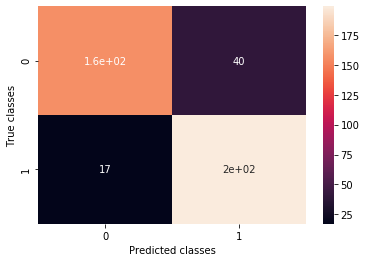

In [23]:
clf = GaussianNB()
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
print('F1 score(Accuracy): ', f1_score(y_test, y_pred, average='micro'))

## classification report
conf = confusion_matrix(y_test, y_pred)
print ('\n matrice de confusion \n',conf)

print ('\n',classification_report(y_test, 
                                  y_pred))

## classification chart
sns.heatmap(confusion_matrix(y_test, y_pred),annot=True)
plot.ylabel('True classes')
plot.xlabel('Predicted classes')
plot.show()

## Classifieur RandomForest & Sa matrice de confusion

/home/karim/env/lib/python3.6/site-packages/sklearn/metrics/_classification.py:1321: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'micro'). You may use labels=[pos_label] to specify a single positive class.
  % (pos_label, average), UserWarning)


F1 score(Accuracy):  0.9128329297820823

 matrice de confusion 
 [[185  12]
 [ 24 192]]

               precision    recall  f1-score   support

           1       0.89      0.94      0.91       197
           3       0.94      0.89      0.91       216

    accuracy                           0.91       413
   macro avg       0.91      0.91      0.91       413
weighted avg       0.91      0.91      0.91       413



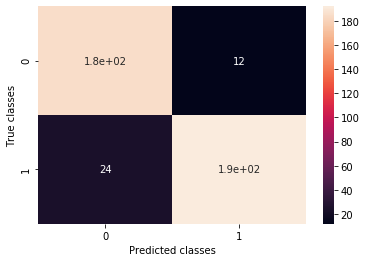

In [24]:
clf = RandomForestClassifier()
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
print('F1 score(Accuracy): ', f1_score(y_test, y_pred, pos_label='positive', average='micro'))

## classification report
conf = confusion_matrix(y_test, y_pred)
print ('\n matrice de confusion \n',conf)

print ('\n',classification_report(y_test, 
                                  y_pred))

## classification chart
sns.heatmap(confusion_matrix(y_test, y_pred),annot=True)
plot.ylabel('True classes')
plot.xlabel('Predicted classes')
plot.show()

## Classifieur DecisionTree & Sa matrice de confusion



/home/karim/env/lib/python3.6/site-packages/sklearn/metrics/_classification.py:1321: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'micro'). You may use labels=[pos_label] to specify a single positive class.
  % (pos_label, average), UserWarning)


F1 score(Accuracy):  0.8184019370460048

 matrice de confusion 
 [[146  51]
 [ 24 192]]

               precision    recall  f1-score   support

           1       0.86      0.74      0.80       197
           3       0.79      0.89      0.84       216

    accuracy                           0.82       413
   macro avg       0.82      0.82      0.82       413
weighted avg       0.82      0.82      0.82       413



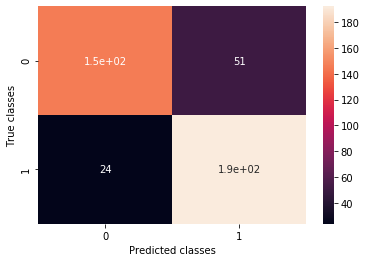

In [25]:
clf = DecisionTreeClassifier()
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
print('F1 score(Accuracy): ', f1_score(y_test, y_pred, pos_label='positive', average='micro'))

## classification report
conf = confusion_matrix(y_test, y_pred)
print ('\n matrice de confusion \n',conf)

print ('\n',classification_report(y_test, 
                                  y_pred))

## classification chart
sns.heatmap(confusion_matrix(y_test, y_pred),annot=True)
plot.ylabel('True classes')
plot.xlabel('Predicted classes')
plot.show()

## Classifieur Nearest Neighbors  & Sa matrice de confusion

F1 score(Accuracy):  0.7263922518159807

 matrice de confusion 
 [[140  57]
 [ 56 160]]

               precision    recall  f1-score   support

           1       0.71      0.71      0.71       197
           3       0.74      0.74      0.74       216

    accuracy                           0.73       413
   macro avg       0.73      0.73      0.73       413
weighted avg       0.73      0.73      0.73       413



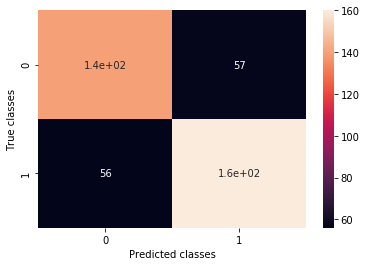

In [26]:
clf = KNeighborsClassifier()
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
print('F1 score(Accuracy): ', f1_score(y_test, y_pred, average='micro'))

## classification report
conf = confusion_matrix(y_test, y_pred)
print ('\n matrice de confusion \n',conf)

print ('\n',classification_report(y_test, 
                                  y_pred))

## classification chart
sns.heatmap(confusion_matrix(y_test, y_pred),annot=True)
plot.ylabel('True classes')
plot.xlabel('Predicted classes')
plot.show()

## Classifieur Linear SVC & Sa matrice de confusion

F1 score(Accuracy):  0.8934624697336562

 matrice de confusion 
 [[174  23]
 [ 21 195]]

               precision    recall  f1-score   support

           1       0.89      0.88      0.89       197
           3       0.89      0.90      0.90       216

    accuracy                           0.89       413
   macro avg       0.89      0.89      0.89       413
weighted avg       0.89      0.89      0.89       413



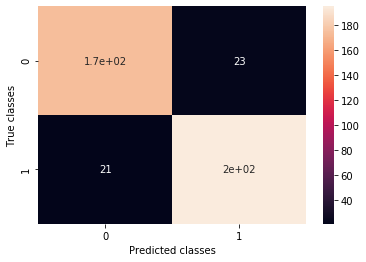

In [27]:
clf = LinearSVC()
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
print('F1 score(Accuracy): ', f1_score(y_test, y_pred, average='micro'))

## classification report
conf = confusion_matrix(y_test, y_pred)
print ('\n matrice de confusion \n',conf)

print ('\n',classification_report(y_test, 
                                  y_pred))

## classification chart
sns.heatmap(confusion_matrix(y_test, y_pred),annot=True)
plot.ylabel('True classes')
plot.xlabel('Predicted classes')
plot.show()


# Classifieur SVC & Sa matrice de confusion

F1 score(Accuracy):  0.47699757869249393

 matrice de confusion 
 [[197   0]
 [216   0]]

               precision    recall  f1-score   support

           1       0.48      1.00      0.65       197
           3       0.00      0.00      0.00       216

    accuracy                           0.48       413
   macro avg       0.24      0.50      0.32       413
weighted avg       0.23      0.48      0.31       413



/home/karim/env/lib/python3.6/site-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


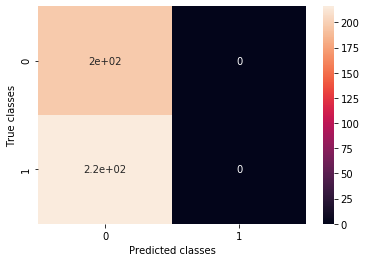

In [28]:
clf = SVC(gamma='auto')
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
print('F1 score(Accuracy): ', f1_score(y_test, y_pred, average='micro'))

## classification report
conf = confusion_matrix(y_test, y_pred)
print ('\n matrice de confusion \n',conf)

print ('\n',classification_report(y_test, 
                                  y_pred))

## classification chart
sns.heatmap(confusion_matrix(y_test, y_pred),annot=True)
plot.ylabel('True classes')
plot.xlabel('Predicted classes')
plot.show()


<h3> <br/><br/><br/>  Cross validation (K_Fold) <br/><br/> </h3> 



### Mise en place de cross validation ( Evalutaion de notre modèle) avec le classifieur Gaussian naive bayes
Pour que notre modèle soit appris sur plusieurs jeux de données, on a appliqué  10-fold cross validation pour évaluer la qualité du modèle. En effet, Le jeu de données sera découpé en 10 partie. Du coup, notre modèle sera entrainé sur 9 partie et testé sur une.

In [29]:
seed=7
k_fold = KFold(n_splits=10, shuffle=True, random_state=seed)
clf = GaussianNB()

scoring = 'accuracy'
t0 = time()
score = cross_val_score(clf, X, y, cv=k_fold, scoring=scoring)
print("Réalisé en %0.3fs" % (time() - t0))

print('Les différentes accuracy pour les 10 évaluations sont : \n',
      score,'\n')
print ('Accuracy moyenne : ',score.mean(), 
       ' standard deviation', score.std())

Réalisé en 3.608s
Les différentes accuracy pour les 10 évaluations sont : 
 [0.93478261 0.87681159 0.89130435 0.91304348 0.91970803 0.94160584
 0.88321168 0.9270073  0.86131387 0.89781022] 

Accuracy moyenne :  0.9046598963292076  standard deviation 0.02531449884437806


### Test de plusieurs classifieurs à la fois Pour trouver le meilleur
* KNeighborsClassifier
* DecisionTreeClassifier
* GaussianNB
* SVC et RandomForestClassifier

### Test du modèle pour chaque classifieur

In [30]:
seed = 7
scoring = 'accuracy'
models = []
# Ajout des classifieurs
models.append(('NB', GaussianNB()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('DTree', DecisionTreeClassifier()))
models.append(('LinearSVC', LinearSVC()))
models.append(('RFO', RandomForestClassifier()))
models.append(('SVM', SVC(gamma='auto')))

results = []
names = []
for name,model in models:
    kfold = KFold(n_splits=10, shuffle=True, random_state=seed)
    t0 = time()
    cv_results = cross_val_score(model, X, y, cv=kfold, scoring=scoring)

    print("Réalisé en %0.3fs" % (time() - t0))
    print('Les différentes accuracy pour les 10 évaluations sont : \n',
      cv_results,'\n')
    
    results.append(cv_results)
    names.append(name)
    print ('Accuracy moyenne de : ', name," = ", cv_results.mean(), ' standard deviation', cv_results.std())
    #print(msg) 
    



Réalisé en 3.609s
Les différentes accuracy pour les 10 évaluations sont : 
 [0.93478261 0.87681159 0.89130435 0.91304348 0.91970803 0.94160584
 0.88321168 0.9270073  0.86131387 0.89781022] 

Accuracy moyenne de :  NB  =  0.9046598963292076  standard deviation 0.02531449884437806
Réalisé en 90.976s
Les différentes accuracy pour les 10 évaluations sont : 
 [0.66666667 0.75362319 0.8115942  0.7173913  0.75182482 0.72262774
 0.72262774 0.68613139 0.74452555 0.77372263] 

Accuracy moyenne de :  KNN  =  0.7350735216333439  standard deviation 0.03969948510583537
Réalisé en 28.931s
Les différentes accuracy pour les 10 évaluations sont : 
 [0.86231884 0.84057971 0.84782609 0.86231884 0.91240876 0.93430657
 0.90510949 0.81021898 0.86861314 0.90510949] 

Accuracy moyenne de :  DTree  =  0.8748809901618534  standard deviation 0.03634814955774586
Réalisé en 2.810s
Les différentes accuracy pour les 10 évaluations sont : 
 [0.89855072 0.91304348 0.89130435 0.89855072 0.89051095 0.9270073
 0.91240876 

**Afficher les résultats des différents classifieurs(boxplot)**

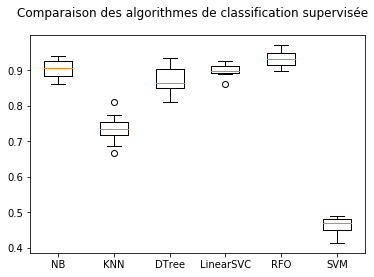

In [31]:
fig = plot.figure()
fig.suptitle('Comparaison des algorithmes de classification supervisée')
ax = fig.add_subplot(111)
plot.boxplot(results)
ax.set_xticklabels(names)
plot.show()

## Hyperparameters and Visualization

##  1- Naive Bayes

In [32]:
#from sklearn.preprocessing import PowerTransformer

nb_classifier = GaussianNB()

params_NB = {'var_smoothing': np.logspace(0,-9, num=100)}

gs_NB = GridSearchCV(estimator=nb_classifier, 
                     param_grid=params_NB, 
                     cv=5,
                     verbose=1, 
                     scoring='accuracy')

#Data_transformed = PowerTransformer().fit_transform(Data)

gs_NB.fit(X_train, y_train);

Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:  2.5min finished


Chercher la meilleure accuracy pour les paramètres

In [33]:
gs_NB.best_params_

print ('meilleur score ',
       gs_NB.best_score_,'\n')
print ('meilleurs paramètres', 
       gs_NB.best_params_,'\n')
print ('meilleur estimateur',       gs_NB.best_estimator_,'\n') 

meilleur score  0.8366472366148532 

meilleurs paramètres {'var_smoothing': 1.232846739442066e-06} 

meilleur estimateur GaussianNB(priors=None, var_smoothing=1.232846739442066e-06) 



***Visualisation de résultats de GaussinNB grid search***

In [34]:
results_NB = pd.DataFrame(gs_NB.cv_results_['params'])
results_NB['test_score'] = gs_NB.cv_results_['mean_test_score']

alt.Chart(results_NB, 
          title='Compraison de performance de  GaussinNB'
         ).mark_line(point=True).encode(
    alt.X('var_smoothing', title='Var. Smoothing'),
    alt.Y('test_score', title='Mean CV Score', scale=alt.Scale(zero=False))
).interactive()

alt.Chart(...)

## 2- Random Forest

In [35]:
params_RFO = {'n_estimators': [4, 6, 9], 
              'max_features': ['log2', 'sqrt','auto'], 
              'criterion': ['entropy', 'gini'],
              'max_depth': [2, 3, 5, 10], 
              'min_samples_split': [2, 3, 5],
              'min_samples_leaf': [1,5,8]
             }

gs_RFO = GridSearchCV(estimator=RandomForestClassifier(),  
                     param_grid=params_RFO,
                     scoring='accuracy',
                     cv=5,
                     n_jobs=-1,
                    iid=True,
                    return_train_score=True)

In [36]:
gs_RFO.fit(X_train, y_train)  
print ('meilleur score ', gs_RFO.best_score_,'\n')
print ('meilleurs paramètres', gs_RFO.best_params_,'\n')
print ('meilleur estimateur', gs_RFO.best_estimator_,'\n')

meilleur score  0.7148803329864725 

meilleurs paramètres {'criterion': 'gini', 'max_depth': 10, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 9} 

meilleur estimateur RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=10, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=9,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False) 



In [37]:
results_RFO = pd.DataFrame(gs_RFO.cv_results_['params'])
results_RFO['test_score'] = gs_RFO.cv_results_['mean_test_score']
results_RFO.columns

alt.Chart(results_RFO, 
          title='Comparaison de performance de RandomForest'
         ).mark_line(point=True).encode(
    alt.X('max_depth', title='Maximum Depth'),
    alt.Y('test_score', title='Mean CV Score', aggregate='average', scale=alt.Scale(zero=False)),
    color='criterion'
).interactive()


alt.Chart(...)

A partir de l'histogramme nous pouvons remarquer que le meilleur hyperparamètre est le suivant: entropy avec une profondeur maximale de 10 et une valeur min_samples_split de 2.

## 3- Decision Tree

In [38]:
df_classifier = DecisionTreeClassifier(random_state=999)

params_DT = {'criterion': ['gini', 'entropy'],
             'max_depth': [1, 2, 3, 4, 5, 6, 7, 8],
             'min_samples_split': [2, 3]}

gs_DT = GridSearchCV(estimator=df_classifier, 
                     param_grid=params_DT, 
                     cv=5,
                     verbose=1, 
                     scoring='accuracy')

gs_DT.fit(X_train, y_train);

Fitting 5 folds for each of 32 candidates, totalling 160 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 160 out of 160 | elapsed:  1.6min finished


In [39]:
gs_DT.best_params_

{'criterion': 'entropy', 'max_depth': 8, 'min_samples_split': 2}

In [40]:

print ('meilleur score ', gs_DT.best_score_,'\n')
print ('meilleurs paramètres ', gs_DT.best_params_,'\n')
print ('meilleur estimateur ', gs_DT.best_estimator_,'\n') 

meilleur score  0.7200669257340242 

meilleurs paramètres  {'criterion': 'entropy', 'max_depth': 8, 'min_samples_split': 2} 

meilleur estimateur  DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=8, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=999, splitter='best') 



Nous observons que le meilleur ensemble d'hyperparamètres est le suivant: entropy avec une profondeur maximale de 8 et une valeur min_samples_split de 2.

In [41]:
results_DT = pd.DataFrame(gs_DT.cv_results_['params'])
results_DT['test_score'] = gs_DT.cv_results_['mean_test_score']
results_DT.columns

alt.Chart(results_DT, 
          title='Performance  de DecisionTree'
         ).mark_line(interpolate="basis").encode(
    alt.X('max_depth', title='Maximum Depth'),
    alt.Y('test_score', title='Mean CV Score', aggregate='average', scale=alt.Scale(zero=False)),
    color='criterion'
).interactive()

alt.Chart(...)

## Mise en place d'un gridsearch pour trouver le meilleur classifieur


In [42]:
params_RFO = {'n_estimators': [4, 6, 9], 
              'max_features': ['log2', 'sqrt','auto'], 
              'criterion': ['entropy', 'gini'],
              'max_depth': [2, 3, 5, 10], 
              'min_samples_split': [2, 3, 5],
              'min_samples_leaf': [1,5,8]
             }
gs_RFO = GridSearchCV(estimator=RandomForestClassifier(),  
                     param_grid=params_RFO,
                     scoring='accuracy',
                     cv=5,
                     n_jobs=-1,
                    iid=True,
                    return_train_score=True)



params_DT = {'criterion': ['gini', 'entropy'],
             'max_depth': [1, 2, 3, 4, 5, 6, 7, 8],
             'min_samples_split': [2, 3]}
gs_DT = GridSearchCV(estimator=DecisionTreeClassifier(random_state=999), 
                     param_grid=params_DT, 
                     cv=5,
                     verbose=1, 
                     scoring='accuracy')


params_NB = {'var_smoothing': np.logspace(0,-9, num=100)}
gs_NB = GridSearchCV(estimator=GaussianNB(), 
                     param_grid=params_NB, 
                     cv=5,
                     verbose=1, 
                     scoring='accuracy')


grids = [gs_DT, gs_RFO, gs_NB]

grid_dict={0:'Decision Tree', 1:'Random Forest', 2:'Naive Bayes'}

best_acc = 0.0
best_clf = 0.0
best_gs = ''

for idx,gs in enumerate(grids):
    print('\nClassifier: %s' % grid_dict[idx])
    gs.fit(X_train, y_train)
    print('Meilleurs paramètres : %s' % gs.best_params_)
    print ("meilleur score d'accurary : ",gs.best_score_,'\n')
    print ('meilleur estimateur : ',gs.best_estimator_,'\n')

    
    # Prediction sur le jeu de test avec les meilleurs paramètres
    t0 = time()
    result = gs.predict(X_test)
    print("Score d'accuracy pour les meilleurs paramètres sur jeu de test : %.3f"  % accuracy_score(y_test, result))
    print ('\n matrice de confusion \n',confusion_matrix(y_test, result))
    print ('\n',classification_report(y_test, result))
    
    if accuracy_score(y_test, result) > best_acc:
        best_acc = accuracy_score(y_test, result)
        best_gs = gs
        best_clf = idx
        
        
print('\nClassifier avec la meilleur accuracy sur le jeu de test\n', grid_dict[best_clf])        




Classifier: Decision Tree
Fitting 5 folds for each of 32 candidates, totalling 160 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 160 out of 160 | elapsed:  1.6min finished


Meilleurs paramètres : {'criterion': 'entropy', 'max_depth': 8, 'min_samples_split': 2}
meilleur score d'accurary :  0.7200669257340242 

meilleur estimateur :  DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=8, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=999, splitter='best') 

Score d'accuracy pour les meilleurs paramètres sur jeu de test : 0.746

 matrice de confusion 
 [[151  46]
 [ 59 157]]

               precision    recall  f1-score   support

           1       0.72      0.77      0.74       197
           3       0.77      0.73      0.75       216

    accuracy                           0.75       413
   macro avg       0.75      0.75      0.75       413
weighted avg      

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:  2.3min finished


Meilleurs paramètres : {'var_smoothing': 1.232846739442066e-06}
meilleur score d'accurary :  0.8366472366148532 

meilleur estimateur :  GaussianNB(priors=None, var_smoothing=1.232846739442066e-06) 

Score d'accuracy pour les meilleurs paramètres sur jeu de test : 0.860

 matrice de confusion 
 [[156  41]
 [ 17 199]]

               precision    recall  f1-score   support

           1       0.90      0.79      0.84       197
           3       0.83      0.92      0.87       216

    accuracy                           0.86       413
   macro avg       0.87      0.86      0.86       413
weighted avg       0.86      0.86      0.86       413


Classifier avec la meilleur accuracy sur le jeu de test
 Naive Bayes


In [43]:
classifiers = {
    'RandomForestClassifier': RandomForestClassifier(),
    'DecisionTreeClassifier': DecisionTreeClassifier(),
    'NaiveBayesClassifier': GaussianNB()
}

params = {'RandomForestClassifier' : 
          [{'n_estimators': [4, 6, 9]}, 
            {'max_features': ['log2', 'sqrt','auto']}, 
            {'criterion': ['entropy', 'gini']},
            {'max_depth': [2, 3, 5, 10]}, 
            {'min_samples_split': [2, 3, 5]},
            {'min_samples_leaf': [1,5,8]}],
           'DecisionTreeClassifier': 
            [{'max_depth': [1,2,3,4,5,6,7,8,9,10]},
            {'criterion': ['gini', 'entropy']},
            {'min_samples_leaf': [1,2,3,4,5,6,7,8,9,10]}],
          'NaiveBayesClassifier': 
            [{'var_smoothing': np.logspace(0,-9, num=100)}]
         }

class Result:
     def __init__(self,name, score, parameters):
         self.name = name
         self.score = score
         self.parameters = parameters
     def __repr__(self):
         return repr((self.name, self.score, self.parameters))

       
results = []
for key,value in classifiers.items():
    gd_sr = GridSearchCV(estimator=value,  
                     param_grid=params[key],
                     scoring='accuracy',
                     cv=10,
                     n_jobs=1,
                     iid=True)
    gd_sr.fit(X_train, y_train)  
    result=Result(key,gd_sr.best_score_,
                  gd_sr.best_estimator_)
    results.append(result)   
    
    
    
results=sorted(results, 
               key=lambda result: result.score, 
               reverse=True) 

print ('Le meilleur resultat : \n')
print ('Classifier : ',results[0].name, 
       ' score %0.4f' %results[0].score, 
       ' avec ',results[0].parameters,'\n')

print ('Tous les résultats : \n')
for result in results:
    print ('Classifier : ',result.name,
           ' score %0.4f' %result.score,
           ' avec ',result.parameters,'\n')

Le meilleur resultat : 

Classifier :  RandomForestClassifier  score 0.9126  avec  RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='log2',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False) 

Tous les résultats : 

Classifier :  RandomForestClassifier  score 0.9126  avec  RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='log2',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,

##  Sauvegarde le pipeline 

In [44]:

pipeline = Pipeline([
    ('scaler',StandardScaler()),
    ('clf', GaussianNB())
])


t0 = time()
print ("Lancement du fit \n")
pipeline.fit(X_train, y_train)
print("Fit réalisé en %0.3fs" % (time() - t0))

result = pipeline.predict(X_test)
print('\n accuracy:',accuracy_score(result, y_test),'\n')

conf = confusion_matrix(y_test, result)
print ('\n matrice de confusion \n',conf)



print ('\n',classification_report(y_test, result))

print("\nSauvegarde du pipeline grid search avec succès") 
filename = 'bestModel.pkl'
pickle.dump(pipeline, open(filename, 'wb'))

Lancement du fit 

Fit réalisé en 0.724s

 accuracy: 0.8934624697336562 


 matrice de confusion 
 [[172  25]
 [ 19 197]]

               precision    recall  f1-score   support

           1       0.90      0.87      0.89       197
           3       0.89      0.91      0.90       216

    accuracy                           0.89       413
   macro avg       0.89      0.89      0.89       413
weighted avg       0.89      0.89      0.89       413


Sauvegarde du pipeline grid search avec succès


In [45]:
print ("Chargement du modèle \n")
filename = 'bestModel.pkl'
clf_loaded = pickle.load(open(filename, 'rb'))


print ("Sélection aléatoire de 15 assertions \n")
samples=[]
samples_result=[]
sample_new=[]
for i in df['truthRating'].head(15).index:
    sample_new.append(i)
    samples.append(X.values[i])
    samples_result.append(df.loc[ i , 'truthRating'])
    
print ("Prédiction des assertions séléctionnées\n")    
    
result = clf_loaded.predict(samples)

print ("Valeurs réelles vs. valeurs prédites\n") 
for i in range(len(result)):
    print ("assertion : ",sample_new[i], 
           " \t réelle ", samples_result[i], 
           "\t prédite ", result [i])


Chargement du modèle 

Sélection aléatoire de 15 assertions 

Prédiction des assertions séléctionnées

Valeurs réelles vs. valeurs prédites

assertion :  4  	 réelle  1 	 prédite  1
assertion :  7  	 réelle  1 	 prédite  1
assertion :  9  	 réelle  1 	 prédite  1
assertion :  10  	 réelle  3 	 prédite  1
assertion :  11  	 réelle  1 	 prédite  1
assertion :  19  	 réelle  1 	 prédite  1
assertion :  21  	 réelle  1 	 prédite  1
assertion :  22  	 réelle  1 	 prédite  1
assertion :  24  	 réelle  1 	 prédite  1
assertion :  25  	 réelle  1 	 prédite  1
assertion :  26  	 réelle  1 	 prédite  1
assertion :  27  	 réelle  1 	 prédite  1
assertion :  28  	 réelle  1 	 prédite  1
assertion :  30  	 réelle  1 	 prédite  1
assertion :  31  	 réelle  3 	 prédite  3




<h2><center> <br/><br/><br/> Partie 2: Dataset {VRAI et FAUX} vs. {MIXTURE})  <br/><br/> </center></h2> 


In [56]:
df = df_part2[(df['truthRating'] == 3) | (df_part2['truthRating'] == 1) | (df_part2['truthRating'] == 2)] 
df.loc[df.truthRating==1, 'truthRating'] = 7
df.loc[df.truthRating==3, 'truthRating'] = 7

In [58]:
# enlever les valeurs manquantes
df.dropna(inplace=True)
array = df.values
X = array[:,  [0,1,2,3,4]] # variable d'apprentissage
y = array[:, 5]
y=y.astype('int')          # variable de prédiction

# OverSampling 
ros = RandomOverSampler(random_state=42)
X_res, y_res = ros.fit_resample(X, y)
X = X_res
y = y_res

# prétraitements des données
for i in range(X.shape[0]):
    X[i] = clean_assertions(X[i])

# Mise en place d'un pipeline des données et appliquer TfidfVectorizer (pour transformer données textuelles en une séquence de mots)
df2 = pd.DataFrame(data=X, columns=["text", "headline", "source", "keywords", "author"])
transformer = FeatureUnion([
                ('text_tfidf', 
                  Pipeline([('extract_field', FunctionTransformer(lambda x: x['text'], validate=False)),
                            ('tfidf', TfidfVectorizer(ngram_range=(1, 2)))])),
                ('headline_tfidf', 
                  Pipeline([('extract_field', FunctionTransformer(lambda x:  x["headline"], validate=False)),
                            ('tfidf', TfidfVectorizer(ngram_range=(1, 2)))])),
                ('keywords_tfidf', 
                  Pipeline([('extract_field', FunctionTransformer(lambda x:  x["keywords"], validate=False)),
                            ('tfidf', TfidfVectorizer(ngram_range=(1, 2)))])),
                ('author_tfidf', 
                  Pipeline([('extract_field', FunctionTransformer(lambda x:  x["author"], validate=False)),
                            ('tfidf', TfidfVectorizer(ngram_range=(1, 2)))])),
                ('source_tfidf', 
                  Pipeline([('extract_field', 
                              FunctionTransformer(lambda x:  x["source"], validate=False)),
                            ('tfidf', TfidfVectorizer())]))
                ])

transformer.fit(df2)
text_vocab = transformer.transformer_list[0][1].steps[1][1].get_feature_names() 
headline_vocab = transformer.transformer_list[1][1].steps[1][1].get_feature_names() 
keywords_vocab = transformer.transformer_list[2][1].steps[1][1].get_feature_names() 
author_vocab = transformer.transformer_list[3][1].steps[1][1].get_feature_names()
source_vocab = transformer.transformer_list[4][1].steps[1][1].get_feature_names() 
vocab = text_vocab + headline_vocab + keywords_vocab + author_vocab  + source_vocab

X = pd.DataFrame(
    data=transformer.transform(df2).toarray(),
    columns=vocab)


# créer le jeu de données d'apprentissage(70%) et de test(30%)
validation_size=0.69 
testsize= 1-validation_size
seed=30
X_train,X_test,y_train,y_test=train_test_split(X, 
                                               y, 
                                               train_size=validation_size, 
                                               random_state=seed,
                                               test_size=testsize)


# cross validation
seed=7
k_fold = KFold(n_splits=10, shuffle=True, random_state=seed)


## Accuracy moyenne de différents classifieurs


In [59]:

seed = 7
scoring = 'accuracy'
models = []
models.append(('NB', GaussianNB()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('DTree', DecisionTreeClassifier()))
models.append(('LinearSVC', LinearSVC()))
models.append(('RFO', RandomForestClassifier()))
models.append(('SVM', SVC(gamma='auto')))
results = []
names = []
for name,model in models:
    kfold = KFold(n_splits=10, shuffle=True, random_state=seed)
    t0 = time()
    cv_results = cross_val_score(model, X, y, cv=kfold, scoring=scoring)    
    results.append(cv_results)
    names.append(name)
    print (name,': accuracy moyenne = ', cv_results.mean(), ' standard deviation = ', cv_results.std())


NB : accuracy moyenne =  0.7432432432432433  standard deviation =  0.029631286645763776
KNN : accuracy moyenne =  0.6783783783783784  standard deviation =  0.03785713793490406
DTree : accuracy moyenne =  0.7281081081081082  standard deviation =  0.03367441757226492
LinearSVC : accuracy moyenne =  0.7686486486486487  standard deviation =  0.03177716423070068
RFO : accuracy moyenne =  0.7643243243243243  standard deviation =  0.03861745102592811
SVM : accuracy moyenne =  0.47729729729729736  standard deviation =  0.020232397051040976


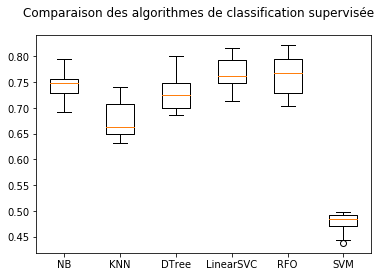

In [60]:
# visualisaer les résultats de l'accuracy moyenne des classifieurs
fig = plot.figure()
fig.suptitle('Comparaison des algorithmes de classification supervisée')
ax = fig.add_subplot(111)
plot.boxplot(results)
ax.set_xticklabels(names)
plot.show()

In [61]:
# chercher la meilleure accuracy pour les paramètres
nb_classifier = GaussianNB()
params_NB = {'var_smoothing': np.logspace(0,-9, num=100)}
gs_NB = GridSearchCV(estimator=nb_classifier, 
                     param_grid=params_NB, 
                     cv=5,
                     verbose=1, 
                     scoring='accuracy')
gs_NB.fit(X_train, y_train);
gs_NB.best_params_
print ('meilleur score ', gs_NB.best_score_,'\n')
print ('meilleurs paramètres', gs_NB.best_params_,'\n')
print ('meilleur estimateur', gs_NB.best_estimator_,'\n') 

# visualiser les résultats de GaussinNB grid search
results_NB = pd.DataFrame(gs_NB.cv_results_['params'])
results_NB['test_score'] = gs_NB.cv_results_['mean_test_score']
alt.Chart(results_NB, title='Compraison de performance de  GaussinNB').mark_line(point=True).encode(
    alt.X('var_smoothing', title='Var. Smoothing'),
    alt.Y('test_score', title='Mean CV Score', scale=alt.Scale(zero=False))
).interactive()

Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:  5.2min finished


meilleur score  0.7350949754901961 

meilleurs paramètres {'var_smoothing': 0.006579332246575682} 

meilleur estimateur GaussianNB(priors=None, var_smoothing=0.006579332246575682) 



alt.Chart(...)

## Mise en place d'un gridsearch pour trouver le meilleur classifieur

In [62]:
params_RFO = {'n_estimators': [4, 6, 9], 
              'max_features': ['log2', 'sqrt','auto'], 
              'criterion': ['entropy', 'gini'],
              'max_depth': [2, 3, 5, 10], 
              'min_samples_split': [2, 3, 5],
              'min_samples_leaf': [1,5,8]
             }
gs_RFO = GridSearchCV(estimator=RandomForestClassifier(),  
                     param_grid=params_RFO,
                     scoring='accuracy',
                     cv=5,
                     n_jobs=-1,
                    iid=True,
                    return_train_score=True)



params_DT = {'criterion': ['gini', 'entropy'],
             'max_depth': [1, 2, 3, 4, 5, 6, 7, 8],
             'min_samples_split': [2, 3]}
gs_DT = GridSearchCV(estimator=DecisionTreeClassifier(random_state=999), 
                     param_grid=params_DT, 
                     cv=5,
                     verbose=1, 
                     scoring='accuracy')


params_NB = {'var_smoothing': np.logspace(0,-9, num=100)}
gs_NB = GridSearchCV(estimator=GaussianNB(), 
                     param_grid=params_NB, 
                     cv=5,
                     verbose=1, 
                     scoring='accuracy')


grids = [gs_DT, gs_RFO, gs_NB]

grid_dict={0:'Decision Tree', 1:'Random Forest', 2:'Naive Bayes'}

best_acc = 0.0
best_clf = 0.0
best_gs = ''

for idx,gs in enumerate(grids):
    print('\nClassifier: %s' % grid_dict[idx])
    gs.fit(X_train, y_train)
    print('Meilleurs paramètres : %s' % gs.best_params_)
    print ("meilleur score d'accurary : ",gs.best_score_,'\n')
    print ('meilleur estimateur : ',gs.best_estimator_,'\n')

    
    # Prediction sur le jeu de test avec les meilleurs paramètres
    t0 = time()
    result = gs.predict(X_test)
    print("Score d'accuracy pour les meilleurs paramètres sur jeu de test : %.3f"  % accuracy_score(y_test, result))
    print ('\n matrice de confusion \n',confusion_matrix(y_test, result))
    print ('\n',classification_report(y_test, result))
    
    if accuracy_score(y_test, result) > best_acc:
        best_acc = accuracy_score(y_test, result)
        best_gs = gs
        best_clf = idx
        
        
print('\nClassifier avec la meilleur accuracy sur le jeu de test\n', grid_dict[best_clf])        




Classifier: Decision Tree
Fitting 5 folds for each of 32 candidates, totalling 160 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 160 out of 160 | elapsed:  3.5min finished


Meilleurs paramètres : {'criterion': 'entropy', 'max_depth': 8, 'min_samples_split': 2}
meilleur score d'accurary :  0.7233241421568627 

meilleur estimateur :  DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=8, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=999, splitter='best') 

Score d'accuracy pour les meilleurs paramètres sur jeu de test : 0.702

 matrice de confusion 
 [[225  47]
 [124 178]]

               precision    recall  f1-score   support

           2       0.64      0.83      0.72       272
           7       0.79      0.59      0.68       302

    accuracy                           0.70       574
   macro avg       0.72      0.71      0.70       574
weighted avg      

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:  6.5min finished


Meilleurs paramètres : {'var_smoothing': 0.006579332246575682}
meilleur score d'accurary :  0.7350949754901961 

meilleur estimateur :  GaussianNB(priors=None, var_smoothing=0.006579332246575682) 

Score d'accuracy pour les meilleurs paramètres sur jeu de test : 0.739

 matrice de confusion 
 [[224  48]
 [102 200]]

               precision    recall  f1-score   support

           2       0.69      0.82      0.75       272
           7       0.81      0.66      0.73       302

    accuracy                           0.74       574
   macro avg       0.75      0.74      0.74       574
weighted avg       0.75      0.74      0.74       574


Classifier avec la meilleur accuracy sur le jeu de test
 Naive Bayes


In [63]:
classifiers = {
    'RandomForestClassifier': RandomForestClassifier(),
    'DecisionTreeClassifier': DecisionTreeClassifier(),
    'NaiveBayesClassifier': GaussianNB()
}

params = {'RandomForestClassifier' : 
          [{'n_estimators': [4, 6, 9]}, 
            {'max_features': ['log2', 'sqrt','auto']}, 
            {'criterion': ['entropy', 'gini']},
            {'max_depth': [2, 3, 5, 10]}, 
            {'min_samples_split': [2, 3, 5]},
            {'min_samples_leaf': [1,5,8]}],
           'DecisionTreeClassifier': 
            [{'max_depth': [1,2,3,4,5,6,7,8,9,10]},
            {'criterion': ['gini', 'entropy']},
            {'min_samples_leaf': [1,2,3,4,5,6,7,8,9,10]}],
          'NaiveBayesClassifier': 
            [{'var_smoothing': np.logspace(0,-9, num=100)}]
         }

class Result:
     def __init__(self,name, score, parameters):
         self.name = name
         self.score = score
         self.parameters = parameters
     def __repr__(self):
         return repr((self.name, self.score, self.parameters))

       
results = []
for key,value in classifiers.items():
    gd_sr = GridSearchCV(estimator=value,  
                     param_grid=params[key],
                     scoring='accuracy',
                     cv=10,
                     n_jobs=1,
                     iid=True)
    gd_sr.fit(X_train, y_train)  
    result=Result(key,gd_sr.best_score_,
                  gd_sr.best_estimator_)
    results.append(result)   
    
    
    
results=sorted(results, 
               key=lambda result: result.score, 
               reverse=True) 

print ('Le meilleur resultat : \n')
print ('Classifier : ',results[0].name, 
       ' score %0.4f' %results[0].score, 
       ' avec ',results[0].parameters,'\n')

print ('Tous les résultats : \n')
for result in results:
    print ('Classifier : ',result.name,
           ' score %0.4f' %result.score,
           ' avec ',result.parameters,'\n')

Le meilleur resultat : 

Classifier :  RandomForestClassifier  score 0.7508  avec  RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=3,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False) 

Tous les résultats : 

Classifier :  RandomForestClassifier  score 0.7508  avec  RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,

In [66]:


pipeline = Pipeline([
    ('scaler',StandardScaler()),
    ('clf', RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=10, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False))
])


t0 = time()
print ("Lancement du fit \n")
pipeline.fit(X_train, y_train)
print("Fit réalisé en %0.3fs" % (time() - t0))

result = pipeline.predict(X_test)
print('\n accuracy:',accuracy_score(result, y_test),'\n')

conf = confusion_matrix(y_test, result)
print ('\n matrice de confusion \n',conf)



print ('\n',classification_report(y_test, result))

print("\n=========== Sauvegarde du pipeline grid search avec succès ============") 
filename = 'bestModelMixture.pkl'
pickle.dump(pipeline, open(filename, 'wb'))


Lancement du fit 

Fit réalisé en 2.510s

 accuracy: 0.7125435540069687 


 matrice de confusion 
 [[231  41]
 [124 178]]

               precision    recall  f1-score   support

           2       0.65      0.85      0.74       272
           7       0.81      0.59      0.68       302

    accuracy                           0.71       574
   macro avg       0.73      0.72      0.71       574
weighted avg       0.74      0.71      0.71       574


=========== Sauvegarde du pipeline grid search avec succès ============
